In [ ]:
!pip install shap
import shap
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split

import tensorflow as tf    
tf.compat.v1.disable_v2_behavior() # <-- HERE !

print("SHAP version is:", shap.__version__)
print("Tensorflow version is:", tf.__version__)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 569 kB 6.0 MB/s 
Instructions for updating:
non-resource variables are not supported in the long term
SHAP version is: 0.41.0
Tensorflow version is: 2.8.2


In [ ]:
import tensorflow as tf
tf.compat.v1.disable_v2_behavior()

In [ ]:
from matplotlib import pyplot as plt
plt.rcParams["figure.figsize"] = (30,10)

In [ ]:
model = tf.keras.models.load_model("/content/drive/MyDrive/dissertation/time_series_classification/rat1_post/lstm_1.h5")

In [ ]:
print(model.layers[-1].output)

Tensor("dense_3/Softmax:0", shape=(?, 3), dtype=float32)


In [ ]:
X= np.load("/content/drive/MyDrive/dissertation/rat1_post_X.npy")
y = np.load("/content/drive/MyDrive/dissertation/rat1_post_y.npy")

In [ ]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size = 0.1, random_state = 8)
X_trn,X_val,y_trn,y_val = train_test_split(X_train,y_train,test_size = 0.1, random_state = 8)
print(X_trn.shape,X_val.shape,X_test.shape)

(412, 17, 138) (46, 17, 138) (51, 17, 138)


In [ ]:
import scipy.io
data = scipy.io.loadmat("/content/drive/MyDrive/dissertation/LearningData(1).mat")
print(data.keys())

dict_keys(['__header__', '__version__', '__globals__', 'CELLLAB_ALL', 'rmat_post', 'rmat_pre', 'tMOT', 'tsamples', 'vmatpost', 'vmatpre'])


1 - PYR(red)
3 - PV(blue)
4 - SOM(green)
5 - VIP(yellow)
2 - NONE

y labels 0-vertical, 1-angled, 2-gray corridor

In [ ]:
y_test

array([2, 0, 1, 2, 1, 2, 0, 0, 2, 2, 0, 2, 2, 0, 2, 2, 2, 2, 0, 2, 0, 0,
       0, 1, 2, 2, 2, 0, 1, 1, 2, 1, 0, 1, 1, 1, 1, 2, 1, 1, 2, 0, 2, 1,
       0, 2, 0, 2, 0, 1, 1])

In [ ]:
def analysis_shap(model,i):
  plt.rcParams["figure.figsize"] = (30,10)
  ypred = np.argmax(model.predict(X_test), axis = 1)
  print(ypred.shape, ypred)
  features = list(range(0,138))
  explainer = shap.DeepExplainer(model,X_trn)
  d={1:[],3:[],4:[],5:[]}
  if(ypred[i] == y_test[i]):
      print("class = {}".format(ypred[i]))
      b = X_test[i].reshape(1,17,138)
      shap_values = explainer.shap_values(b)[ypred[i]]
      #print(shap_values.shape)
      before_stimulus = np.take(shap_values,np.array(list(range(0,8))), axis = 1)
      #print(before_stimulus.shape)
      after_stimulus = np.take(shap_values,np.array(list(range(8,17))), axis = 1)
      #print(after_stimulus.shape)
      m1 = np.mean(before_stimulus, axis = 1)
      #print(m1.shape)
      m2 = np.mean(after_stimulus, axis = 1)
      #print(m2.shape)
      a = data['CELLLAB_ALL'][0][0].reshape(138)
      #print(a)
      unique, counts = np.unique(a, return_counts=True)
      #print(unique,counts)
      for cell in unique:
        ind = np.where(a == cell)
        #print(cell,ind)
        d[cell].append(np.sum(np.take(m1,ind, axis = 1)))
        d[cell].append(np.sum(np.take(m2,ind,axis = 1)))
        #print(np.sum(np.take(m1,ind,axis = 1)))
        #print(np.sum(np.take(m2,ind,axis = 1)))
  return d

In [ ]:
def plot_importance(d):
  l1,l2 = [],[]
  plt.rcParams["figure.figsize"] = (8,6)
  for key in d.keys():
    l1.append(d[key][0])
    l2.append(d[key][1])
  cells = ["PYR","PV","SOM","VIP"]
  x_axis = np.arange(len(cells))
  plt.bar(x_axis -0.2, l1, width=0.4, label = 'before_stimulus_onset')
  plt.bar(x_axis +0.2, l2, width=0.4, label = 'after_stimulus_onset')
  plt.xticks(x_axis, cells)
  plt.xlabel("cell type")
  plt.ylabel("Feature Importance")
  plt.legend()
  plt.show()

In [ ]:
d = analysis_shap(model,0)
plot_importance(d)

(51,) [2 0 1 2 1 2 0 0 2 2 0 2 2 0 2 2 2 2 0 2 0 0 0 1 2 2 2 0 1 1 2 1 0 1 1 1 1
 2 1 1 2 0 2 0 0 2 0 2 0 1 1]
class = 0


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


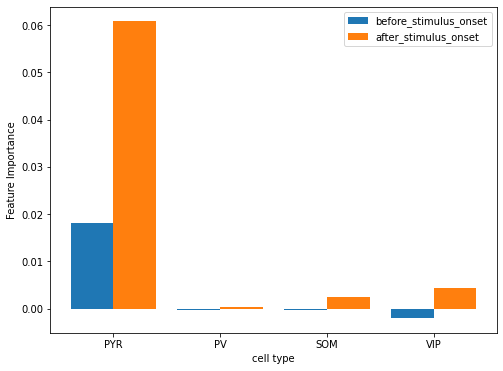

In [ ]:
d = analysis_shap(model,1)
plot_importance(d)

### class = 0

1
(51,) [2 0 1 2 1 2 0 0 2 2 0 2 2 0 2 2 2 2 0 2 0 0 0 1 2 2 2 0 1 1 2 1 0 1 1 1 1
 2 1 1 2 0 2 0 0 2 0 2 0 1 1]
class = 0


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


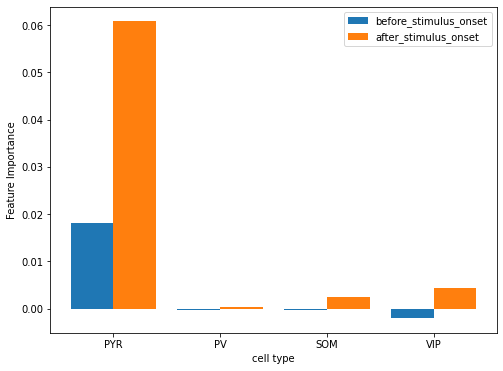

6
(51,) [2 0 1 2 1 2 0 0 2 2 0 2 2 0 2 2 2 2 0 2 0 0 0 1 2 2 2 0 1 1 2 1 0 1 1 1 1
 2 1 1 2 0 2 0 0 2 0 2 0 1 1]
class = 0


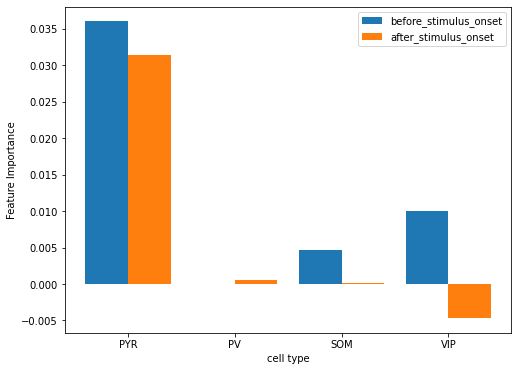

7
(51,) [2 0 1 2 1 2 0 0 2 2 0 2 2 0 2 2 2 2 0 2 0 0 0 1 2 2 2 0 1 1 2 1 0 1 1 1 1
 2 1 1 2 0 2 0 0 2 0 2 0 1 1]
class = 0


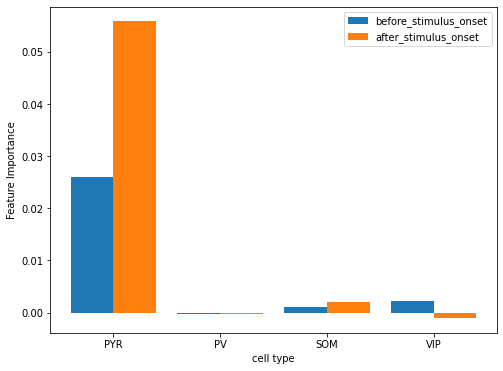

10
(51,) [2 0 1 2 1 2 0 0 2 2 0 2 2 0 2 2 2 2 0 2 0 0 0 1 2 2 2 0 1 1 2 1 0 1 1 1 1
 2 1 1 2 0 2 0 0 2 0 2 0 1 1]
class = 0


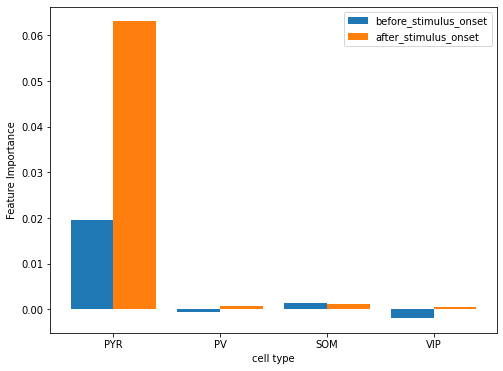

13
(51,) [2 0 1 2 1 2 0 0 2 2 0 2 2 0 2 2 2 2 0 2 0 0 0 1 2 2 2 0 1 1 2 1 0 1 1 1 1
 2 1 1 2 0 2 0 0 2 0 2 0 1 1]
class = 0


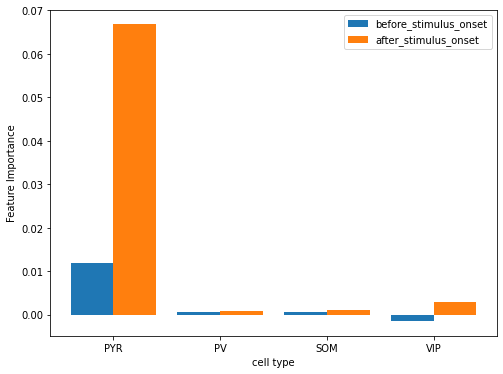

18
(51,) [2 0 1 2 1 2 0 0 2 2 0 2 2 0 2 2 2 2 0 2 0 0 0 1 2 2 2 0 1 1 2 1 0 1 1 1 1
 2 1 1 2 0 2 0 0 2 0 2 0 1 1]
class = 0


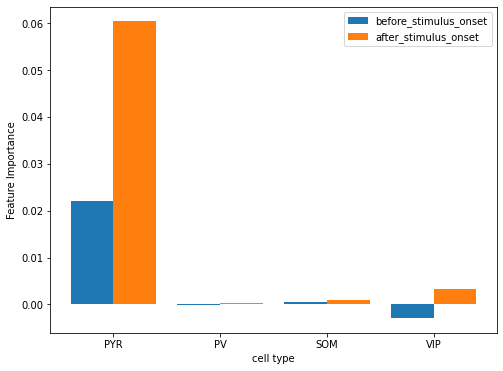

20
(51,) [2 0 1 2 1 2 0 0 2 2 0 2 2 0 2 2 2 2 0 2 0 0 0 1 2 2 2 0 1 1 2 1 0 1 1 1 1
 2 1 1 2 0 2 0 0 2 0 2 0 1 1]
class = 0


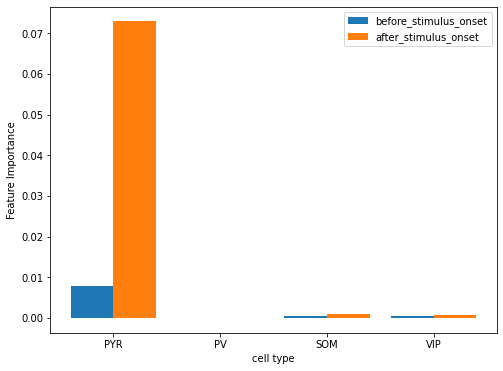

21
(51,) [2 0 1 2 1 2 0 0 2 2 0 2 2 0 2 2 2 2 0 2 0 0 0 1 2 2 2 0 1 1 2 1 0 1 1 1 1
 2 1 1 2 0 2 0 0 2 0 2 0 1 1]
class = 0


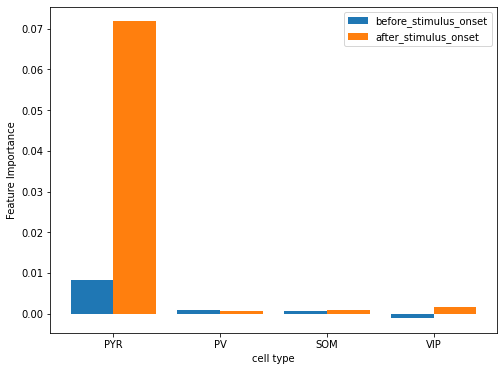

22
(51,) [2 0 1 2 1 2 0 0 2 2 0 2 2 0 2 2 2 2 0 2 0 0 0 1 2 2 2 0 1 1 2 1 0 1 1 1 1
 2 1 1 2 0 2 0 0 2 0 2 0 1 1]
class = 0


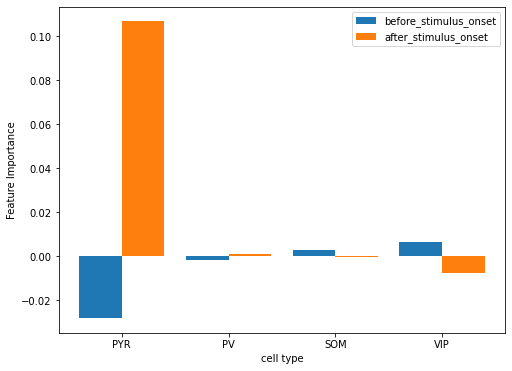

27
(51,) [2 0 1 2 1 2 0 0 2 2 0 2 2 0 2 2 2 2 0 2 0 0 0 1 2 2 2 0 1 1 2 1 0 1 1 1 1
 2 1 1 2 0 2 0 0 2 0 2 0 1 1]
class = 0


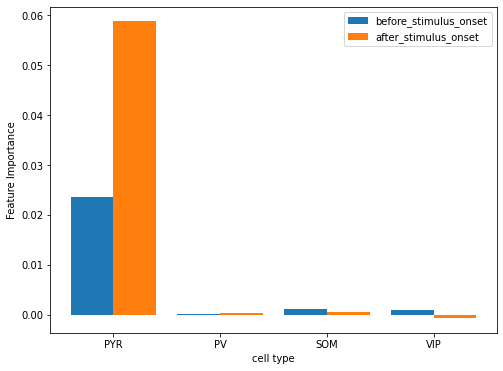

32
(51,) [2 0 1 2 1 2 0 0 2 2 0 2 2 0 2 2 2 2 0 2 0 0 0 1 2 2 2 0 1 1 2 1 0 1 1 1 1
 2 1 1 2 0 2 0 0 2 0 2 0 1 1]
class = 0


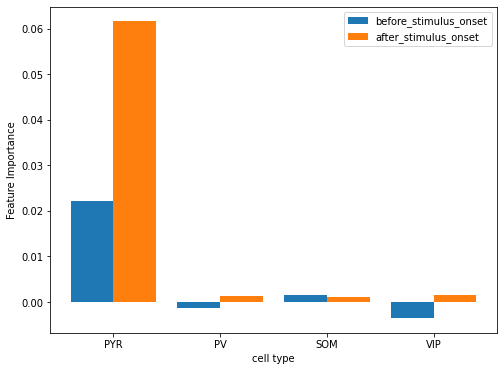

41
(51,) [2 0 1 2 1 2 0 0 2 2 0 2 2 0 2 2 2 2 0 2 0 0 0 1 2 2 2 0 1 1 2 1 0 1 1 1 1
 2 1 1 2 0 2 0 0 2 0 2 0 1 1]
class = 0


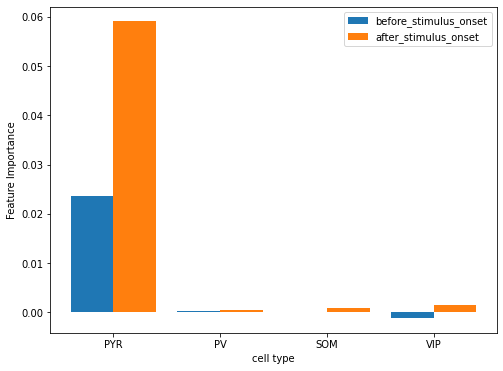

44
(51,) [2 0 1 2 1 2 0 0 2 2 0 2 2 0 2 2 2 2 0 2 0 0 0 1 2 2 2 0 1 1 2 1 0 1 1 1 1
 2 1 1 2 0 2 0 0 2 0 2 0 1 1]
class = 0


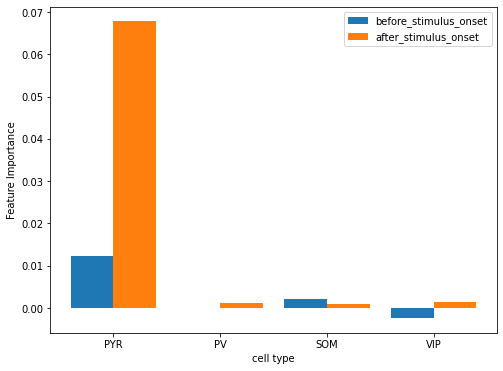

46
(51,) [2 0 1 2 1 2 0 0 2 2 0 2 2 0 2 2 2 2 0 2 0 0 0 1 2 2 2 0 1 1 2 1 0 1 1 1 1
 2 1 1 2 0 2 0 0 2 0 2 0 1 1]
class = 0


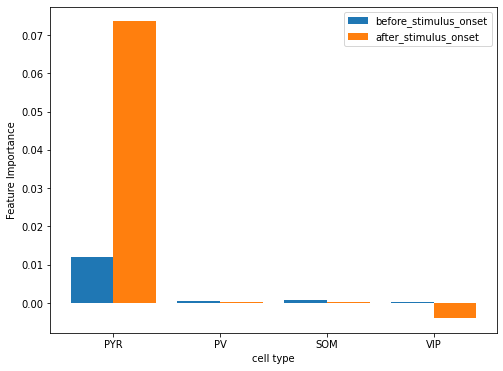

48
(51,) [2 0 1 2 1 2 0 0 2 2 0 2 2 0 2 2 2 2 0 2 0 0 0 1 2 2 2 0 1 1 2 1 0 1 1 1 1
 2 1 1 2 0 2 0 0 2 0 2 0 1 1]
class = 0


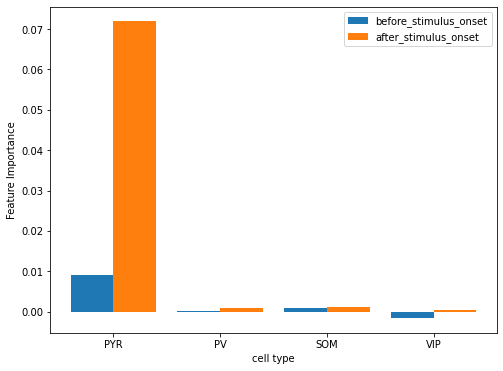

In [ ]:
for i,val in enumerate(y_test):
  d = {}
  if(val == 0):
    print(i)
    d = analysis_shap(model,i)
    plot_importance(d)

##class = 1

2
(51,) [2 0 1 2 1 2 0 0 2 2 0 2 2 0 2 2 2 2 0 2 0 0 0 1 2 2 2 0 1 1 2 1 0 1 1 1 1
 2 1 1 2 0 2 0 0 2 0 2 0 1 1]
class = 1


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


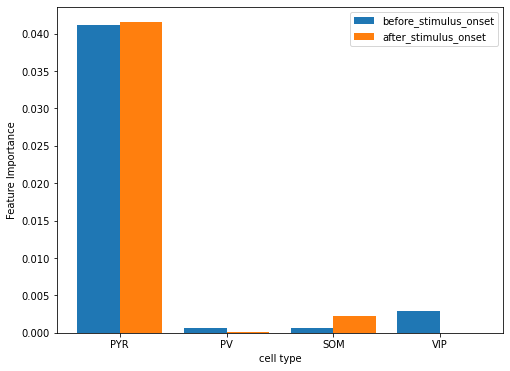

4
(51,) [2 0 1 2 1 2 0 0 2 2 0 2 2 0 2 2 2 2 0 2 0 0 0 1 2 2 2 0 1 1 2 1 0 1 1 1 1
 2 1 1 2 0 2 0 0 2 0 2 0 1 1]
class = 1


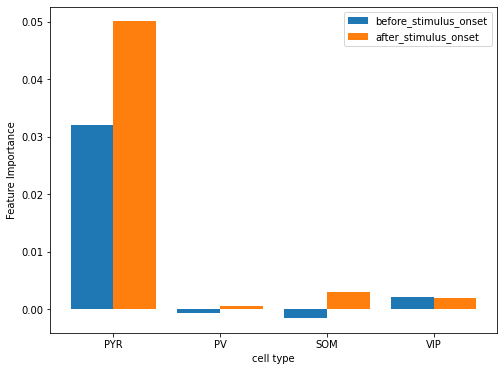

23
(51,) [2 0 1 2 1 2 0 0 2 2 0 2 2 0 2 2 2 2 0 2 0 0 0 1 2 2 2 0 1 1 2 1 0 1 1 1 1
 2 1 1 2 0 2 0 0 2 0 2 0 1 1]
class = 1


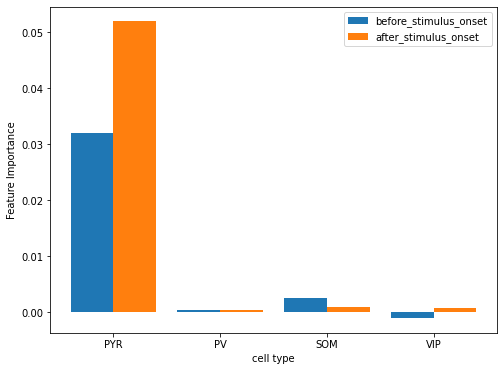

28
(51,) [2 0 1 2 1 2 0 0 2 2 0 2 2 0 2 2 2 2 0 2 0 0 0 1 2 2 2 0 1 1 2 1 0 1 1 1 1
 2 1 1 2 0 2 0 0 2 0 2 0 1 1]
class = 1


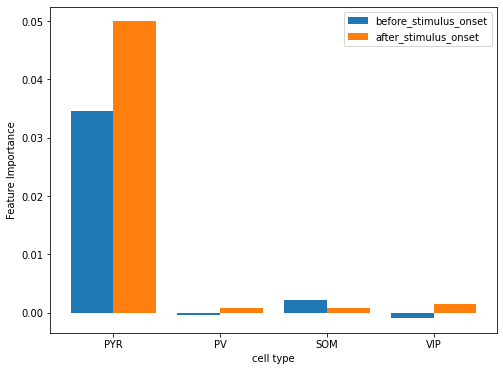

29
(51,) [2 0 1 2 1 2 0 0 2 2 0 2 2 0 2 2 2 2 0 2 0 0 0 1 2 2 2 0 1 1 2 1 0 1 1 1 1
 2 1 1 2 0 2 0 0 2 0 2 0 1 1]
class = 1


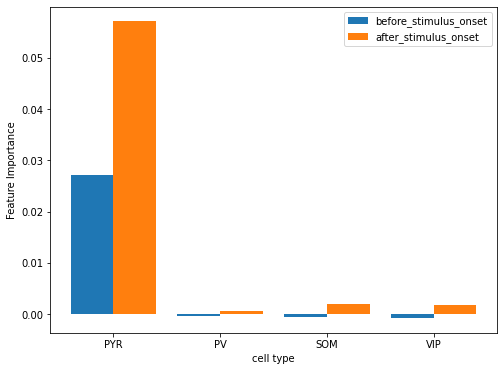

31
(51,) [2 0 1 2 1 2 0 0 2 2 0 2 2 0 2 2 2 2 0 2 0 0 0 1 2 2 2 0 1 1 2 1 0 1 1 1 1
 2 1 1 2 0 2 0 0 2 0 2 0 1 1]
class = 1


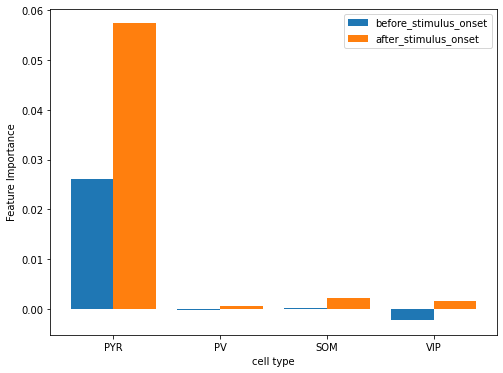

33
(51,) [2 0 1 2 1 2 0 0 2 2 0 2 2 0 2 2 2 2 0 2 0 0 0 1 2 2 2 0 1 1 2 1 0 1 1 1 1
 2 1 1 2 0 2 0 0 2 0 2 0 1 1]
class = 1


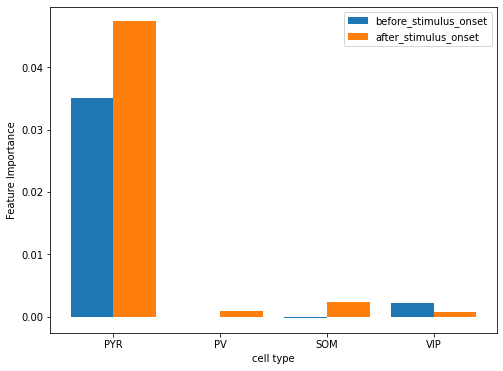

34
(51,) [2 0 1 2 1 2 0 0 2 2 0 2 2 0 2 2 2 2 0 2 0 0 0 1 2 2 2 0 1 1 2 1 0 1 1 1 1
 2 1 1 2 0 2 0 0 2 0 2 0 1 1]
class = 1


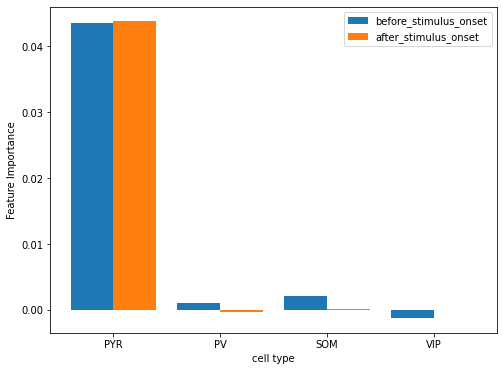

35
(51,) [2 0 1 2 1 2 0 0 2 2 0 2 2 0 2 2 2 2 0 2 0 0 0 1 2 2 2 0 1 1 2 1 0 1 1 1 1
 2 1 1 2 0 2 0 0 2 0 2 0 1 1]
class = 1


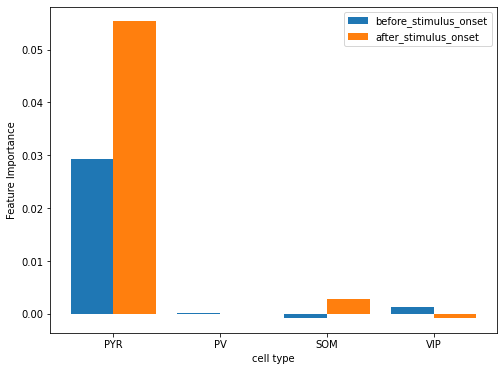

36
(51,) [2 0 1 2 1 2 0 0 2 2 0 2 2 0 2 2 2 2 0 2 0 0 0 1 2 2 2 0 1 1 2 1 0 1 1 1 1
 2 1 1 2 0 2 0 0 2 0 2 0 1 1]
class = 1


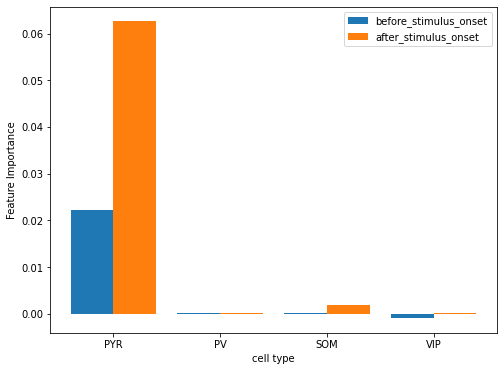

38
(51,) [2 0 1 2 1 2 0 0 2 2 0 2 2 0 2 2 2 2 0 2 0 0 0 1 2 2 2 0 1 1 2 1 0 1 1 1 1
 2 1 1 2 0 2 0 0 2 0 2 0 1 1]
class = 1


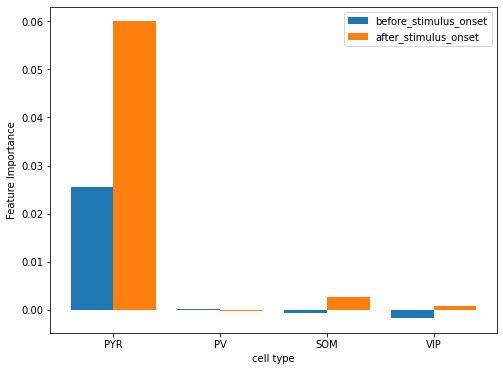

39
(51,) [2 0 1 2 1 2 0 0 2 2 0 2 2 0 2 2 2 2 0 2 0 0 0 1 2 2 2 0 1 1 2 1 0 1 1 1 1
 2 1 1 2 0 2 0 0 2 0 2 0 1 1]
class = 1


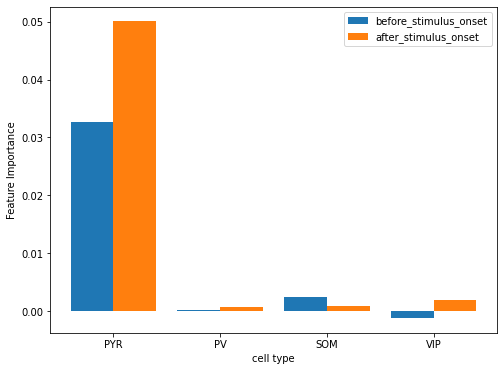

43
(51,) [2 0 1 2 1 2 0 0 2 2 0 2 2 0 2 2 2 2 0 2 0 0 0 1 2 2 2 0 1 1 2 1 0 1 1 1 1
 2 1 1 2 0 2 0 0 2 0 2 0 1 1]


IndexError: ignored

In [ ]:
for i,val in enumerate(y_test):
  d = {}
  if(val == 1):
    print(i)
    d = analysis_shap(model,i)
    plot_importance(d)

##class = 2

0
(51,) [2 0 1 2 1 2 0 0 2 2 0 2 2 0 2 2 2 2 0 2 0 0 0 1 2 2 2 0 1 1 2 1 0 1 1 1 1
 2 1 1 2 0 2 0 0 2 0 2 0 1 1]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


class = 2


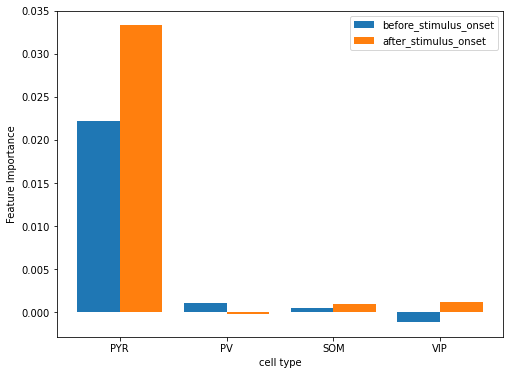

3
(51,) [2 0 1 2 1 2 0 0 2 2 0 2 2 0 2 2 2 2 0 2 0 0 0 1 2 2 2 0 1 1 2 1 0 1 1 1 1
 2 1 1 2 0 2 0 0 2 0 2 0 1 1]
class = 2


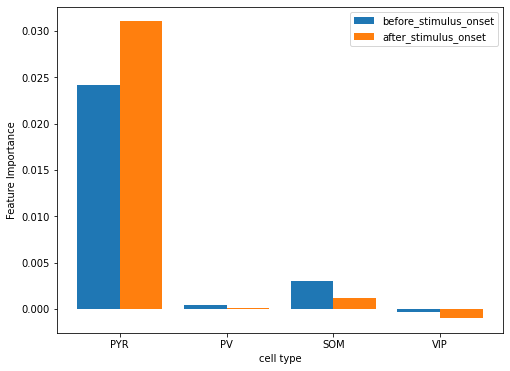

5
(51,) [2 0 1 2 1 2 0 0 2 2 0 2 2 0 2 2 2 2 0 2 0 0 0 1 2 2 2 0 1 1 2 1 0 1 1 1 1
 2 1 1 2 0 2 0 0 2 0 2 0 1 1]
class = 2


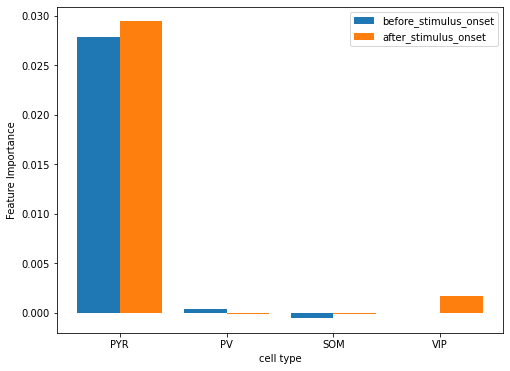

8
(51,) [2 0 1 2 1 2 0 0 2 2 0 2 2 0 2 2 2 2 0 2 0 0 0 1 2 2 2 0 1 1 2 1 0 1 1 1 1
 2 1 1 2 0 2 0 0 2 0 2 0 1 1]
class = 2


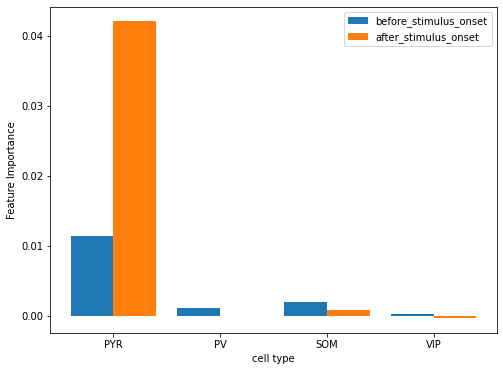

9
(51,) [2 0 1 2 1 2 0 0 2 2 0 2 2 0 2 2 2 2 0 2 0 0 0 1 2 2 2 0 1 1 2 1 0 1 1 1 1
 2 1 1 2 0 2 0 0 2 0 2 0 1 1]
class = 2


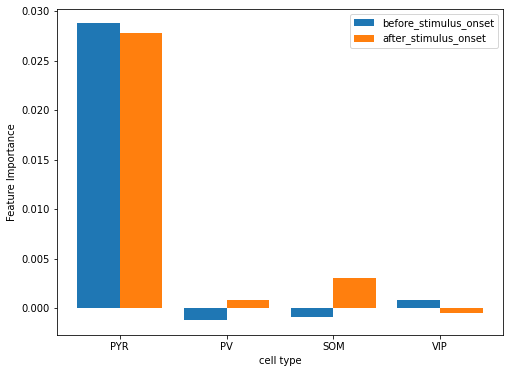

11
(51,) [2 0 1 2 1 2 0 0 2 2 0 2 2 0 2 2 2 2 0 2 0 0 0 1 2 2 2 0 1 1 2 1 0 1 1 1 1
 2 1 1 2 0 2 0 0 2 0 2 0 1 1]
class = 2


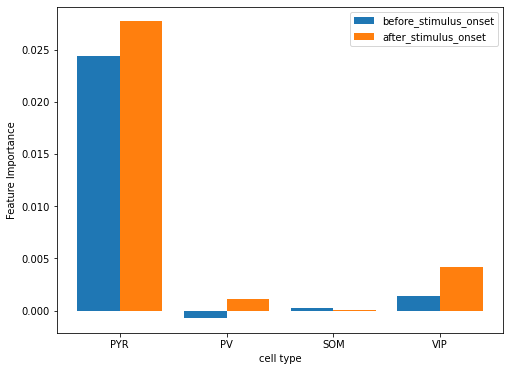

12
(51,) [2 0 1 2 1 2 0 0 2 2 0 2 2 0 2 2 2 2 0 2 0 0 0 1 2 2 2 0 1 1 2 1 0 1 1 1 1
 2 1 1 2 0 2 0 0 2 0 2 0 1 1]
class = 2


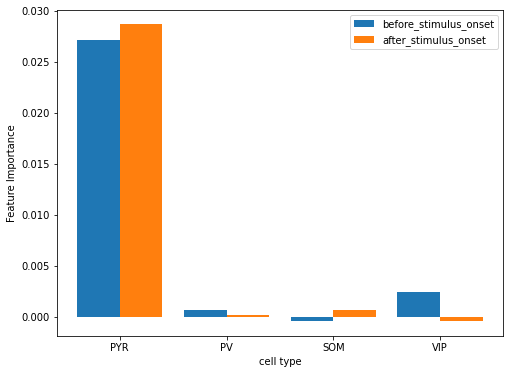

14
(51,) [2 0 1 2 1 2 0 0 2 2 0 2 2 0 2 2 2 2 0 2 0 0 0 1 2 2 2 0 1 1 2 1 0 1 1 1 1
 2 1 1 2 0 2 0 0 2 0 2 0 1 1]
class = 2


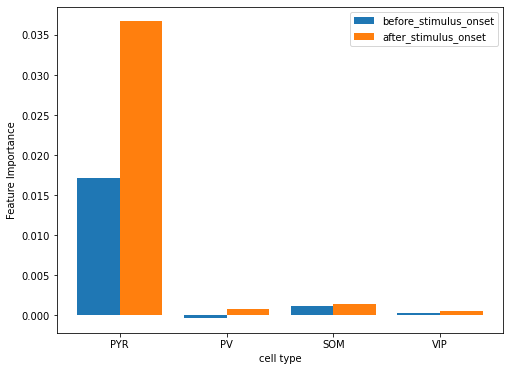

15
(51,) [2 0 1 2 1 2 0 0 2 2 0 2 2 0 2 2 2 2 0 2 0 0 0 1 2 2 2 0 1 1 2 1 0 1 1 1 1
 2 1 1 2 0 2 0 0 2 0 2 0 1 1]
class = 2


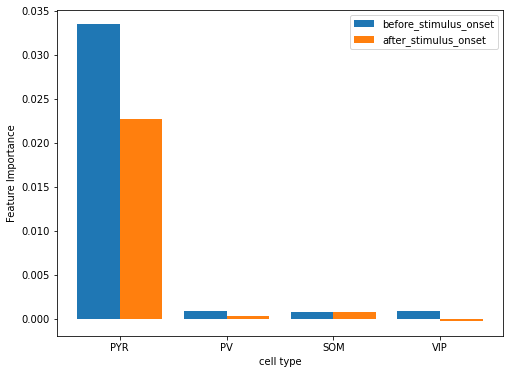

16
(51,) [2 0 1 2 1 2 0 0 2 2 0 2 2 0 2 2 2 2 0 2 0 0 0 1 2 2 2 0 1 1 2 1 0 1 1 1 1
 2 1 1 2 0 2 0 0 2 0 2 0 1 1]
class = 2


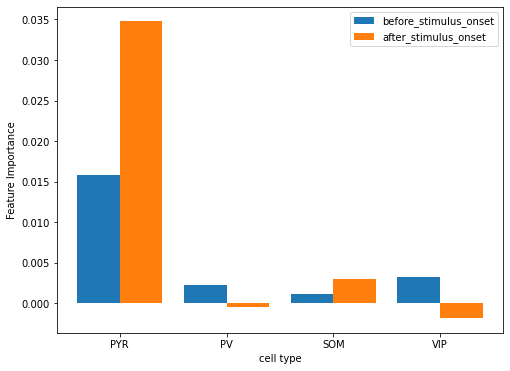

17
(51,) [2 0 1 2 1 2 0 0 2 2 0 2 2 0 2 2 2 2 0 2 0 0 0 1 2 2 2 0 1 1 2 1 0 1 1 1 1
 2 1 1 2 0 2 0 0 2 0 2 0 1 1]
class = 2


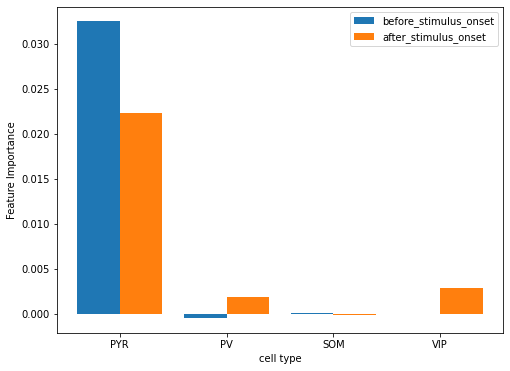

19
(51,) [2 0 1 2 1 2 0 0 2 2 0 2 2 0 2 2 2 2 0 2 0 0 0 1 2 2 2 0 1 1 2 1 0 1 1 1 1
 2 1 1 2 0 2 0 0 2 0 2 0 1 1]
class = 2


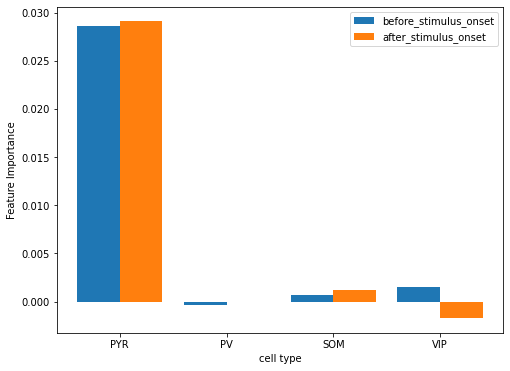

24
(51,) [2 0 1 2 1 2 0 0 2 2 0 2 2 0 2 2 2 2 0 2 0 0 0 1 2 2 2 0 1 1 2 1 0 1 1 1 1
 2 1 1 2 0 2 0 0 2 0 2 0 1 1]
class = 2


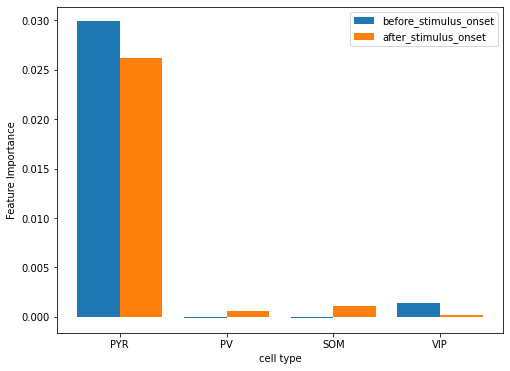

25
(51,) [2 0 1 2 1 2 0 0 2 2 0 2 2 0 2 2 2 2 0 2 0 0 0 1 2 2 2 0 1 1 2 1 0 1 1 1 1
 2 1 1 2 0 2 0 0 2 0 2 0 1 1]
class = 2


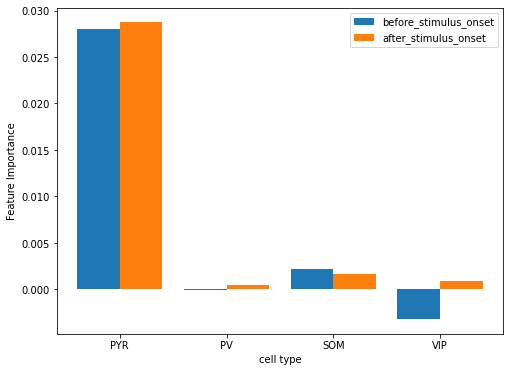

26
(51,) [2 0 1 2 1 2 0 0 2 2 0 2 2 0 2 2 2 2 0 2 0 0 0 1 2 2 2 0 1 1 2 1 0 1 1 1 1
 2 1 1 2 0 2 0 0 2 0 2 0 1 1]
class = 2


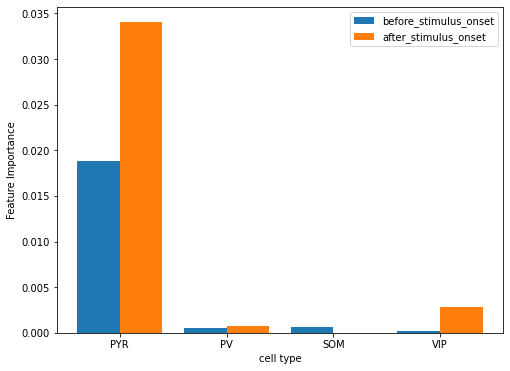

30
(51,) [2 0 1 2 1 2 0 0 2 2 0 2 2 0 2 2 2 2 0 2 0 0 0 1 2 2 2 0 1 1 2 1 0 1 1 1 1
 2 1 1 2 0 2 0 0 2 0 2 0 1 1]
class = 2


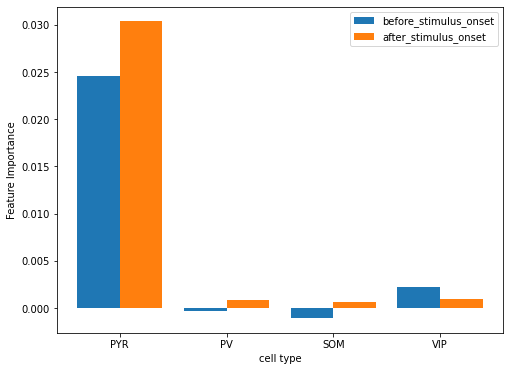

37
(51,) [2 0 1 2 1 2 0 0 2 2 0 2 2 0 2 2 2 2 0 2 0 0 0 1 2 2 2 0 1 1 2 1 0 1 1 1 1
 2 1 1 2 0 2 0 0 2 0 2 0 1 1]
class = 2


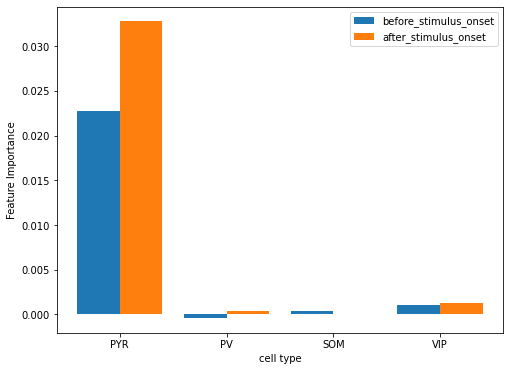

40
(51,) [2 0 1 2 1 2 0 0 2 2 0 2 2 0 2 2 2 2 0 2 0 0 0 1 2 2 2 0 1 1 2 1 0 1 1 1 1
 2 1 1 2 0 2 0 0 2 0 2 0 1 1]
class = 2


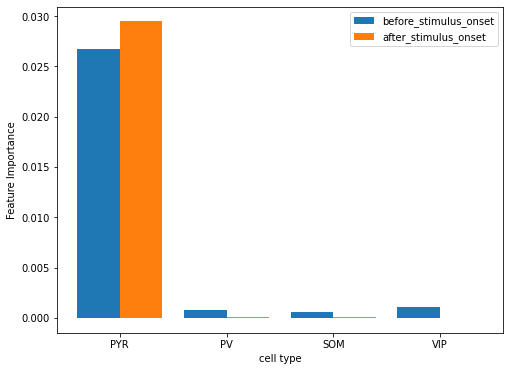

42
(51,) [2 0 1 2 1 2 0 0 2 2 0 2 2 0 2 2 2 2 0 2 0 0 0 1 2 2 2 0 1 1 2 1 0 1 1 1 1
 2 1 1 2 0 2 0 0 2 0 2 0 1 1]
class = 2


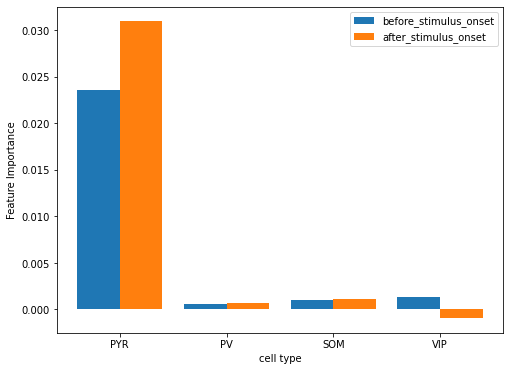

45
(51,) [2 0 1 2 1 2 0 0 2 2 0 2 2 0 2 2 2 2 0 2 0 0 0 1 2 2 2 0 1 1 2 1 0 1 1 1 1
 2 1 1 2 0 2 0 0 2 0 2 0 1 1]
class = 2


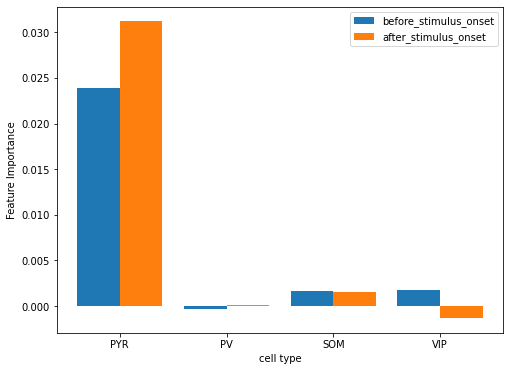

47
(51,) [2 0 1 2 1 2 0 0 2 2 0 2 2 0 2 2 2 2 0 2 0 0 0 1 2 2 2 0 1 1 2 1 0 1 1 1 1
 2 1 1 2 0 2 0 0 2 0 2 0 1 1]
class = 2


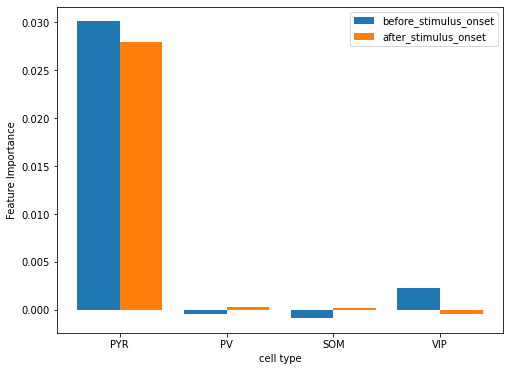

In [ ]:
for i,val in enumerate(y_test):
  d = {}
  if(val == 2):
    print(i)
    d = analysis_shap(model,i)
    plot_importance(d)

In [ ]:
def analysis_shap(i,model):
  plt.rcParams["figure.figsize"] = (30,10)
  b = X_test[i].reshape(1,17,138)
  print("model output",model.predict(b),y_test[i])
  ypred = np.argmax(model.predict(b)) #index of label with max prob
  features = list(range(0,138))
  if(ypred == y_test[i]):
    explainer = shap.DeepExplainer(model,X_trn)
    print("shap output",explainer.expected_value)
    print("predicted class = {}".format(ypred))
    shap_values = explainer.shap_values(b)
    mean = np.mean(shap_values[ypred][0],axis = 0)
    m1 = np.mean(shap_values[0][0],axis = 0) #class label = 0
    m2 = np.mean(shap_values[1][0],axis = 0) #class label = 1
    m3 = np.mean(shap_values[2][0],axis = 0) #class label = 2
    #print(mean.shape)
    #shap.initjs()
    #shap.force_plot(explainer.expected_value[ypred],mean,features)
    #plt.bar(features,mean,1)
    fig,ax = plt.subplots(3,1)
    ax[0].bar(features,m1,1)
    ax[1].bar(features,m2,1)
    ax[2].bar(features,m3,1)
    for ind in [0,1,2]:
      ax[ind].title.set_text("class label = {}".format(ind))
    plt.savefig("/content/drive/MyDrive/dissertation/rat1_post_results/bar_charts/label{}/test{}.jpg".format(ypred,i))
    plt.show()
    visualize(mean,i,ypred)
  else:
    print("ypred not equal to ylabel for test sample {}".format(i))

In [ ]:
def visualize(m,ii,ypred):
  plt.rcParams["figure.figsize"] = (8,6)
  ind = np.flip(np.argsort(m))
  a = data['CELLLAB_ALL'][0][0].reshape(138)
  #a = np.array([1]*111 + [3]*12 + [4]*7 + [5]*8)
  unique, counts = np.unique(a, return_counts=True)
  print(unique,counts)
  colors = []
  for i in a[ind]:
    if(i == 1):
      colors.append('r') #PYR
    elif(i == 3):
      colors.append('b') #PV
    elif(i == 4):
      colors.append('g') #SOM
    elif(i == 5):
      colors.append('y') #VIP
    else:
      colors.append('m') #others
  print("maximum contribution",ind[0:10])
  print("minimum contribution",ind[-10:])
  fig,ax = plt.subplots(1,2)
  ax[0].barh(list(map(str,ind))[-10:],m[ind][-10:],0.5,color = colors)
  ax[0].title.set_text("neurons which contribute minimum")
  ax[1].barh(list(map(str,ind))[0:10],m[ind][0:10],0.5,color = colors)
  ax[1].title.set_text("neurons that contribute maximum")
  c = {'PYR':'red', 'PV':'blue', 'SOM': 'green', 'VIP': 'yellow'}         
  labels = list(c.keys())
  handles = [plt.Rectangle((0,0),1,1, color=c[label]) for label in labels]
  ax[0].legend(handles, labels)
  ax[1].legend(handles,labels)
  plt.savefig("/content/drive/MyDrive/dissertation/rat1_post_results/color_chart/label{}/test{}.jpg".format(ypred,ii))
  plt.show()

model output [[6.2666422e-06 1.8392612e-04 9.9980980e-01]] 2
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 2


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


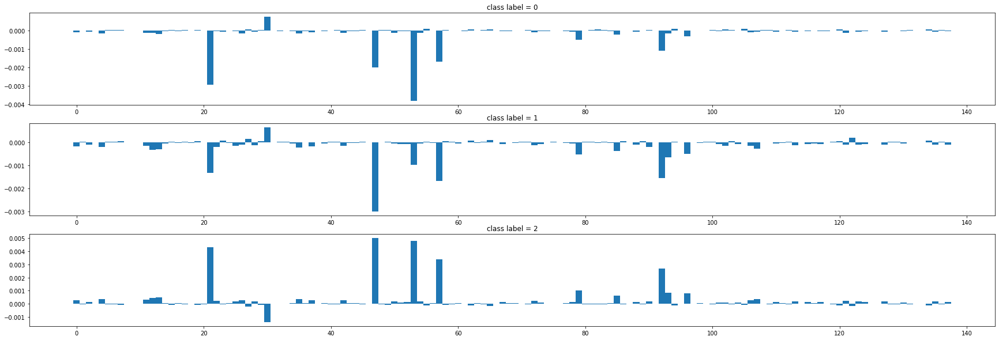

[1 3 4 5] [111  12   7   8]
maximum contribution [47 53 21 57 92 79 93 96 85 13]
minimum contribution [ 58  94  55  62 120 134  65 122  27  30]


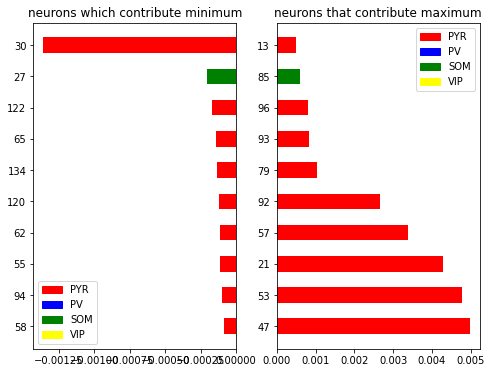

model output [[9.9372709e-01 6.2474473e-03 2.5513280e-05]] 0
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 0


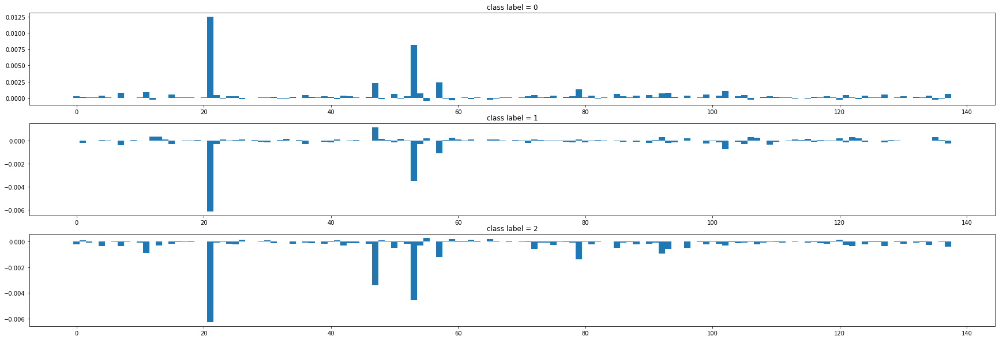

[1 3 4 5] [111  12   7   8]
maximum contribution [ 21  53  57  47  79 102  11  93   7  92]
minimum contribution [ 48  62  26  65 135 120 106  12  59  55]


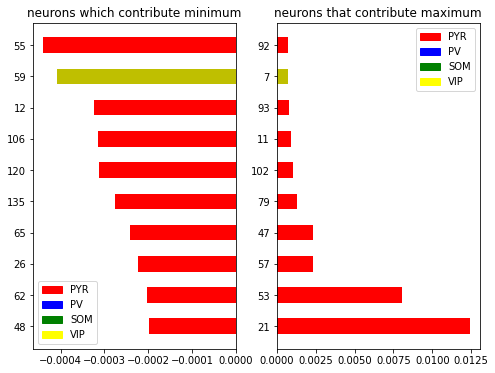

model output [[2.607840e-04 9.992180e-01 5.213057e-04]] 1
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 1


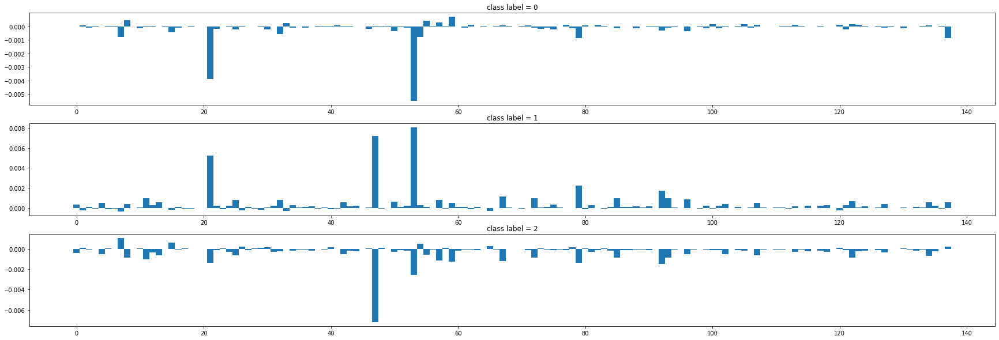

[1 3 4 5] [111  12   7   8]
maximum contribution [53 47 21 79 92 67 85 11 72 93]
minimum contribution [ 80   5  29  15   1 120  26  33  65   7]


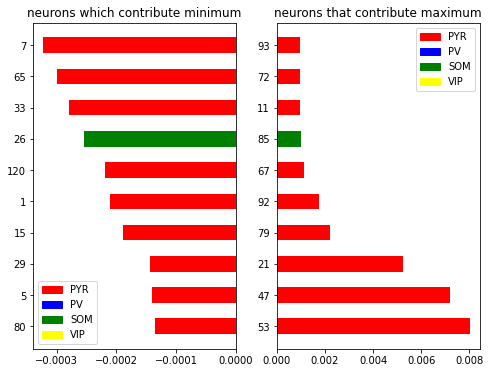

model output [[6.9838097e-06 2.3927283e-04 9.9975377e-01]] 2
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 2


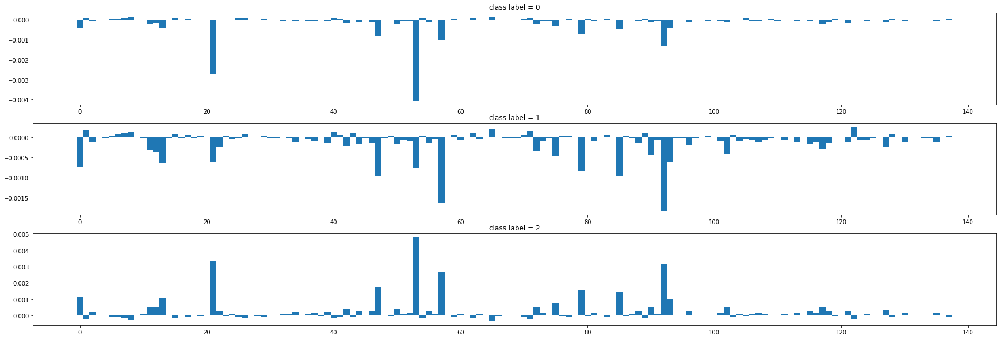

[1 3 4 5] [111  12   7   8]
maximum contribution [53 21 92 57 47 79 85  0 13 93]
minimum contribution [ 15  26  62   7  40  71   1 122   8  65]


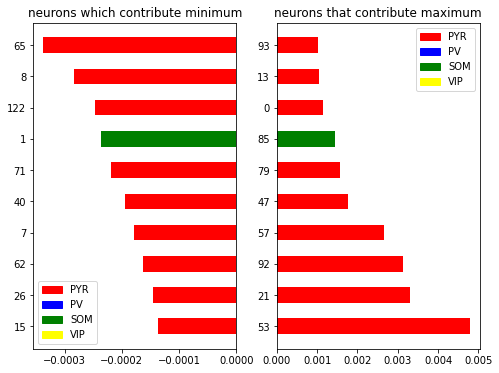

model output [[7.1184192e-04 9.9879646e-01 4.9168058e-04]] 1
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 1


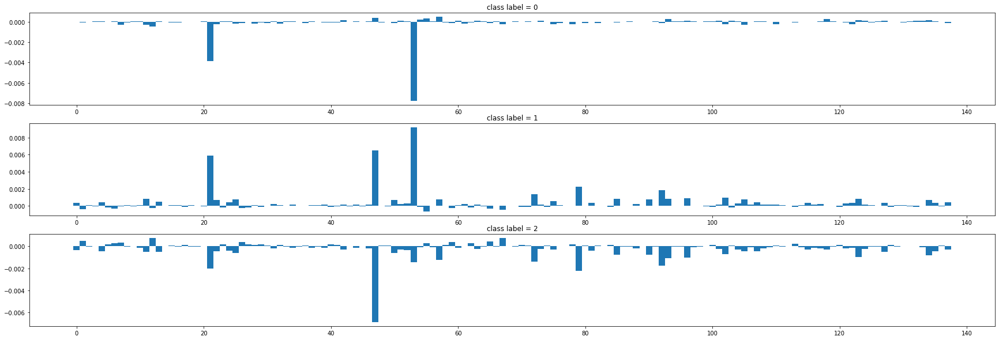

[1 3 4 5] [111  12   7   8]
maximum contribution [ 53  47  21  79  92  72 102  96 123  85]
minimum contribution [ 5 62 59 26 12 65  6  1 67 55]


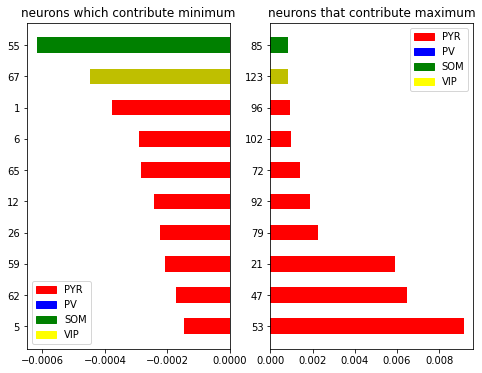

model output [[6.4607630e-06 1.7364962e-04 9.9981993e-01]] 2
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 2


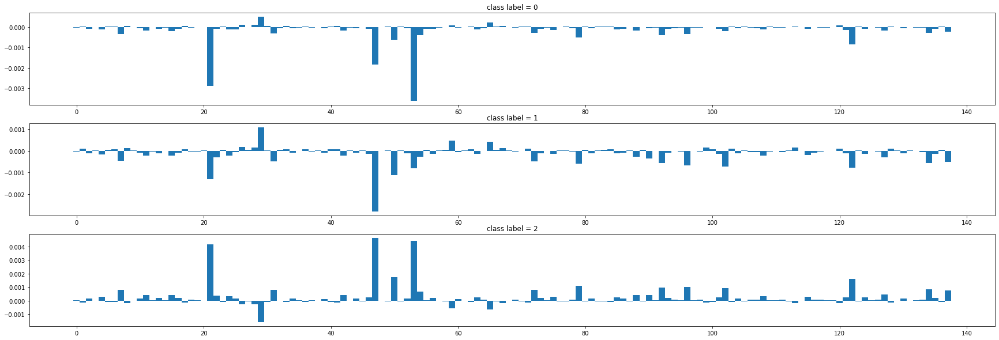

[1 3 4 5] [111  12   7   8]
maximum contribution [ 47  53  21  50 122  79  96  92 102 134]
minimum contribution [ 99   8 120  67 113  28  26  59  65  29]


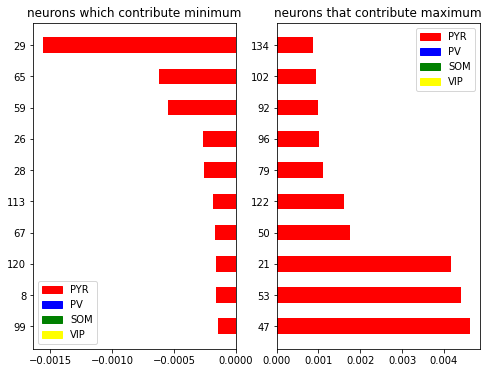

model output [[9.1307199e-01 8.6761914e-02 1.6613241e-04]] 0
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 0


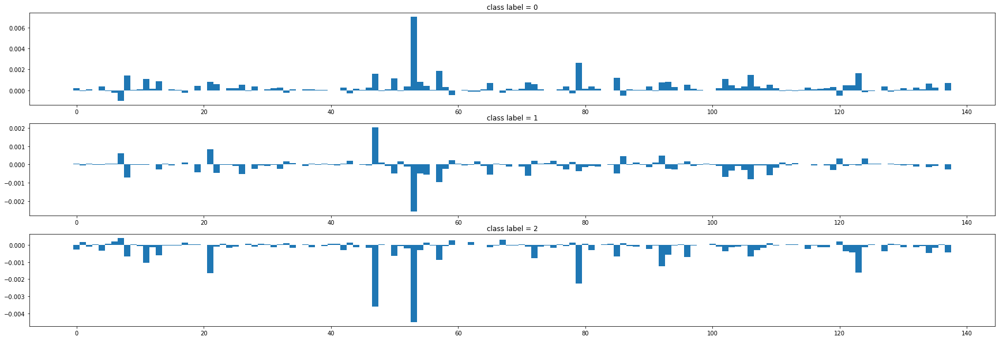

[1 3 4 5] [111  12   7   8]
maximum contribution [ 53  79  57 123  47 106   8  85  50 102]
minimum contribution [  6  17  67  33  78  43  59 120  86   7]


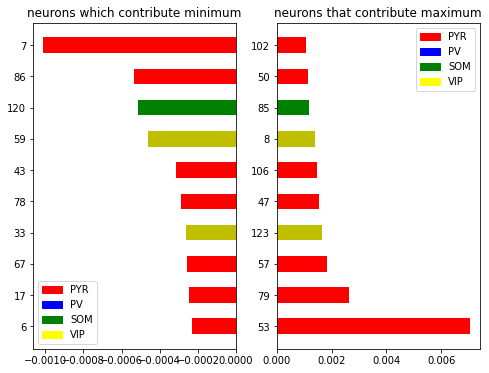

model output [[9.9971730e-01 2.7778160e-04 4.8790744e-06]] 0
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 0


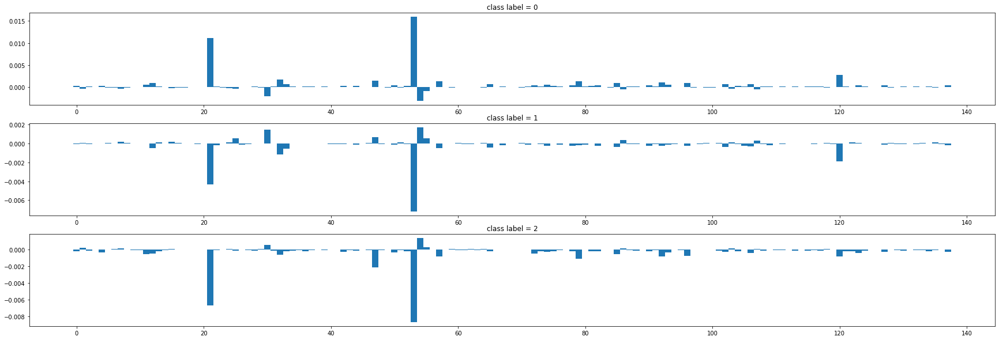

[1 3 4 5] [111  12   7   8]
maximum contribution [ 53  21 120  32  47  79  57  92  96  12]
minimum contribution [ 15   1 103   7  25 107  86  55  30  54]


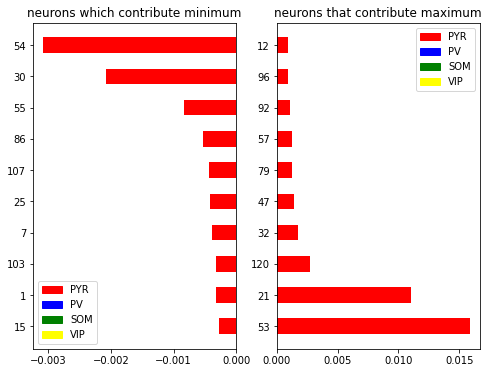

model output [[6.6128537e-06 1.8863985e-04 9.9980479e-01]] 2
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 2


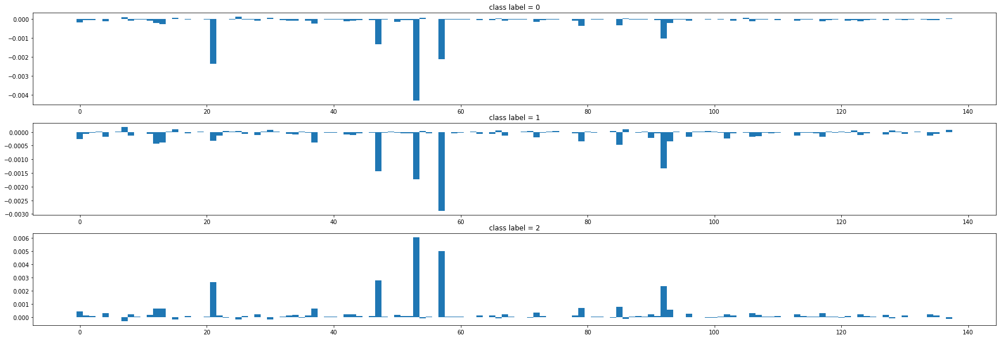

[1 3 4 5] [111  12   7   8]
maximum contribution [53 57 47 21 92 85 79 13 12 37]
minimum contribution [ 71  66 128  54 137  86  25  30  15   7]


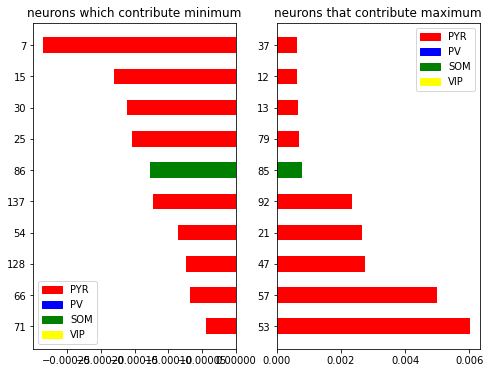

model output [[9.858961e-06 4.055818e-04 9.995846e-01]] 2
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 2


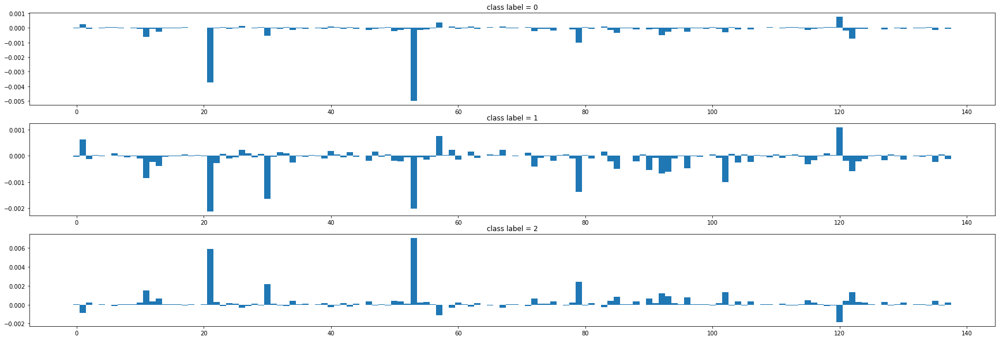

[1 3 4 5] [111  12   7   8]
maximum contribution [ 53  21  79  30  11 122 102  92  93  85]
minimum contribution [ 43  62  83  40  67  26  59   1  57 120]


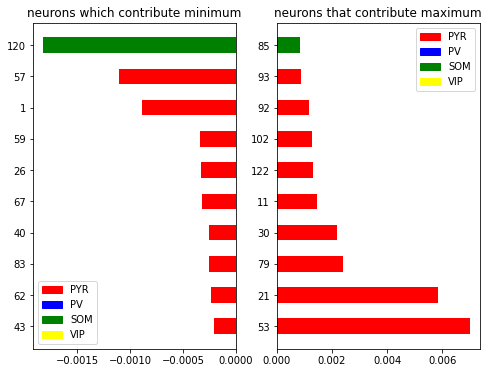

model output [[9.9903667e-01 9.5500983e-04 8.3917812e-06]] 0
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 0


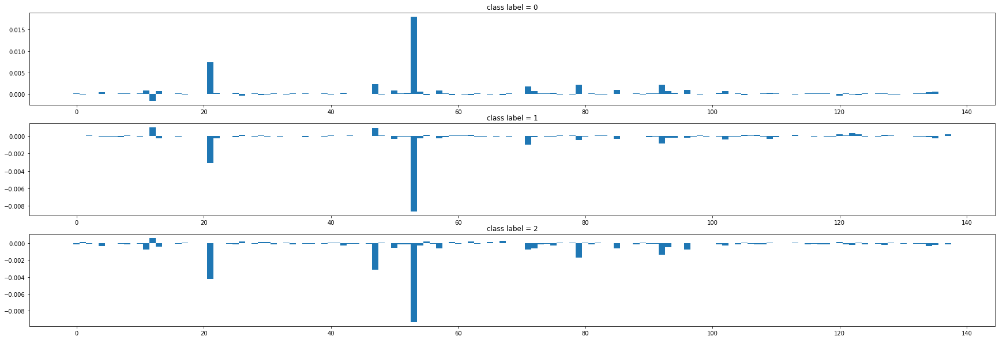

[1 3 4 5] [111  12   7   8]
maximum contribution [53 21 47 92 79 71 96 85 50 57]
minimum contribution [ 59 105  29  67 123  62  55  26 120  12]


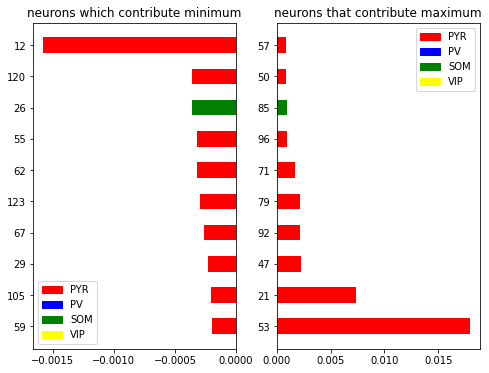

model output [[6.1256587e-06 1.6090392e-04 9.9983299e-01]] 2
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 2


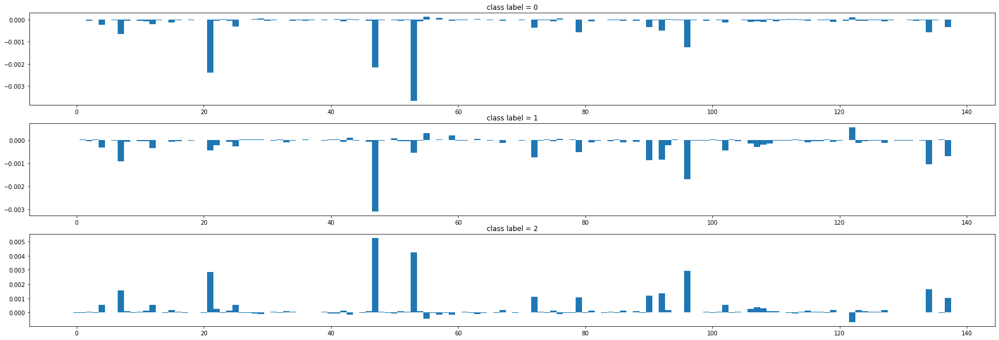

[1 3 4 5] [111  12   7   8]
maximum contribution [ 47  53  96  21 134   7  92  90  72  79]
minimum contribution [113  28  29  63  76  57  43  59  55 122]


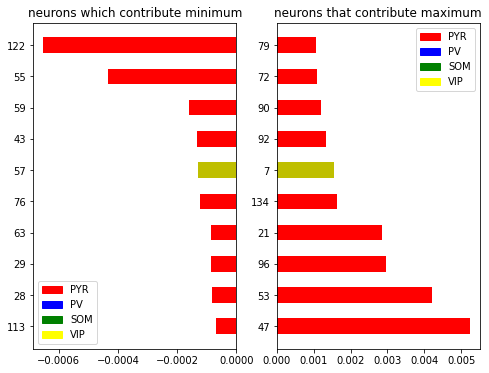

model output [[1.3713996e-05 4.3024038e-04 9.9955601e-01]] 2
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 2


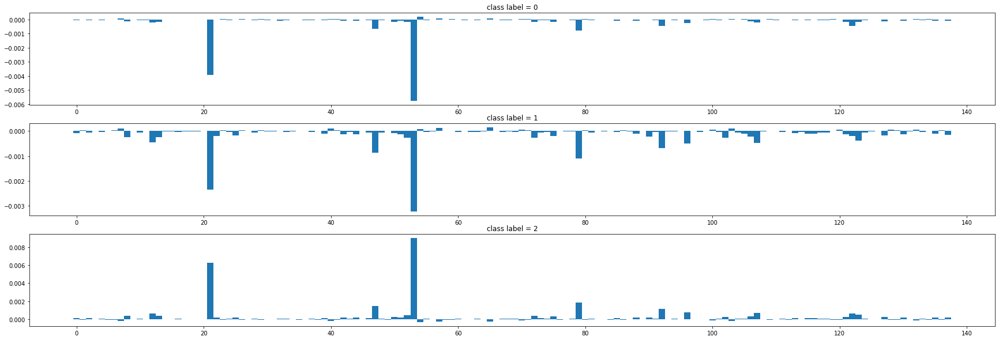

[1 3 4 5] [111  12   7   8]
maximum contribution [ 53  21  79  47  92  96 107  12 122 123]
minimum contribution [ 71  70 132 100 103  40   7  65  57  54]


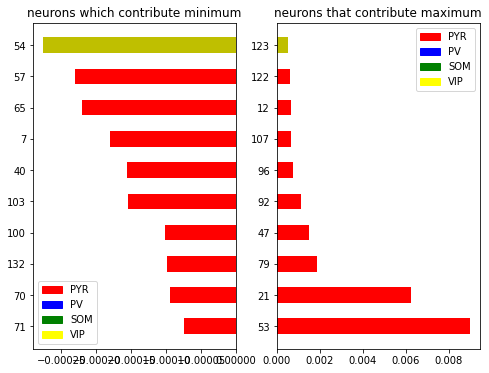

model output [[9.9896872e-01 1.0232648e-03 7.9727051e-06]] 0
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 0


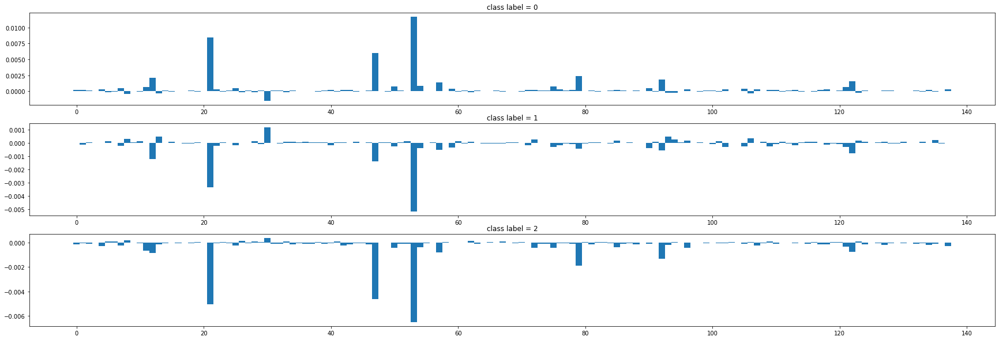

[1 3 4 5] [111  12   7   8]
maximum contribution [ 53  21  47  79  12  92 122  57  54  75]
minimum contribution [  5  62  28 123  93  94  13 106   8  30]


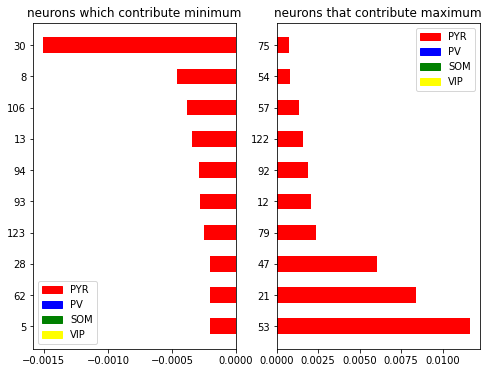

model output [[5.3151011e-06 1.5107455e-04 9.9984360e-01]] 2
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 2


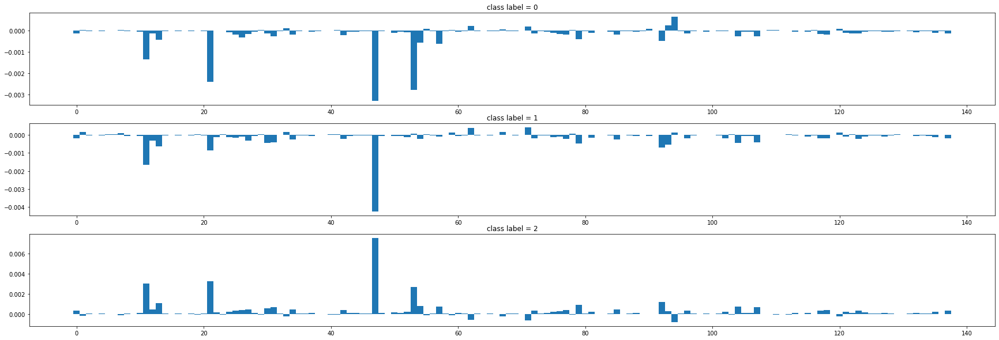

[1 3 4 5] [111  12   7   8]
maximum contribution [ 47  21  11  53  92  13  79  54  57 104]
minimum contribution [ 55   7  59   1  67 120  33  62  71  94]


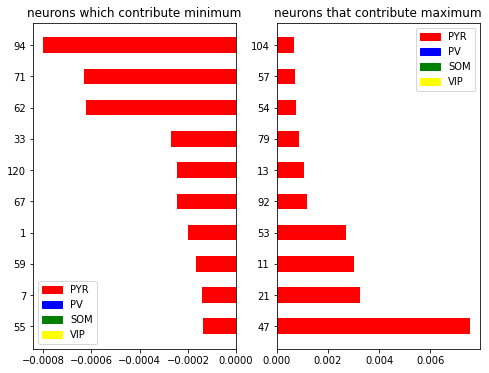

model output [[1.4663765e-05 5.0433911e-04 9.9948102e-01]] 2
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 2


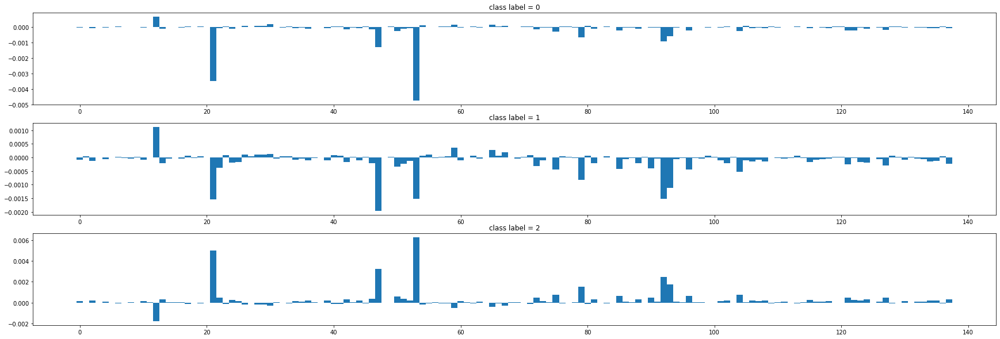

[1 3 4 5] [111  12   7   8]
maximum contribution [ 53  21  47  92  93  79 104  75  96  85]
minimum contribution [71 54 29 26 28 67 30 65 59 12]


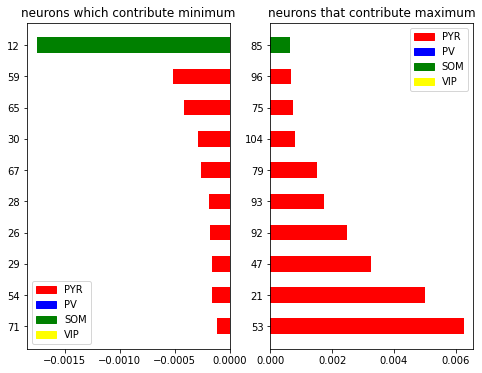

model output [[1.0323907e-05 5.0507952e-04 9.9948454e-01]] 2
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 2


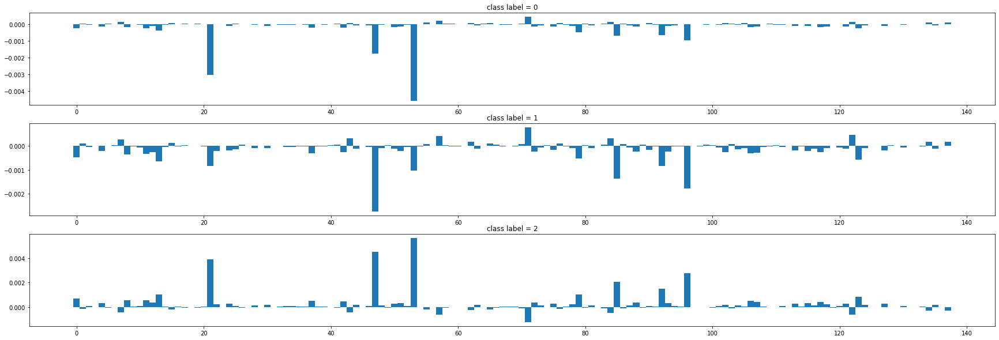

[1 3 4 5] [111  12   7   8]
maximum contribution [ 53  47  21  96  85  92  13  79 123   0]
minimum contribution [ 15  62 137 134  43   7  84 122  57  71]


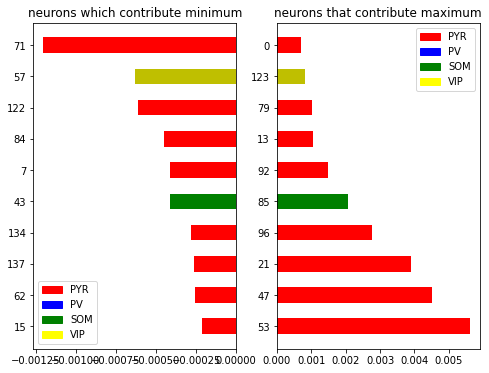

model output [[1.1177377e-05 2.1736202e-04 9.9977142e-01]] 2
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 2


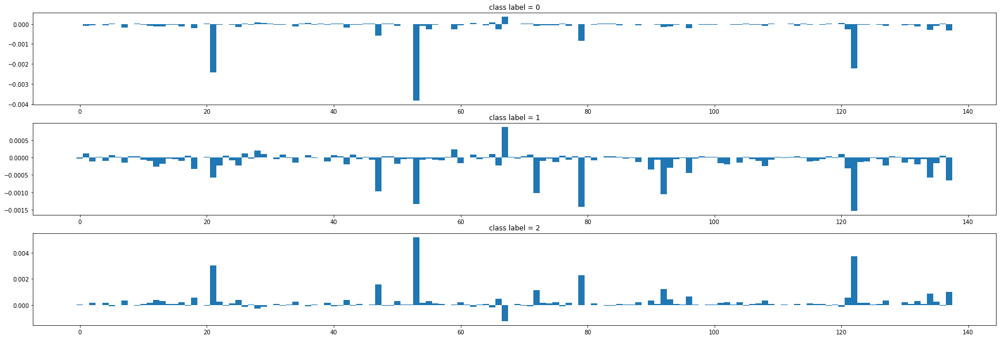

[1 3 4 5] [111  12   7   8]
maximum contribution [ 53 122  21  79  47  92  72 137 134  96]
minimum contribution [ 40  71  36  62  26  29 120  65  28  67]


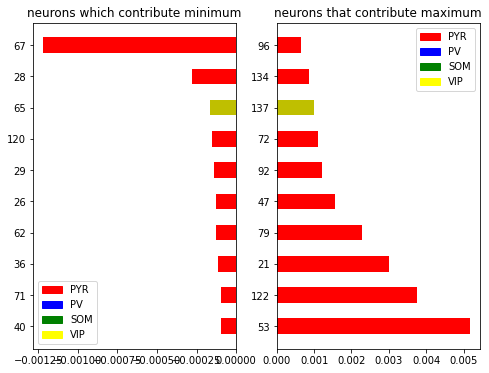

model output [[9.9967098e-01 3.2173836e-04 7.3141068e-06]] 0
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 0


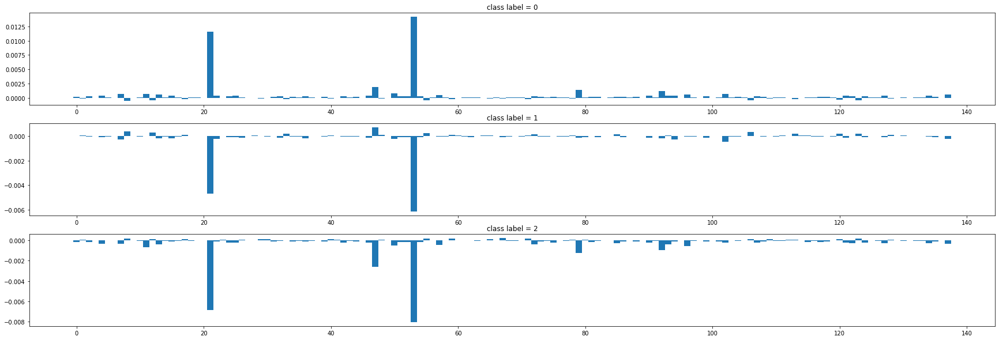

[1 3 4 5] [111  12   7   8]
maximum contribution [ 53  21  47  79  92  50  11 102   7  96]
minimum contribution [ 33  17 113  59 120 123  12  55 106   8]


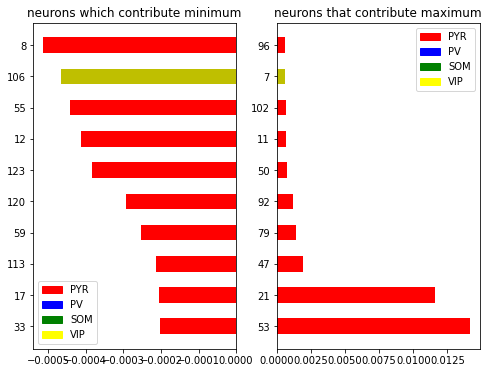

model output [[1.2122311e-05 6.4438366e-04 9.9934345e-01]] 2
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 2


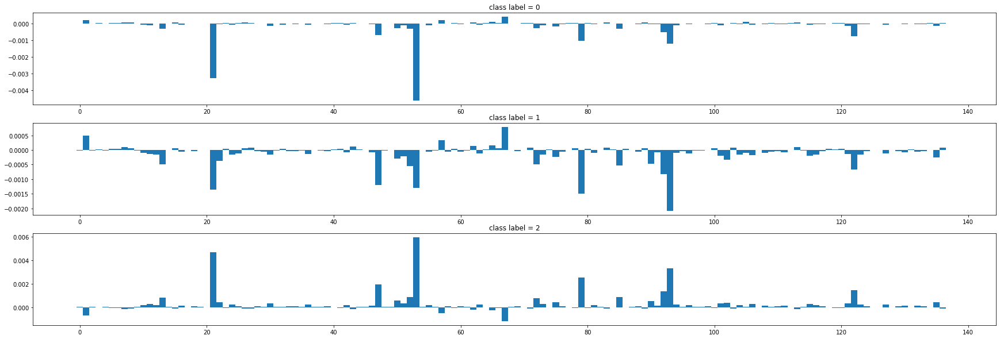

[1 3 4 5] [111  12   7   8]
maximum contribution [ 53  21  93  79  47 122  92  52  85  13]
minimum contribution [ 83   8 113   7  43  62  65  57   1  67]


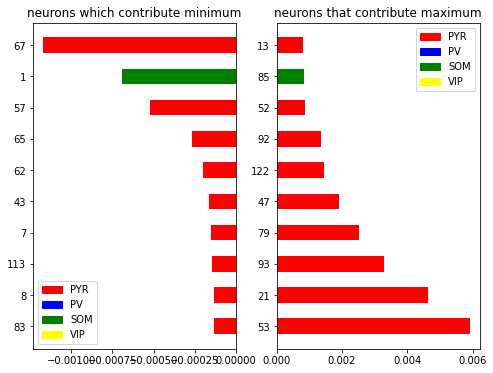

model output [[9.9979919e-01 1.9594391e-04 4.9391488e-06]] 0
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 0


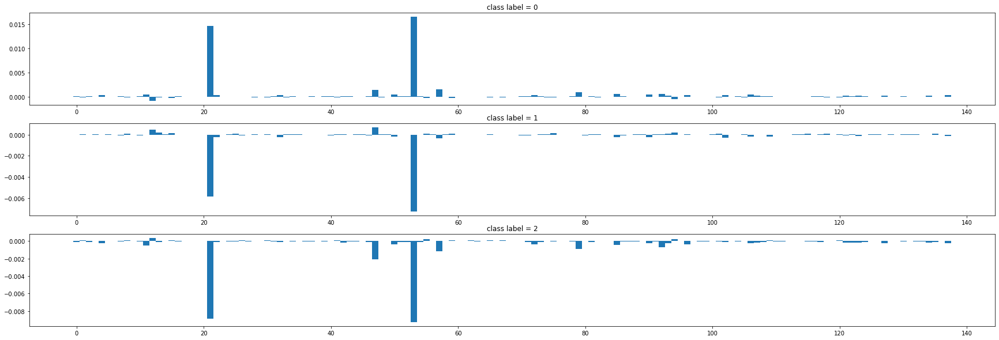

[1 3 4 5] [111  12   7   8]
maximum contribution [53 21 57 47 79 85 92 50 11 90]
minimum contribution [30 75 65  1  8 59 15 55 94 12]


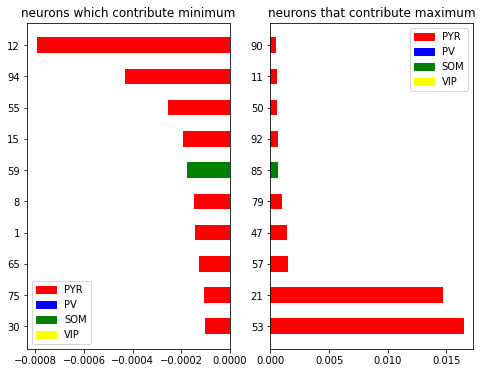

model output [[9.996507e-01 3.433870e-04 5.841226e-06]] 0
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 0


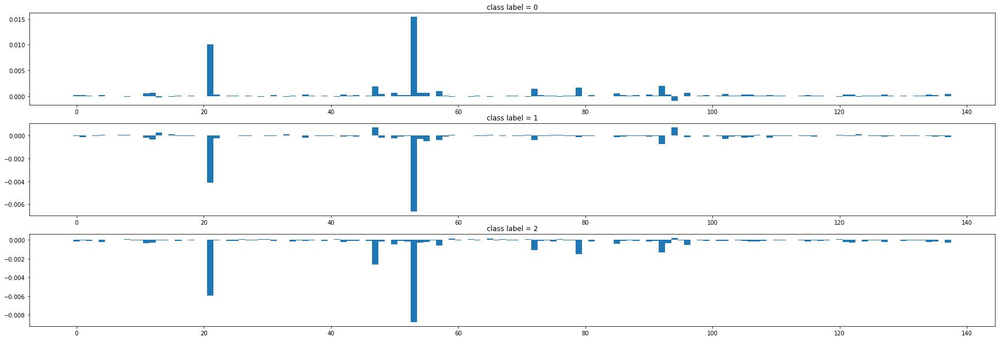

[1 3 4 5] [111  12   7   8]
maximum contribution [53 21 92 47 79 72 57 50 55 96]
minimum contribution [ 41   8 120  71  15  76  59  65  13  94]


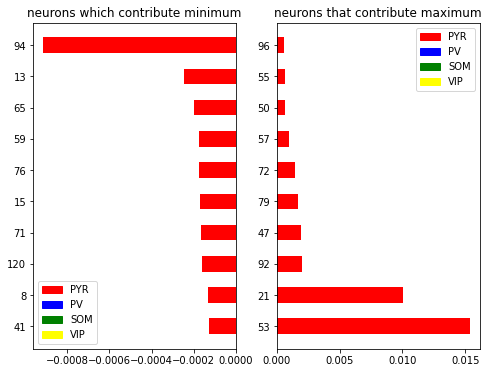

model output [[9.9552202e-01 4.4713062e-03 6.6708785e-06]] 0
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 0


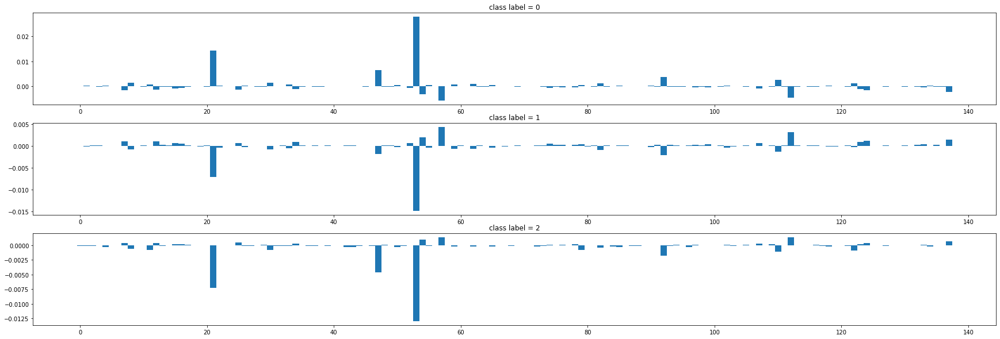

[1 3 4 5] [111  12   7   8]
maximum contribution [ 53  21  47  92 110  30   8  82 122  62]
minimum contribution [123  34  25  12   7 124 137  54 112  57]


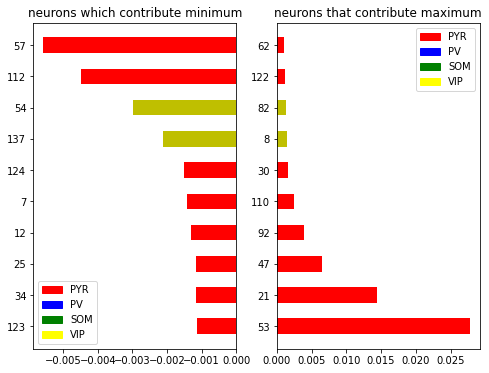

model output [[8.3186716e-04 9.9852008e-01 6.4799219e-04]] 1
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 1


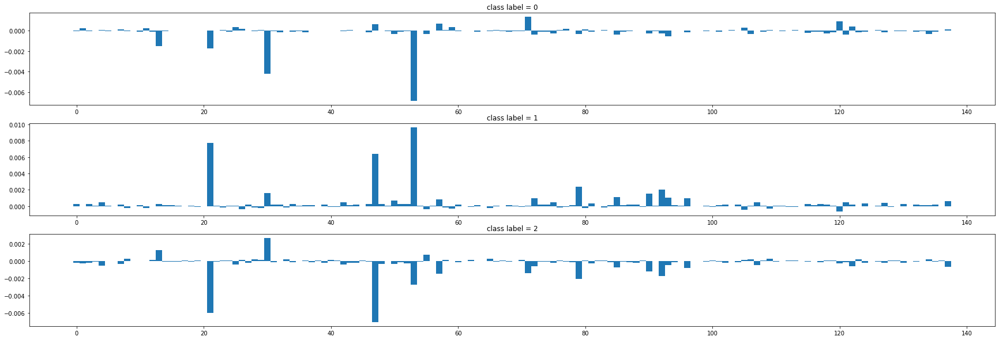

[1 3 4 5] [111  12   7   8]
maximum contribution [53 21 47 79 92 30 90 85 93 96]
minimum contribution [ 29  80  65   8  59 109  26  55 105 120]


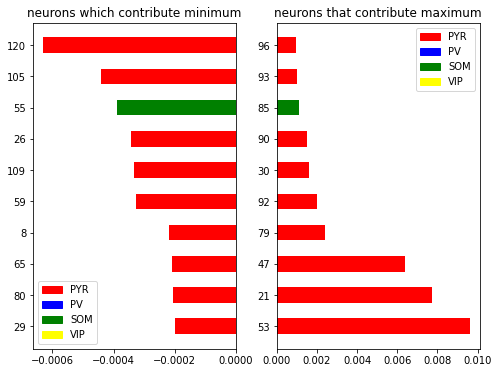

model output [[1.0615372e-05 3.2071135e-04 9.9966872e-01]] 2
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 2


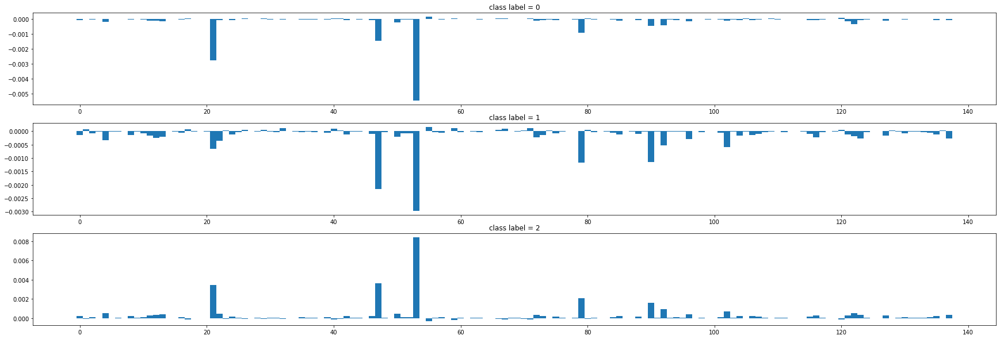

[1 3 4 5] [111  12   7   8]
maximum contribution [ 53  47  21  79  90  92 102 122   4  50]
minimum contribution [ 80  29  32 120  17  67  40  71  59  55]


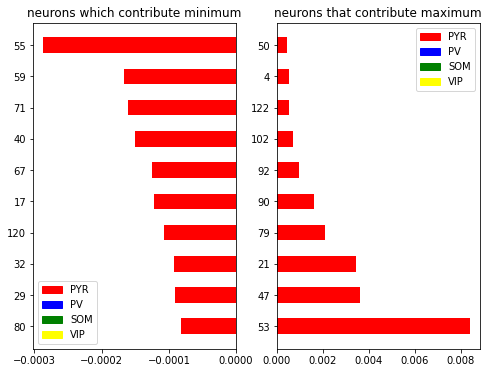

model output [[6.0045022e-06 2.0598141e-04 9.9978799e-01]] 2
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 2


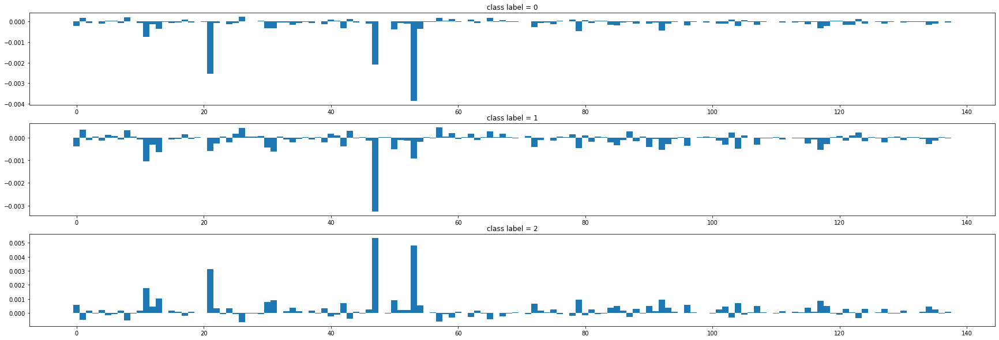

[1 3 4 5] [111  12   7   8]
maximum contribution [ 47  53  21  11  13  92  79  31  50 117]
minimum contribution [ 62 103  59 123  43  65   1   8  57  26]


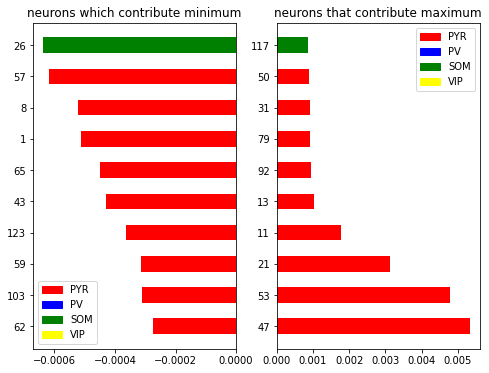

model output [[4.8632419e-06 1.3776215e-04 9.9985731e-01]] 2
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 2


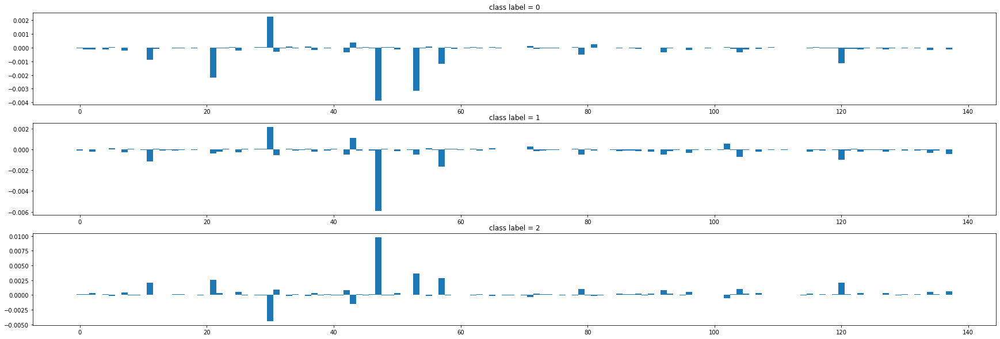

[1 3 4 5] [111  12   7   8]
maximum contribution [ 47  53  57  21 120  11 104  79  31  42]
minimum contribution [ 65  33  81  36   5  55  71 102  43  30]


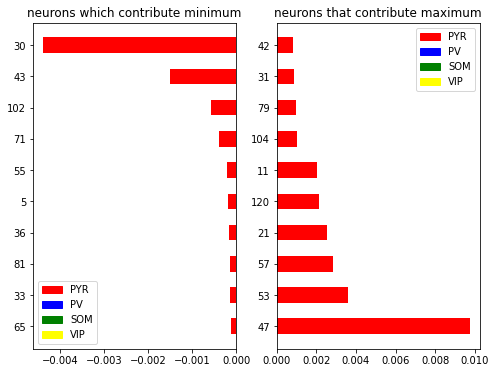

model output [[9.9971467e-01 2.8064358e-04 4.6329205e-06]] 0
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 0


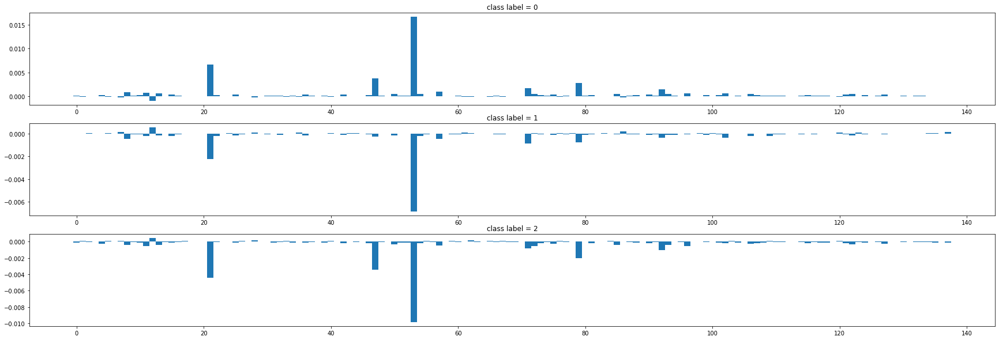

[1 3 4 5] [111  12   7   8]
maximum contribution [ 53  21  47  79  71  92  57   8  11 102]
minimum contribution [ 40  61  35  33 120  62  28   7  86  12]


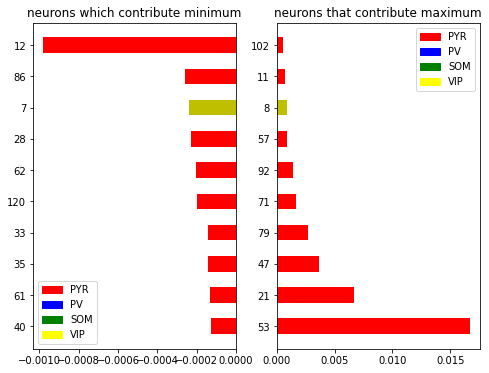

model output [[3.8232870e-04 9.9910057e-01 5.1719573e-04]] 1
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 1


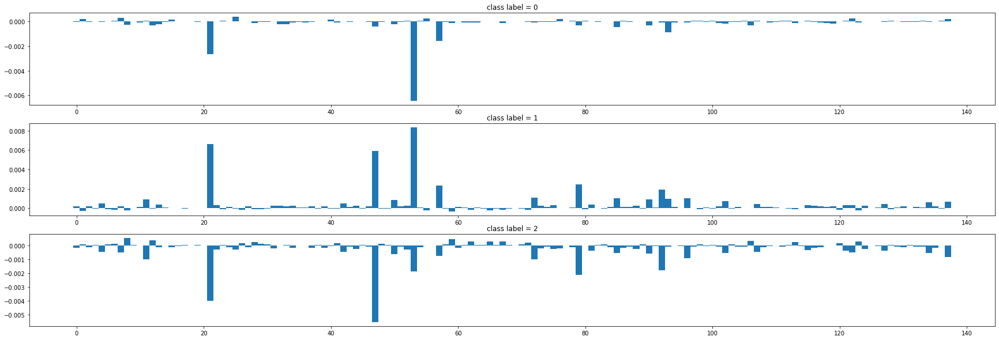

[1 3 4 5] [111  12   7   8]
maximum contribution [53 21 47 79 57 92 72 96 85 93]
minimum contribution [ 71  67  62  26 123   8  55  65   1  59]


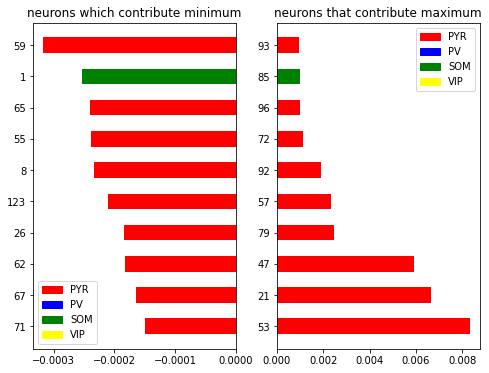

model output [[3.9532880e-04 9.9720758e-01 2.3969687e-03]] 1
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 1


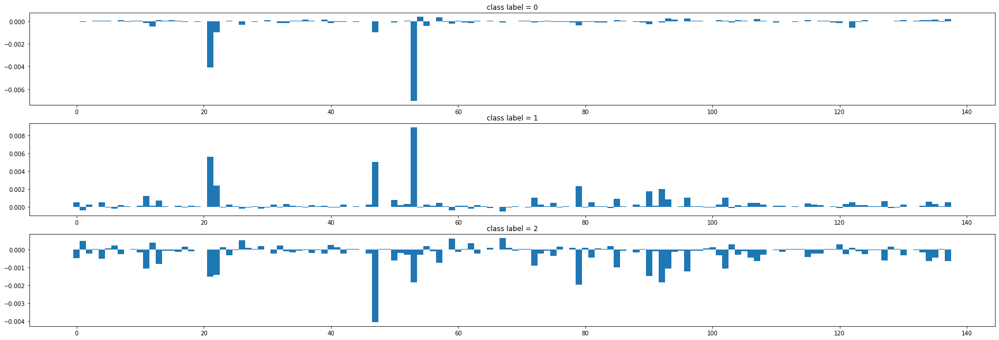

[1 3 4 5] [111  12   7   8]
maximum contribution [53 21 47 22 79 92 90 11 72 96]
minimum contribution [128 103  84   6  29  62  26  59   1  67]


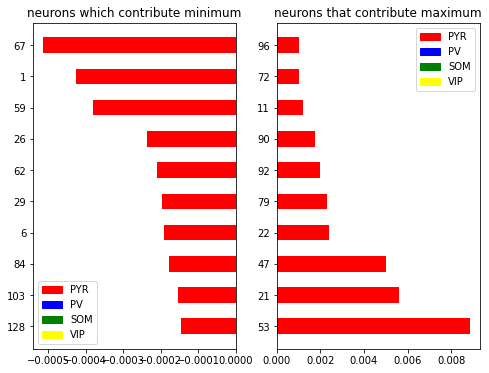

model output [[1.1996059e-05 7.5995829e-04 9.9922800e-01]] 2
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 2


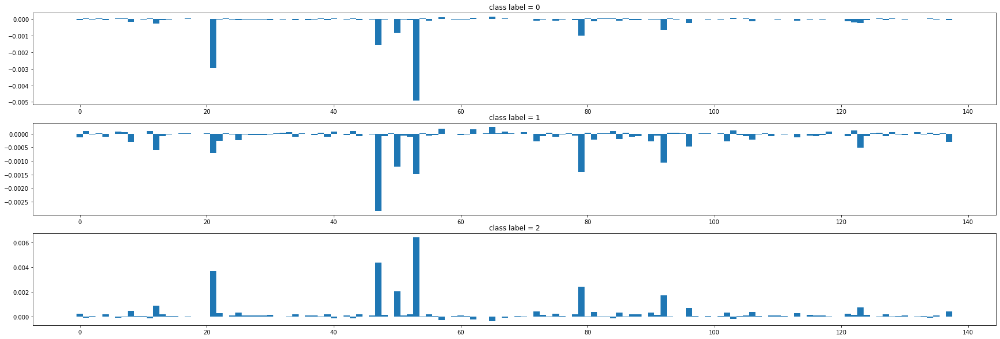

[1 3 4 5] [111  12   7   8]
maximum contribution [ 53  47  21  79  50  92  12 123  96   8]
minimum contribution [ 67   1  40  11  43  84 103  62  57  65]


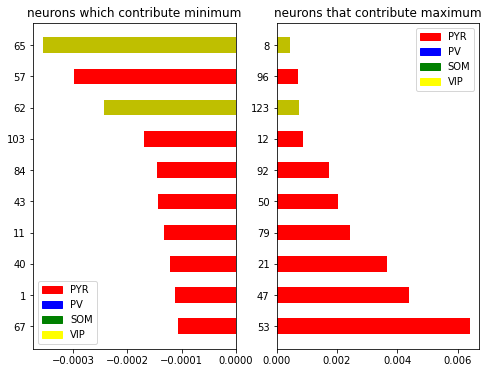

model output [[4.6660128e-04 9.8556072e-01 1.3972718e-02]] 1
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 1


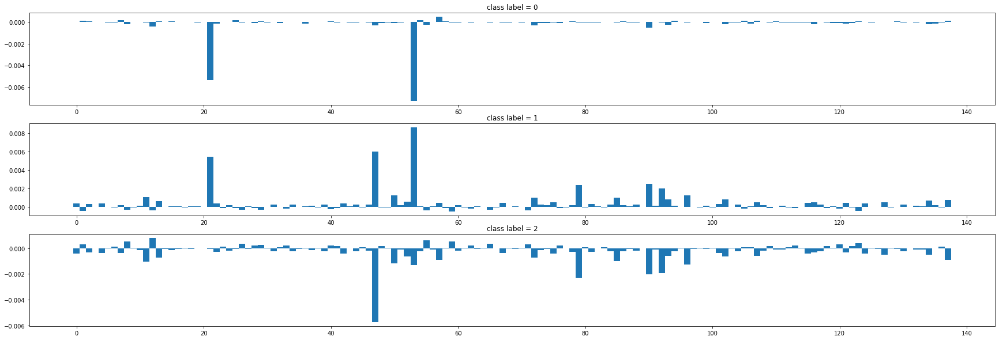

[1 3 4 5] [111  12   7   8]
maximum contribution [53 47 21 90 79 92 96 50 11 72]
minimum contribution [ 29  26   8  65  55  71  12   1 123  59]


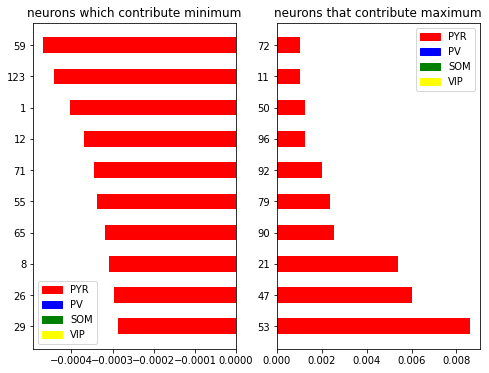

model output [[9.9947041e-01 5.2240776e-04 7.1104555e-06]] 0
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 0


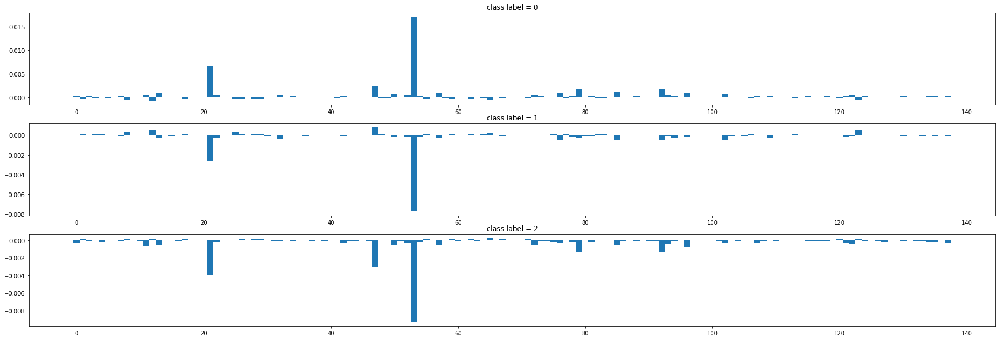

[1 3 4 5] [111  12   7   8]
maximum contribution [53 21 47 92 79 85 96 76 57 13]
minimum contribution [ 62  17  55  26  59  25  65   8 123  12]


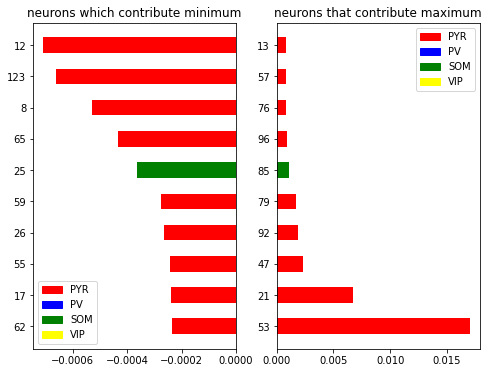

model output [[1.6994630e-03 9.9808002e-01 2.2051972e-04]] 1
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 1


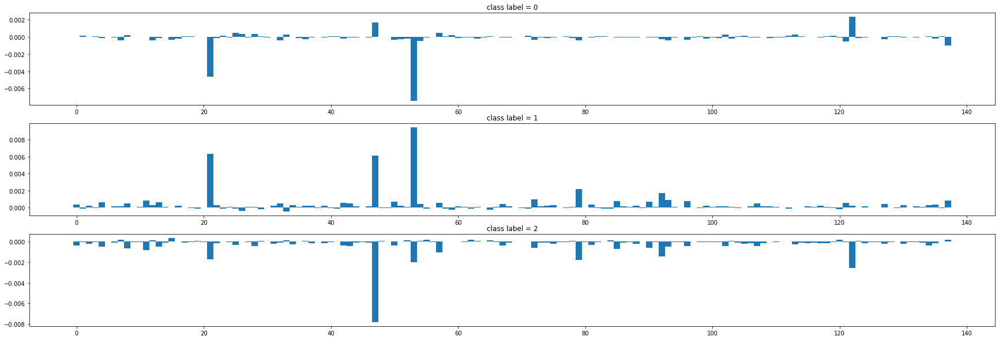

[1 3 4 5] [111  12   7   8]
maximum contribution [ 53  21  47  79  92  72  93  11 137  85]
minimum contribution [ 83  62 112  23 120  29  65  59  26  33]


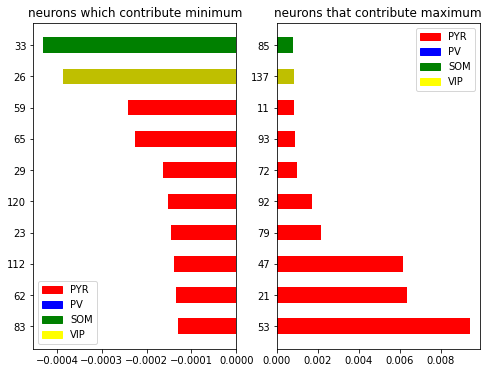

model output [[4.7467672e-03 9.9504918e-01 2.0398007e-04]] 1
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 1


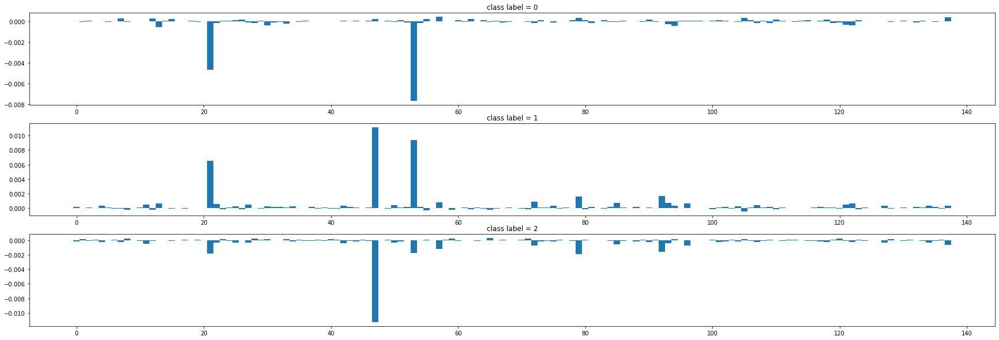

[1 3 4 5] [111  12   7   8]
maximum contribution [47 53 21 92 79 72 57 93 85 96]
minimum contribution [ 26  62 123  80  12   8  65  59  55 105]


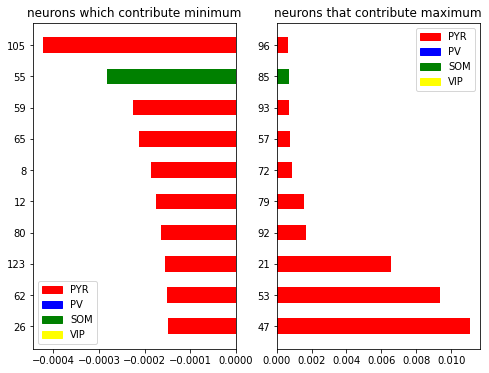

model output [[3.1963622e-04 9.9906152e-01 6.1884674e-04]] 1
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 1


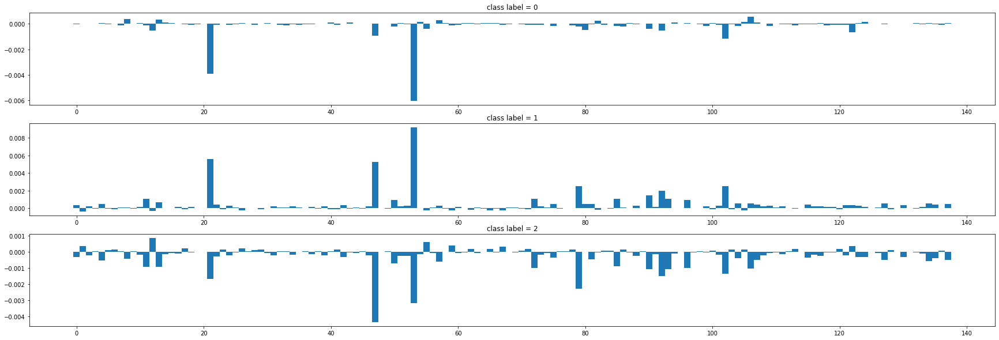

[1 3 4 5] [111  12   7   8]
maximum contribution [ 53  21  47 102  79  92  90  72  93  11]
minimum contribution [ 82  62  55  26  65  67  59 105  12   1]


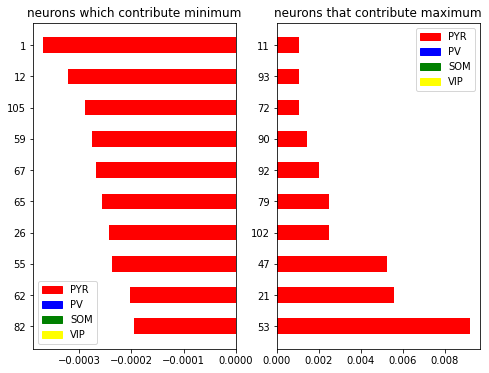

model output [[0.00158513 0.99704295 0.00137198]] 1
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 1


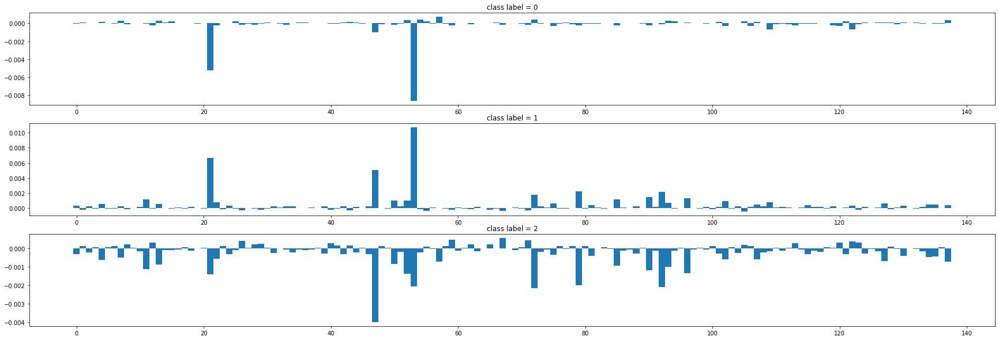

[1 3 4 5] [111  12   7   8]
maximum contribution [53 21 47 79 92 72 90 96 85 11]
minimum contribution [ 65 123  29  59  71  43  26  55  67 105]


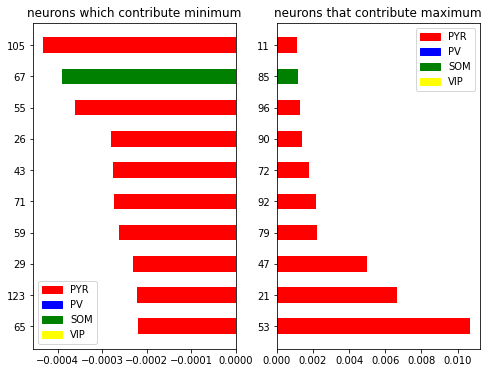

model output [[6.8210998e-06 2.0027316e-04 9.9979287e-01]] 2
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 2


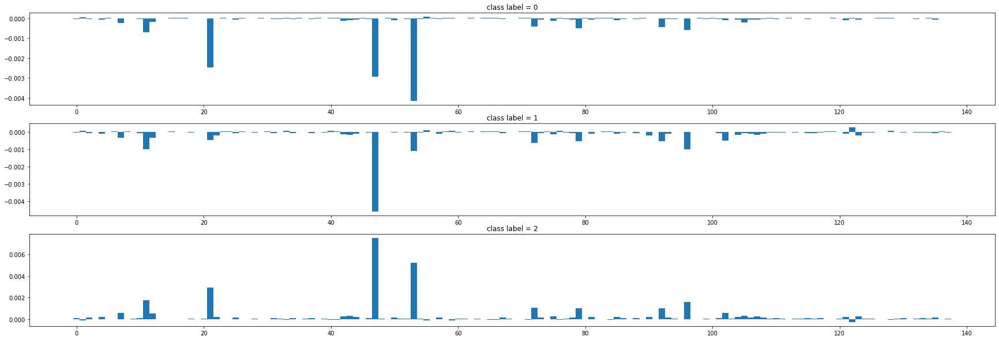

[1 3 4 5] [111  12   7   8]
maximum contribution [ 47  53  21  11  96  72  79  92 102   7]
minimum contribution [ 71  65  76 128  40  33  59   1  55 122]


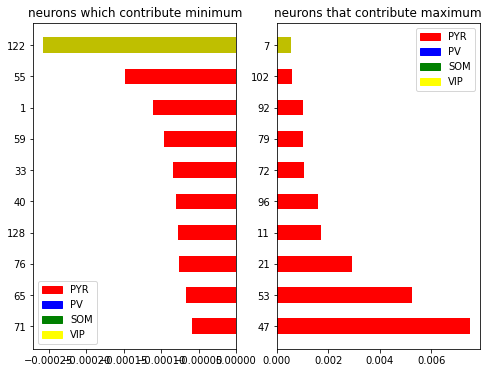

model output [[0.00140162 0.9959     0.00269839]] 1
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 1


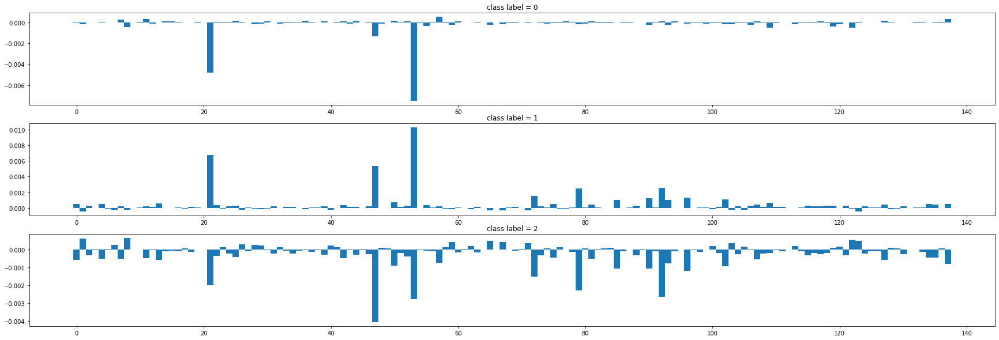

[1 3 4 5] [111  12   7   8]
maximum contribution [ 53  21  47  92  79  72  96  90 102  85]
minimum contribution [103  26   6  40 105  67  65  71 123   1]


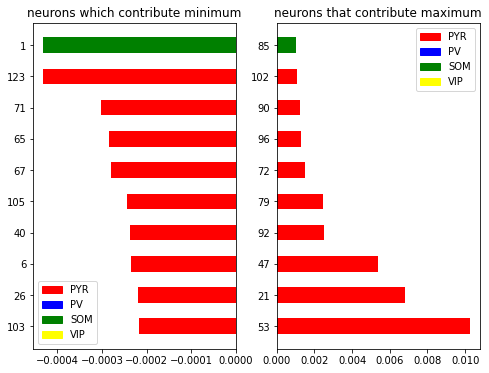

model output [[1.4425385e-04 9.9572146e-01 4.1343276e-03]] 1
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 1


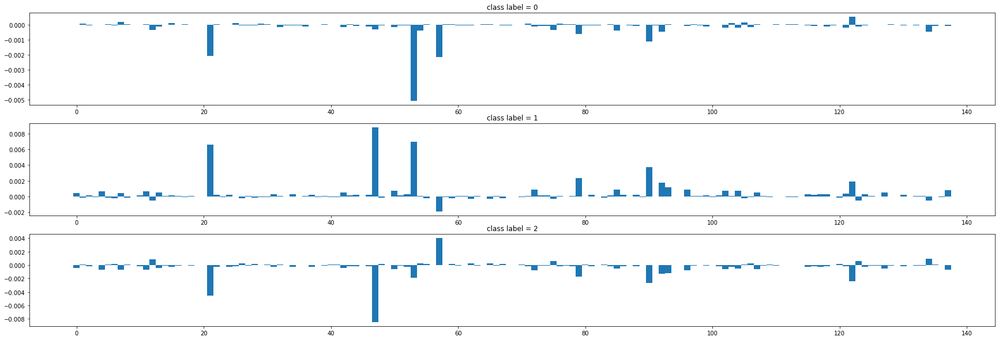

[1 3 4 5] [111  12   7   8]
maximum contribution [ 47  53  21  90  79 122  92  93  85  72]
minimum contribution [105  55  26  62  65  75 134  12 123  57]


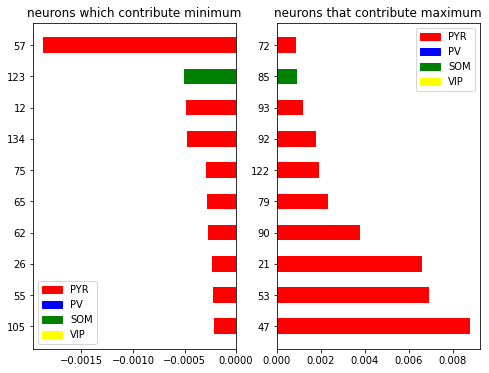

model output [[9.6704389e-06 2.1592097e-04 9.9977440e-01]] 2
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 2


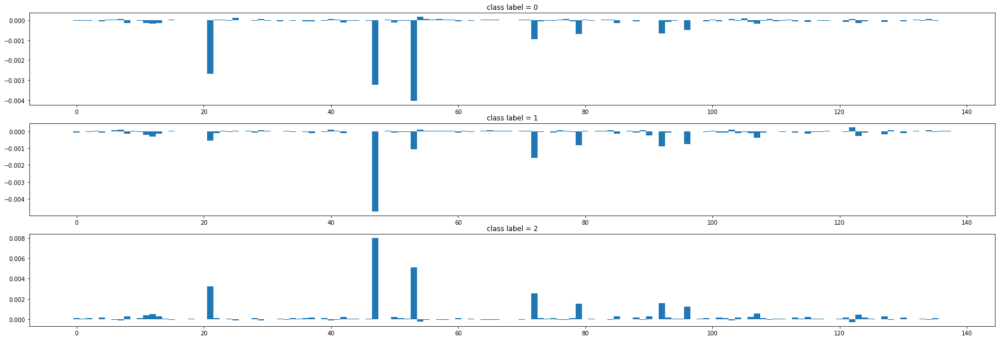

[1 3 4 5] [111  12   7   8]
maximum contribution [ 47  53  21  72  92  79  96 107  12 123]
minimum contribution [ 76 134  57  29  40  25   7 103  54 122]


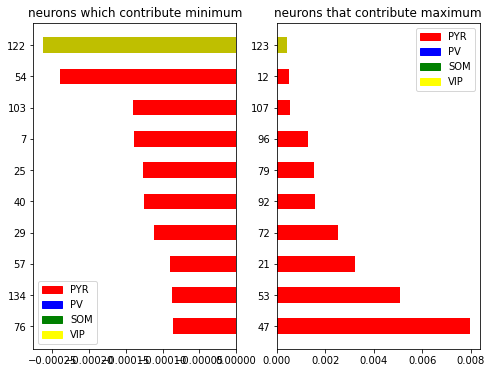

model output [[9.9983847e-01 1.5541413e-04 6.0737457e-06]] 0
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 0


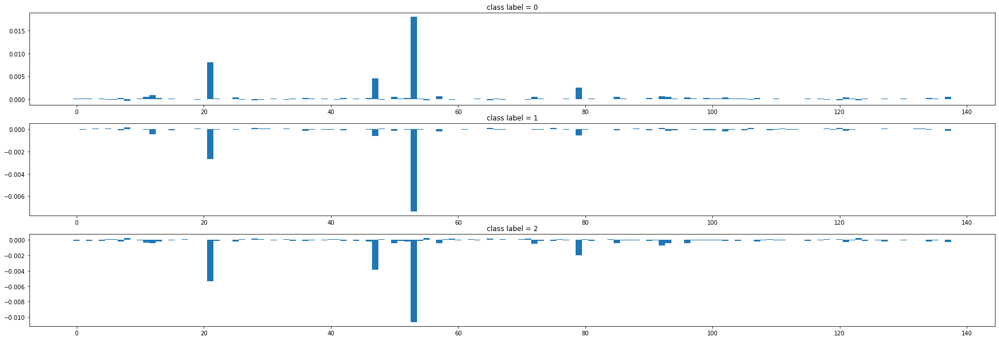

[1 3 4 5] [111  12   7   8]
maximum contribution [53 21 47 79 12 92 57 93 50 72]
minimum contribution [ 59  33  48 106 120 123  55  65  28   8]


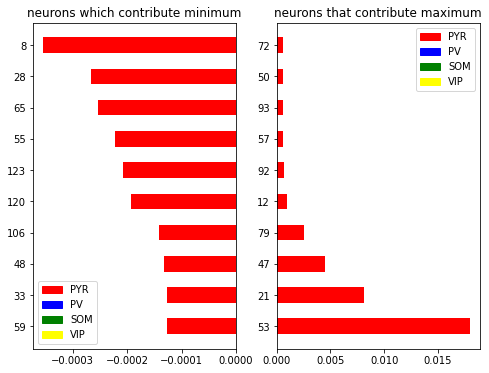

model output [[9.8445107e-06 3.5879787e-04 9.9963129e-01]] 2
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 2


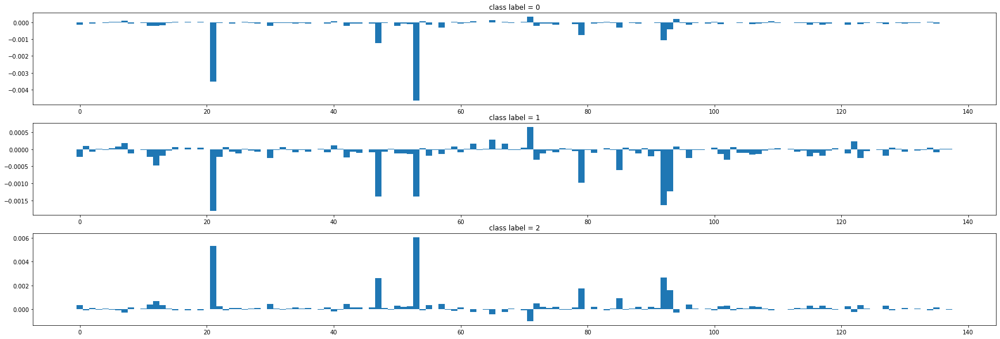

[1 3 4 5] [111  12   7   8]
maximum contribution [53 21 92 47 79 93 85 12 72 30]
minimum contribution [  6  59  40  67 122  62   7  94  65  71]


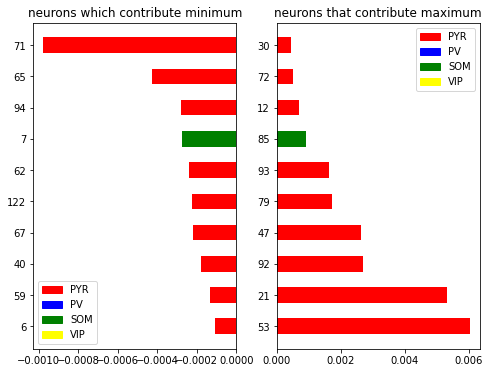

model output [[6.9834864e-01 3.0149058e-01 1.6073593e-04]] 1
ypred not equal to ylabel for test sample 43
model output [[9.9844521e-01 1.5365432e-03 1.8204881e-05]] 0
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 0


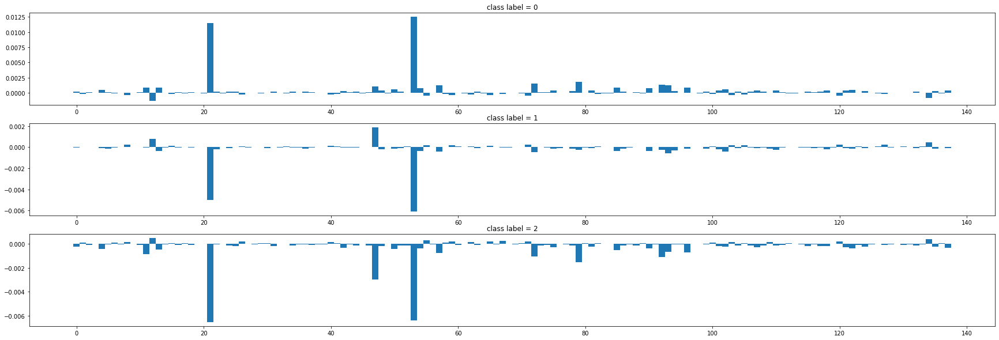

[1 3 4 5] [111  12   7   8]
maximum contribution [53 21 79 72 92 93 57 47 85 96]
minimum contribution [ 40 103  65  59   8  71 120  55 134  12]


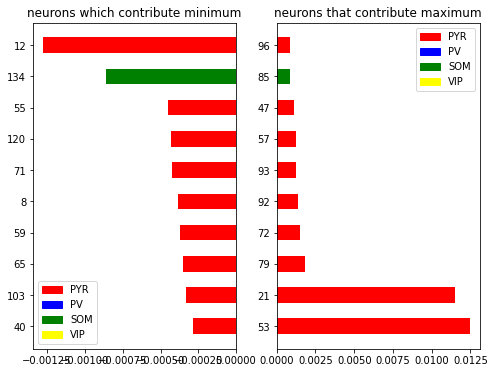

model output [[1.4382285e-05 7.6734571e-04 9.9921823e-01]] 2
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 2


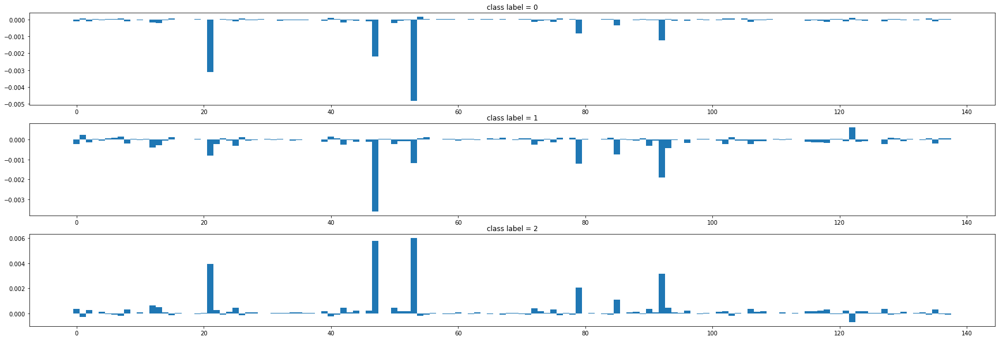

[1 3 4 5] [111  12   7   8]
maximum contribution [53 47 21 92 79 85 12 13 42 50]
minimum contribution [ 55  76  26  15 103   7  54  40   1 122]


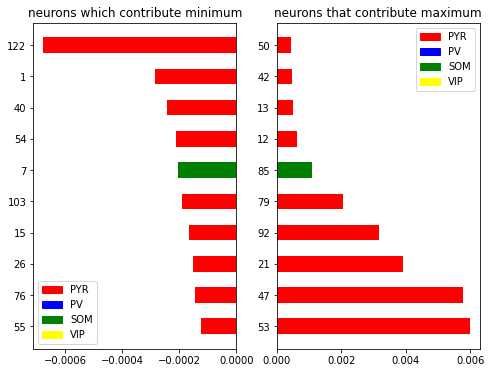

model output [[9.9973267e-01 2.6347910e-04 3.8401263e-06]] 0
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 0


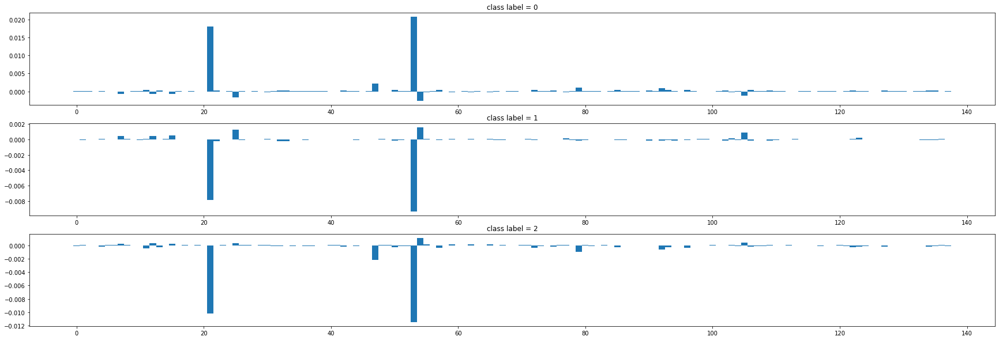

[1 3 4 5] [111  12   7   8]
maximum contribution [53 21 47 79 92 57 72 96 50 93]
minimum contribution [ 59 103  65  55   7  12  15 105  25  54]


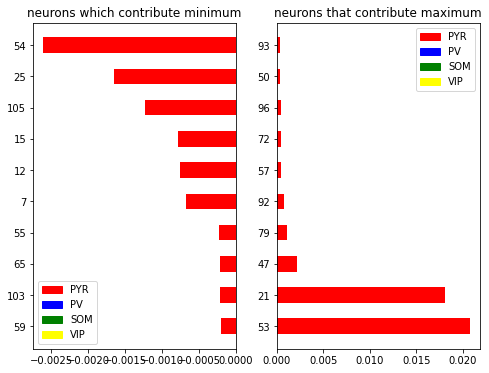

model output [[7.2402172e-06 2.1310452e-04 9.9977964e-01]] 2
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 2


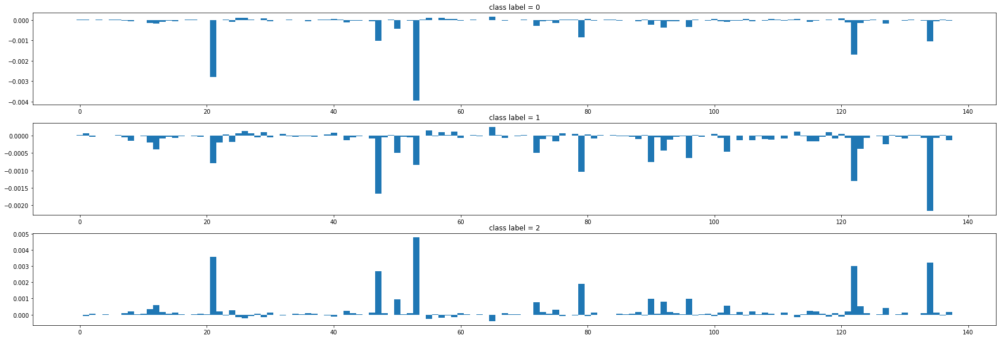

[1 3 4 5] [111  12   7   8]
maximum contribution [ 53  21 134 122  47  79  90  96  50  92]
minimum contribution [120 118  29  25  59 113  57  26  55  65]


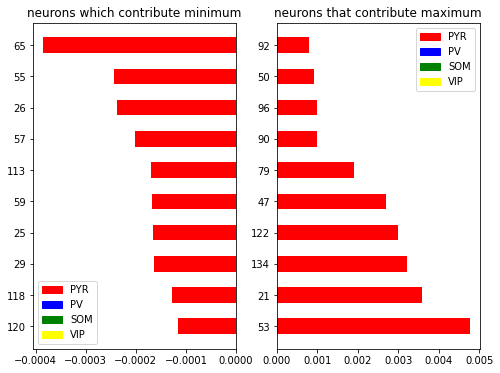

model output [[9.9959987e-01 3.9581963e-04 4.2932411e-06]] 0
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 0


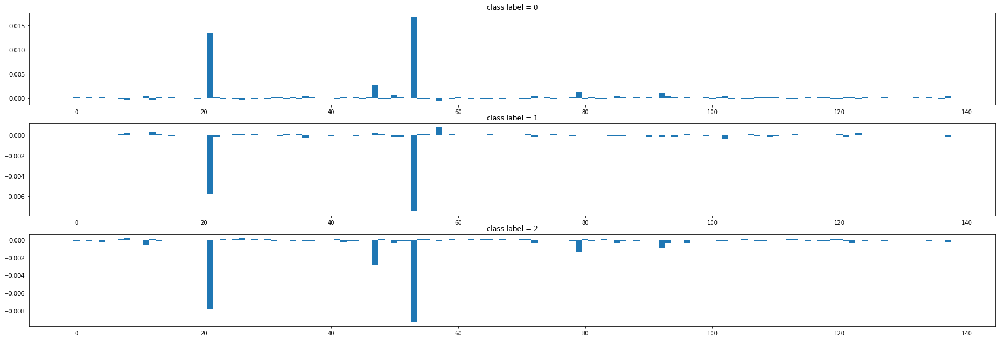

[1 3 4 5] [111  12   7   8]
maximum contribution [ 53  21  47  79  92  50  11  72 102 137]
minimum contribution [ 71 123  55  28  59 120  26  12   8  57]


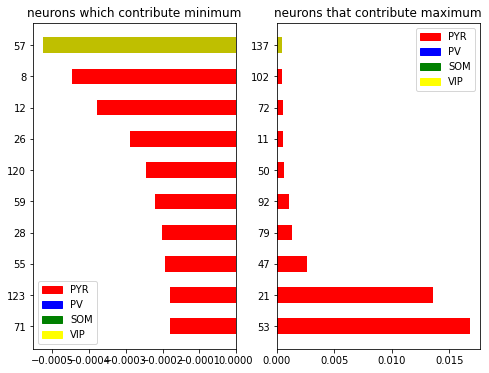

model output [[5.111634e-04 9.986085e-01 8.803491e-04]] 1
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 1


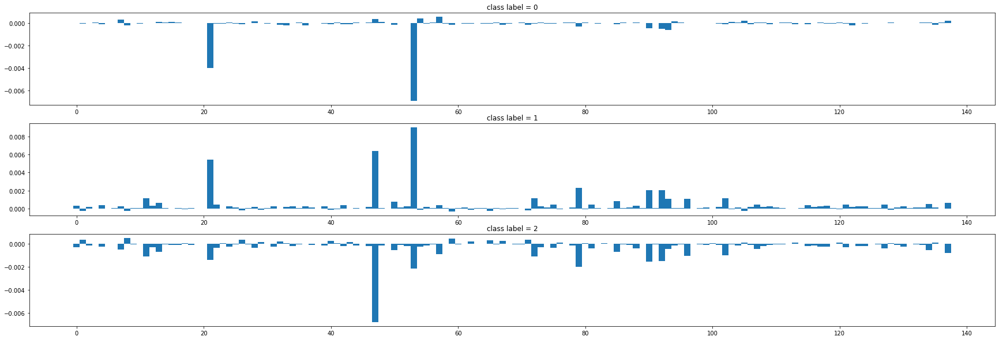

[1 3 4 5] [111  12   7   8]
maximum contribution [ 53  47  21  79  90  92  72  11 102  93]
minimum contribution [ 29  62  40  71  26  65   8   1 105  59]


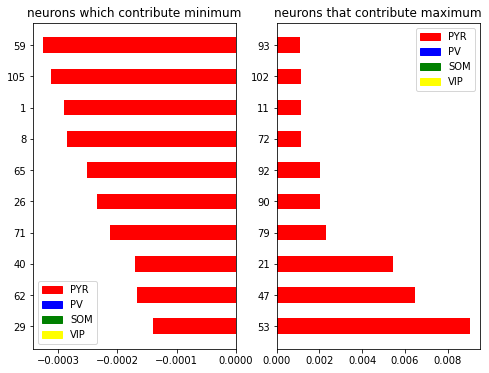

model output [[7.1458018e-04 9.9911636e-01 1.6904662e-04]] 1
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 1


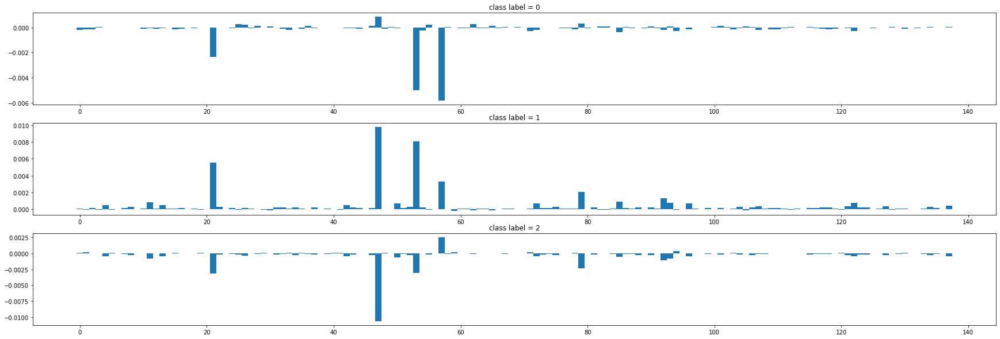

[1 3 4 5] [111  12   7   8]
maximum contribution [ 47  53  21  57  79  92  85  11  93 122]
minimum contribution [ 55   5  25  94  82 105  30  62  65  59]


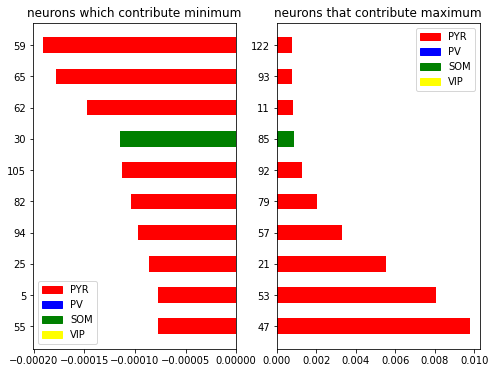

In [ ]:
for i in range(len(y_test)):
  analysis_shap(i,model)

In [ ]:
analysis_shap(2,model)

#label = 0 (post)

model output [[9.9372709e-01 6.2474473e-03 2.5513280e-05]] 0
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 0


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


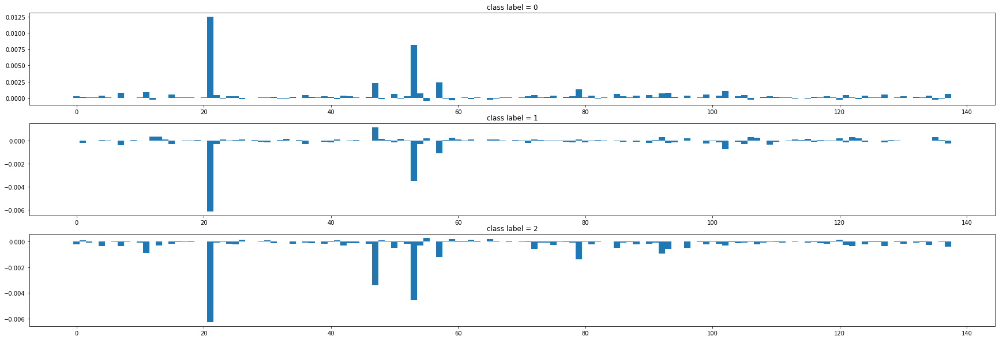

[1 3 4 5] [111  12   7   8]
maximum contribution [ 21  53  57  47  79 102  11  93   7  92]
minimum contribution [ 48  62  26  65 135 120 106  12  59  55]


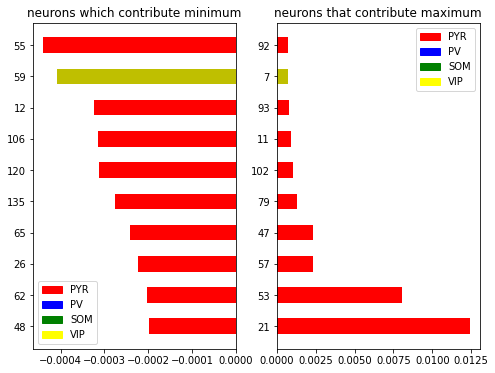

In [ ]:
analysis_shap(1,model)

model output [[9.1307199e-01 8.6761914e-02 1.6613241e-04]] 0
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 0


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


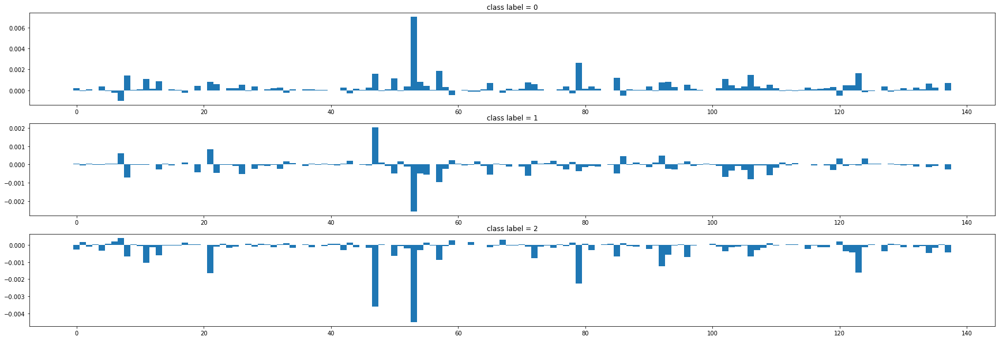

[1 3 4 5] [111  12   7   8]
maximum contribution [ 53  79  57 123  47 106   8  85  50 102]
minimum contribution [  6  17  67  33  78  43  59 120  86   7]


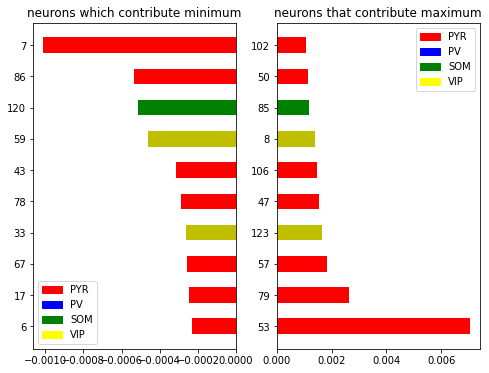

In [ ]:
analysis_shap(6,model)

model output [[9.9971730e-01 2.7778160e-04 4.8790744e-06]] 0
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 0


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


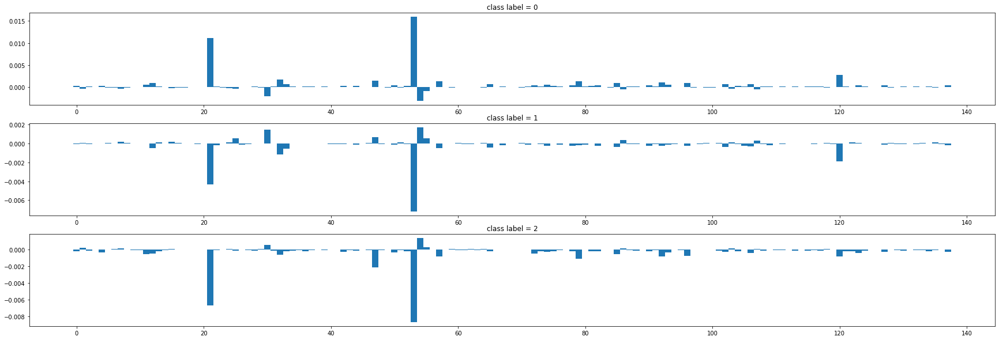

[1 3 4 5] [111  12   7   8]
maximum contribution [ 53  21 120  32  47  79  57  92  96  12]
minimum contribution [ 15   1 103   7  25 107  86  55  30  54]


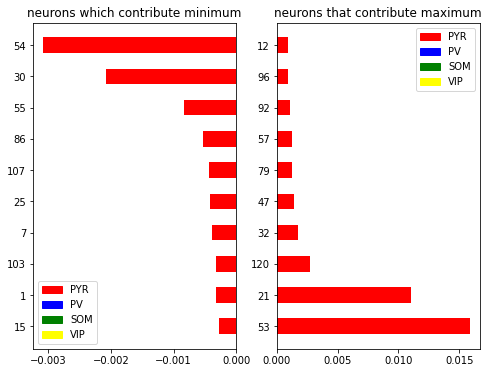

In [ ]:
analysis_shap(7,model)

model output [[9.9903667e-01 9.5500983e-04 8.3917812e-06]] 0
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 0


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


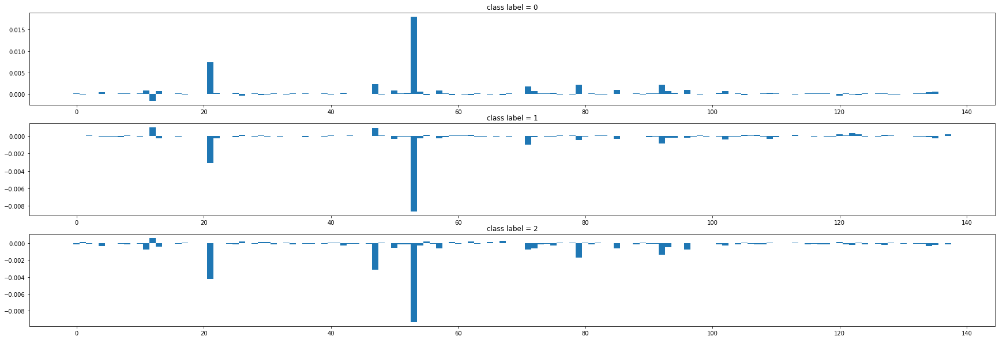

[1 3 4 5] [111  12   7   8]
maximum contribution [53 21 47 92 79 71 96 85 50 57]
minimum contribution [ 59 105  29  67 123  62  55  26 120  12]


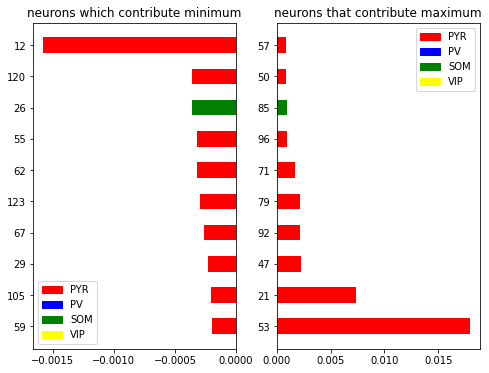

In [ ]:
analysis_shap(10,model)

model output [[9.9896872e-01 1.0232648e-03 7.9727051e-06]] 0
shap output [0.25959143 0.24043258 0.499976  ]
predicted class = 0


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


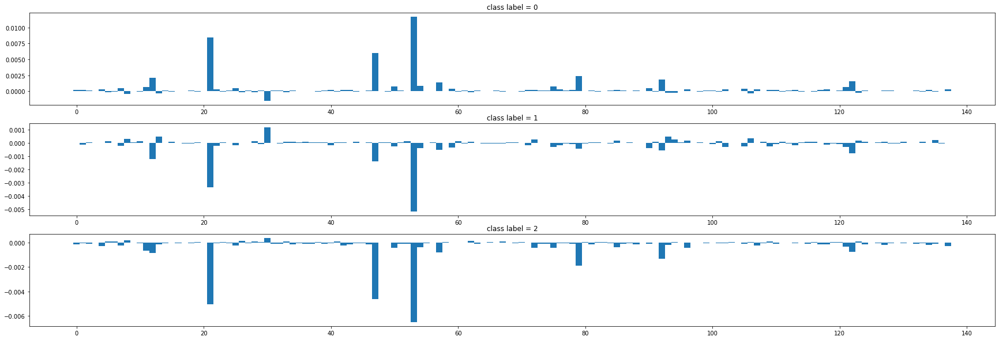

[1 3 4 5] [111  12   7   8]
maximum contribution [ 53  21  47  79  12  92 122  57  54  75]
minimum contribution [  5  62  28 123  93  94  13 106   8  30]


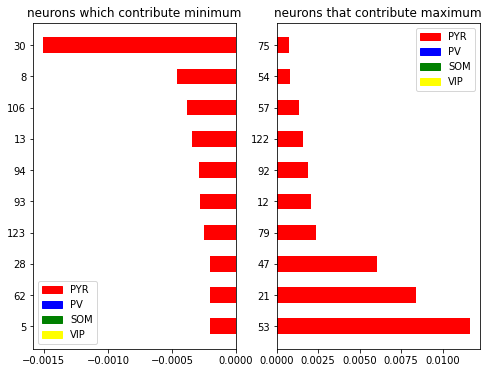

In [ ]:
analysis_shap(13,model)

#label = 0 (pre)

model output [[0.97216034 0.01358606 0.01425356]] 0
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


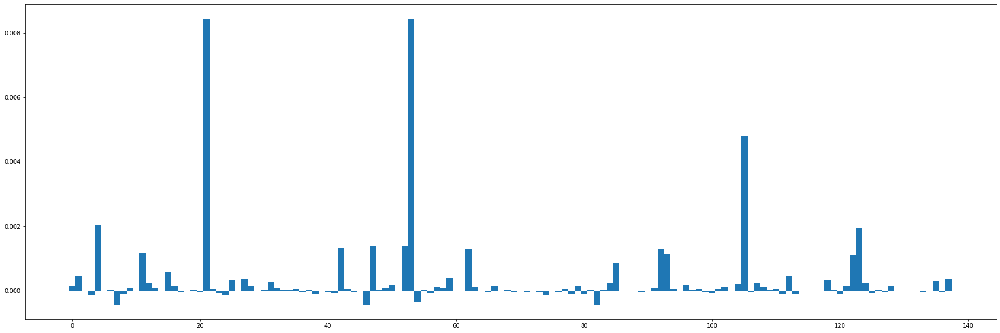

[1 3 4 5] [111  12   7   8]


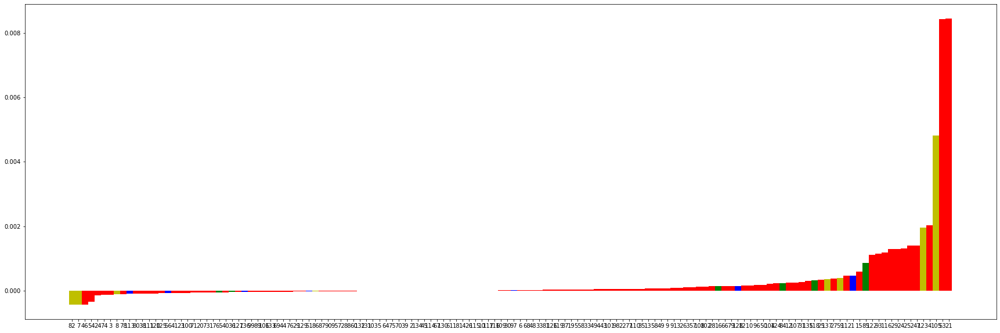

In [ ]:
analysis_shap(4,model)

model output [[0.97452897 0.01063725 0.01483377]] 0
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


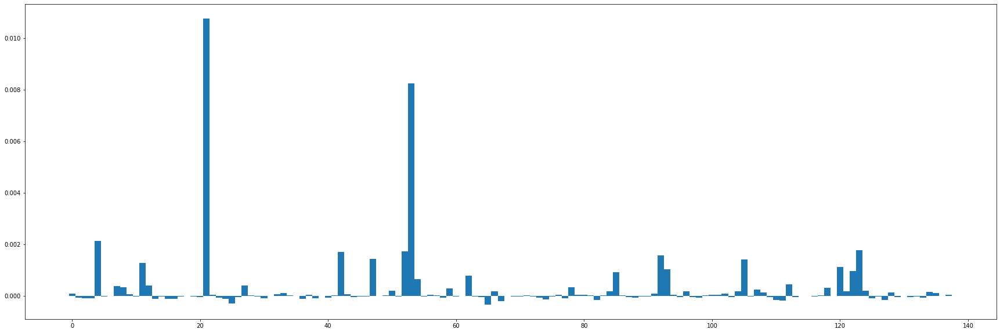

[1 3 4 5] [111  12   7   8]


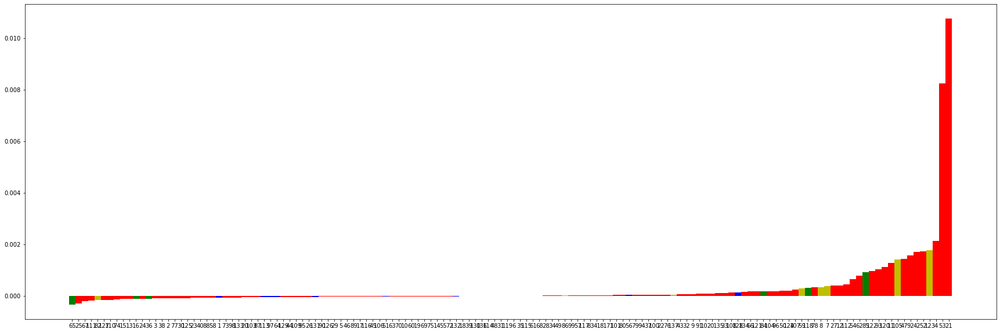

In [ ]:
analysis_shap(5,model)

model output [[0.95887995 0.02600639 0.01511364]] 0
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


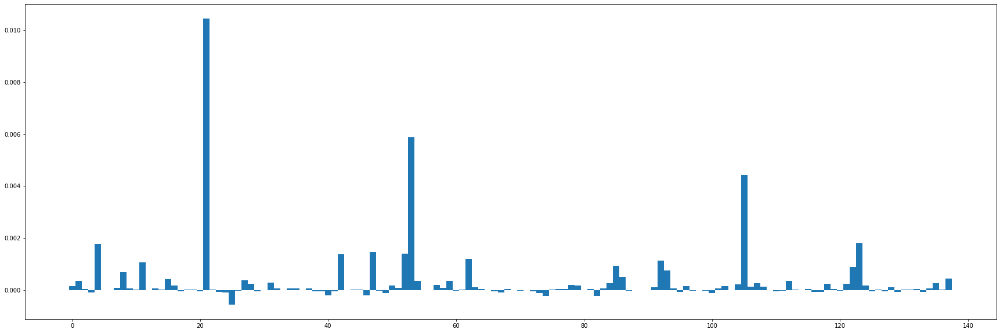

[1 3 4 5] [111  12   7   8]


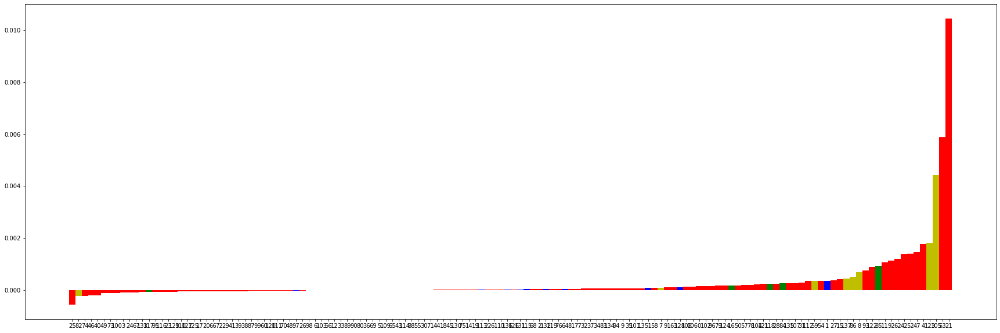

In [ ]:
analysis_shap(11,model)

model output [[0.9660741  0.01725252 0.01667337]] 0
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


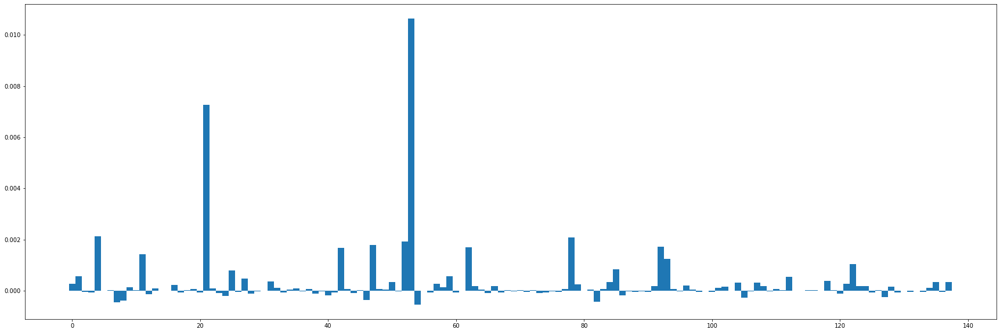

[1 3 4 5] [111  12   7   8]


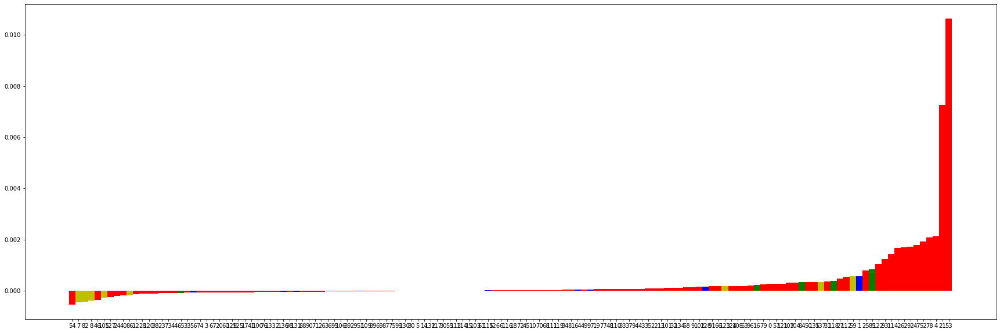

In [ ]:
analysis_shap(13,model)

model output [[0.9358164  0.04322007 0.02096348]] 0
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


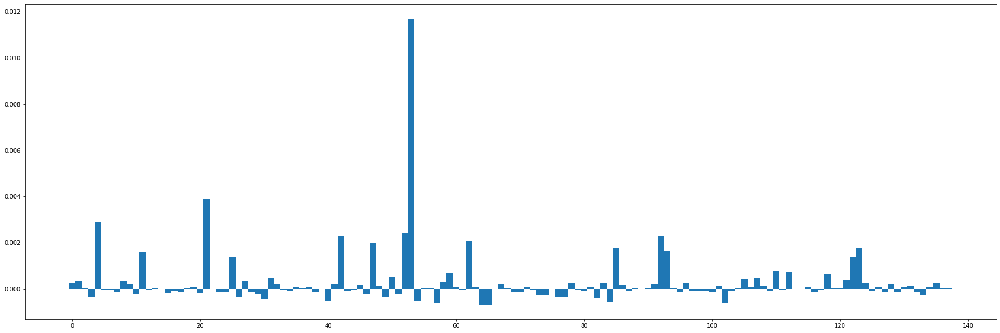

[1 3 4 5] [111  12   7   8]


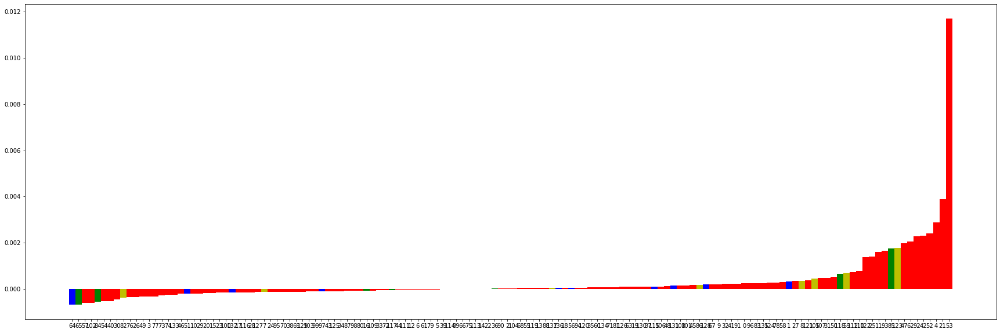

In [ ]:
analysis_shap(14,model)

model output [[0.96980953 0.01324078 0.0169497 ]] 0
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


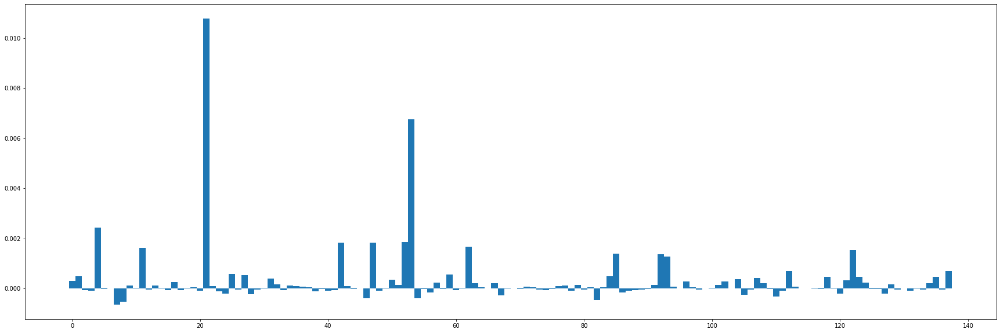

[1 3 4 5] [111  12   7   8]


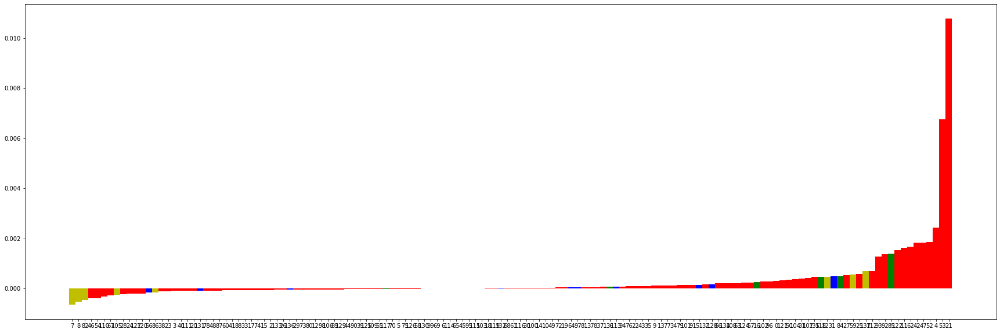

In [ ]:
analysis_shap(16,model)

model output [[0.59242815 0.3884968  0.01907503]] 0
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


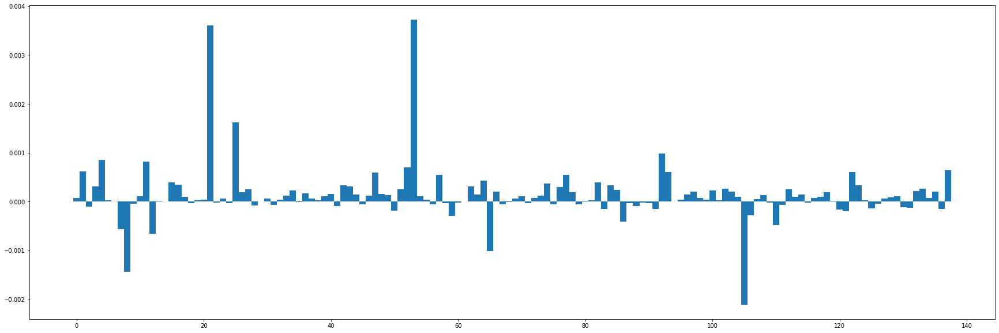

[1 3 4 5] [111  12   7   8]


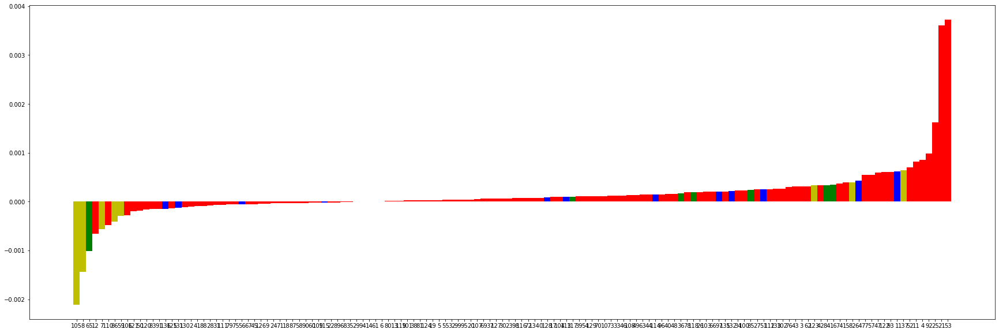

In [ ]:
analysis_shap(18,model)

In [ ]:
analysis_shap(22,model)

model output [[0.02803164 0.00205771 0.9699107 ]] 0
ypred not equal to ylabel


#label = 1

model output [[0.04580809 0.9510926  0.00309929]] 1
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


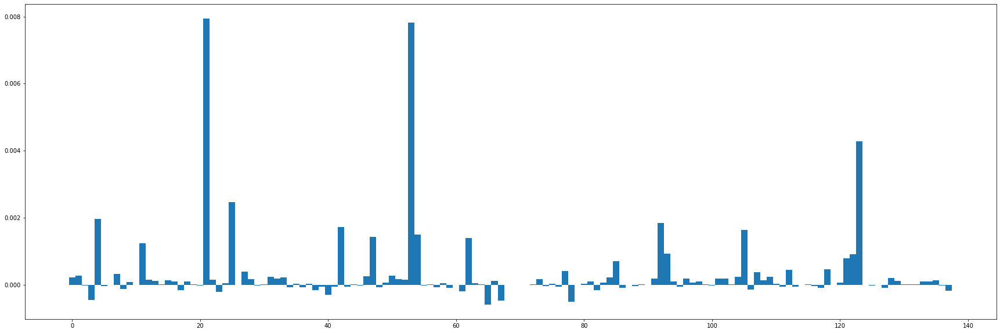

[1 3 4 5] [111  12   7   8]


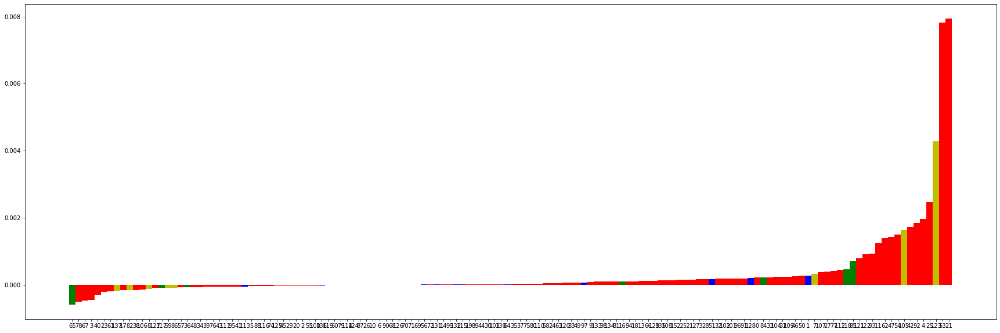

In [ ]:
analysis_shap(1,model)

model output [[0.06359767 0.93166435 0.00473789]] 1
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


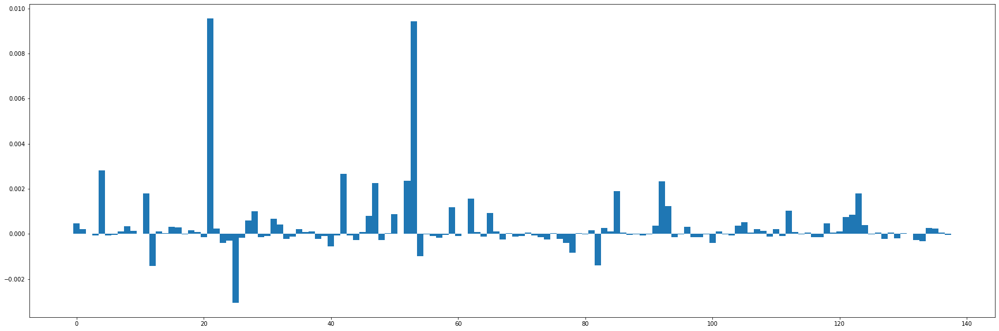

[1 3 4 5] [111  12   7   8]


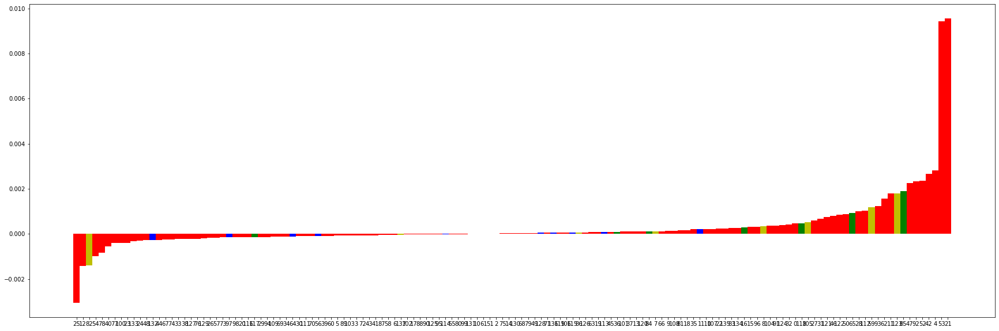

In [ ]:
analysis_shap(6,model)

model output [[0.41526702 0.57308704 0.01164601]] 1
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


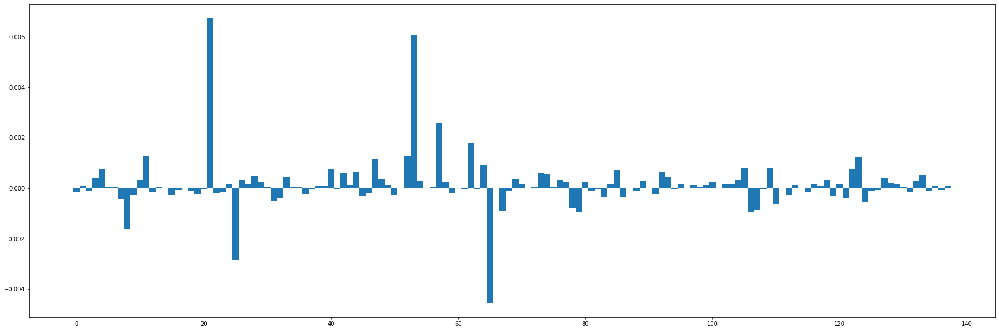

[1 3 4 5] [111  12   7   8]


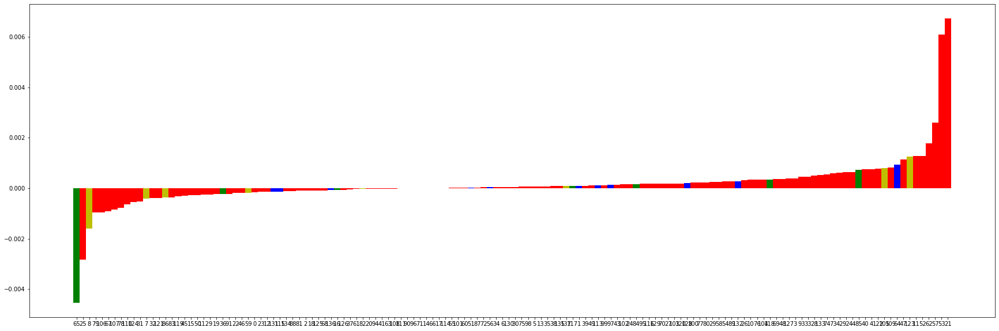

In [ ]:
analysis_shap(7,model)

model output [[0.06898528 0.92721367 0.00380097]] 1
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


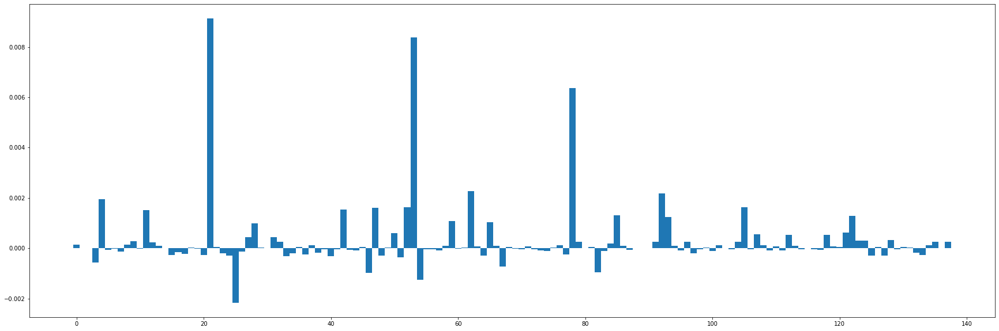

[1 3 4 5] [111  12   7   8]


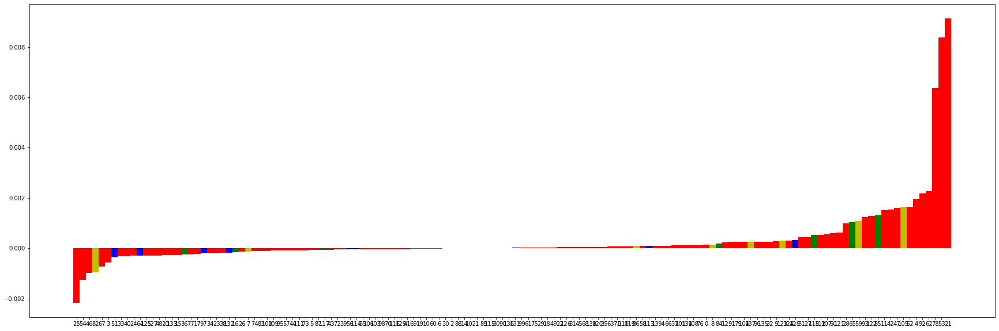

In [ ]:
analysis_shap(8,model)

model output [[0.04728871 0.94801337 0.00469786]] 1
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


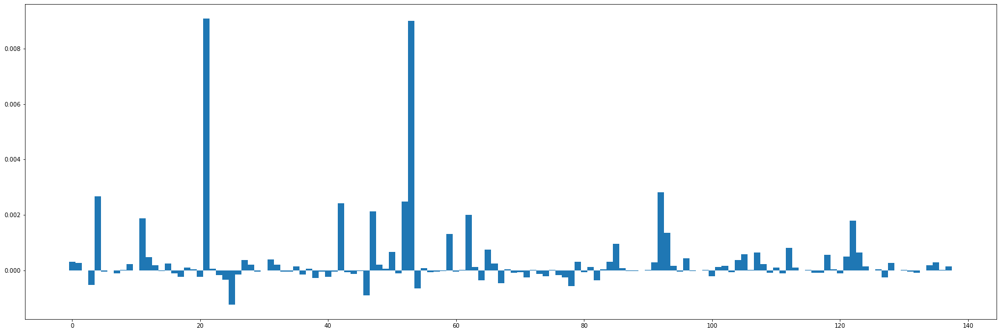

[1 3 4 5] [111  12   7   8]


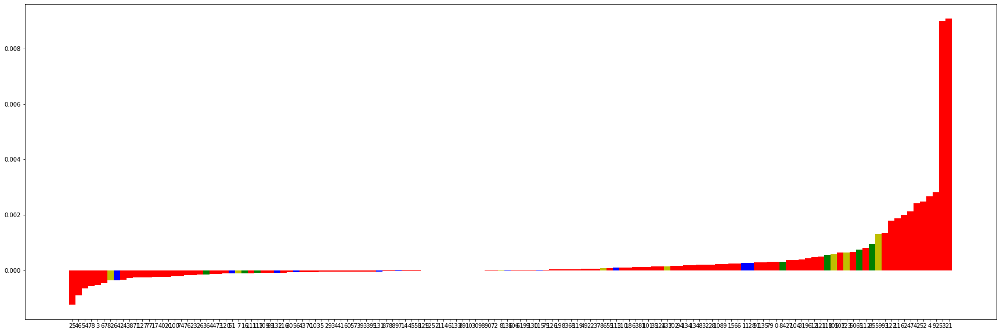

In [ ]:
analysis_shap(9,model)

model output [[0.05329603 0.9438889  0.00281507]] 1
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


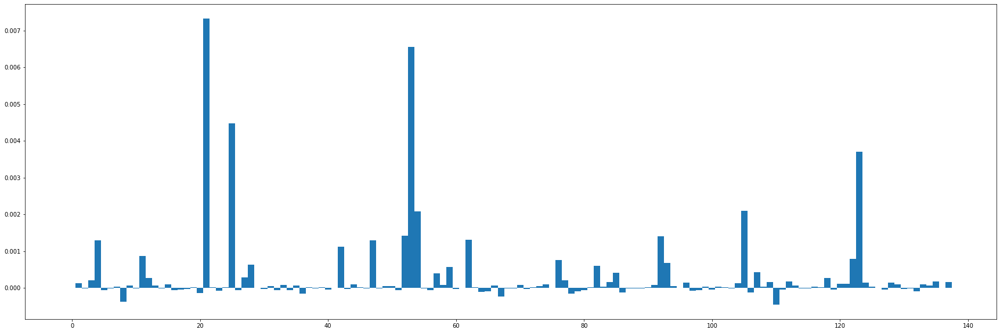

[1 3 4 5] [111  12   7   8]


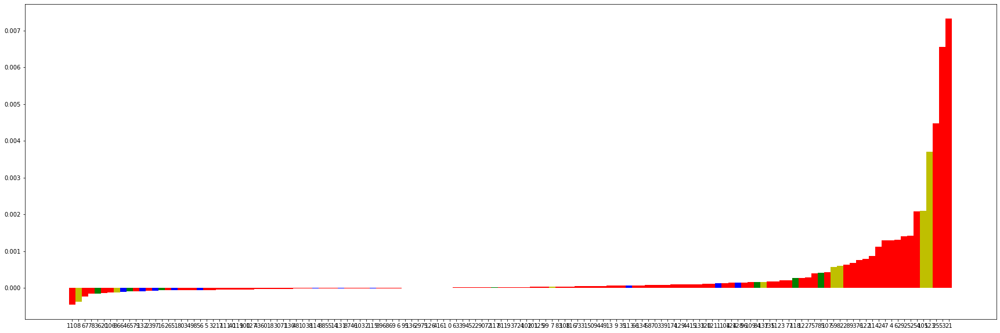

In [ ]:
analysis_shap(24,model)

#label = 2

model output [[0.01423127 0.00276895 0.98299974]] 2
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


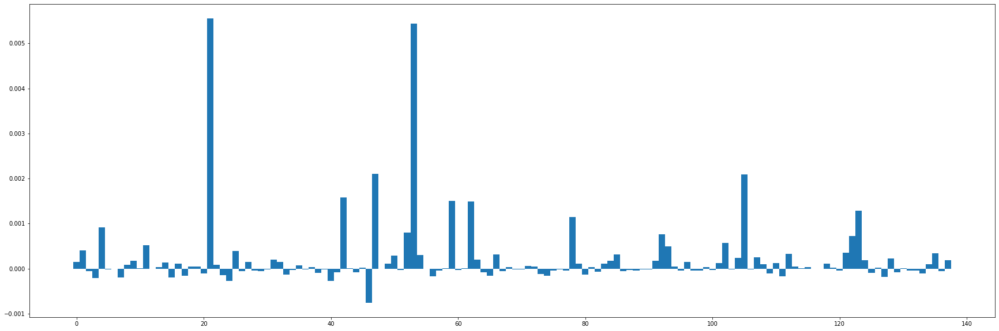

[1 3 4 5] [111  12   7   8]


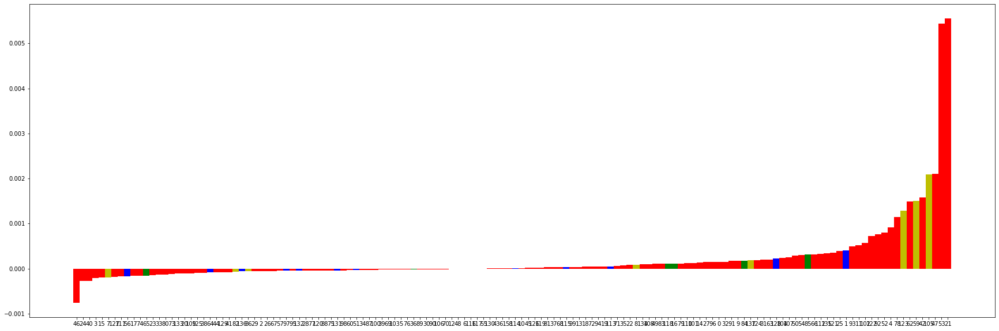

In [ ]:
analysis_shap(0,model)

model output [[0.0140124  0.00302822 0.9829594 ]] 2
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


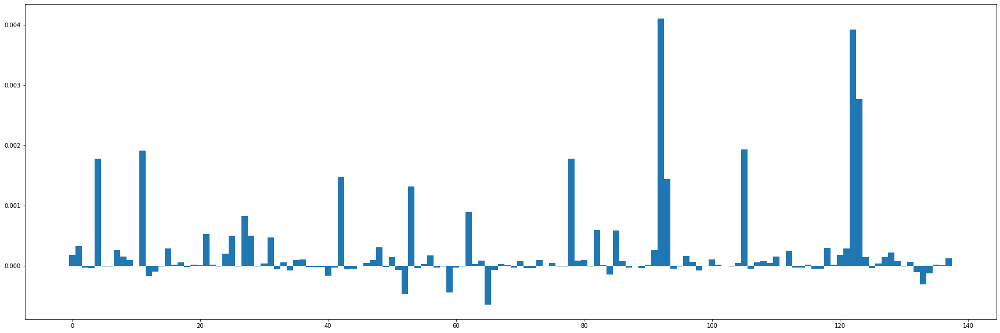

[1 3 4 5] [111  12   7   8]


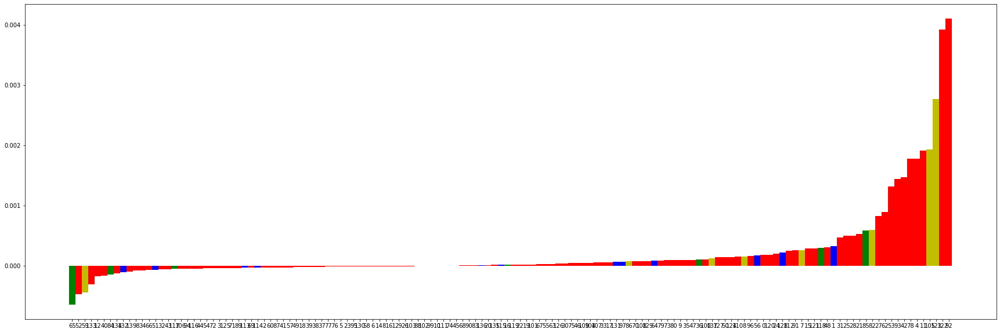

In [ ]:
analysis_shap(2,model)

model output [[0.01342685 0.00294384 0.9836293 ]] 2
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


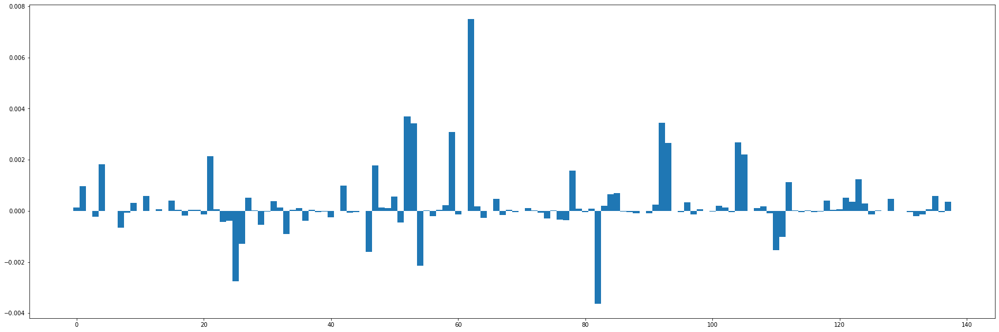

[1 3 4 5] [111  12   7   8]


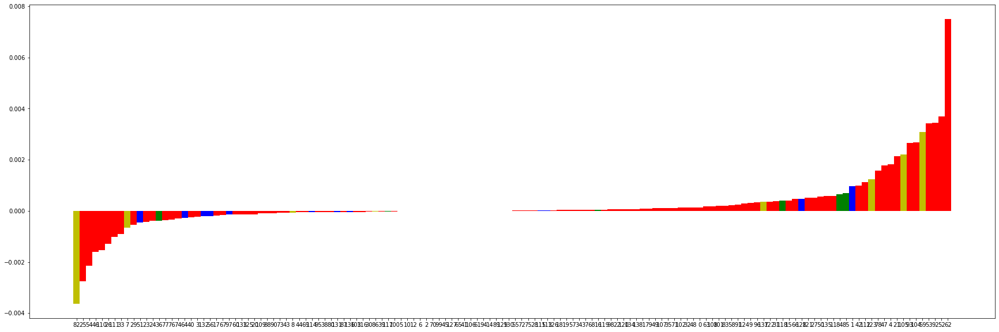

In [ ]:
analysis_shap(3,model)

model output [[0.01393542 0.00288554 0.983179  ]] 2
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


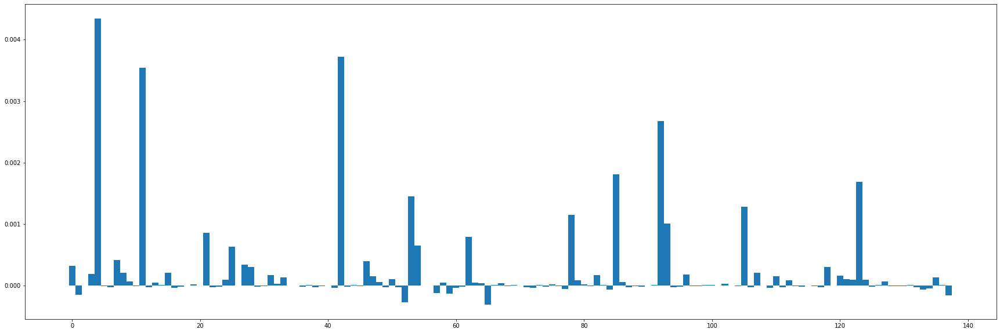

[1 3 4 5] [111  12   7   8]


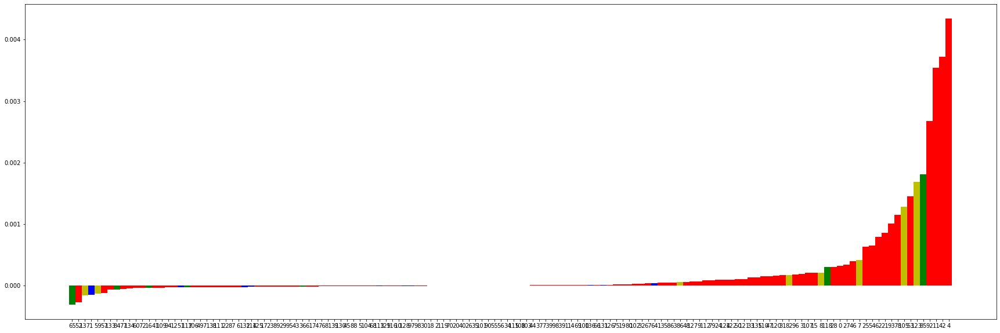

In [ ]:
analysis_shap(10,model)

model output [[0.01403694 0.00291986 0.98304313]] 2
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


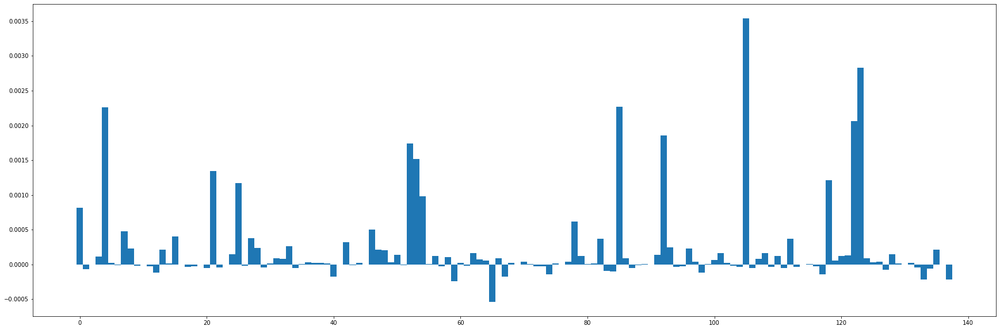

[1 3 4 5] [111  12   7   8]


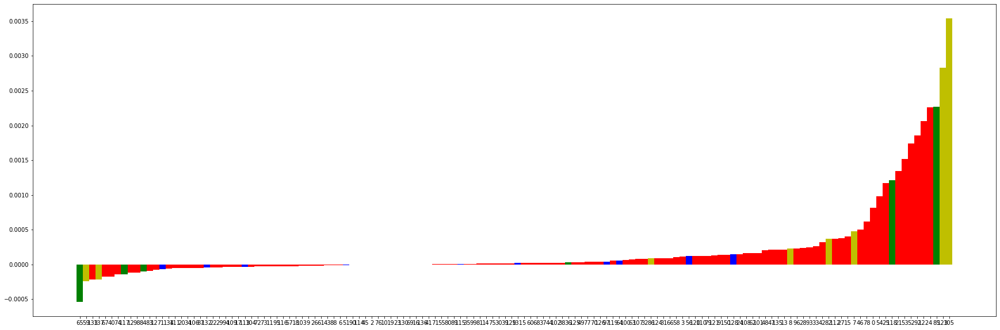

In [ ]:
analysis_shap(12,model)

model output [[0.01401658 0.00299509 0.9829883 ]] 2
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


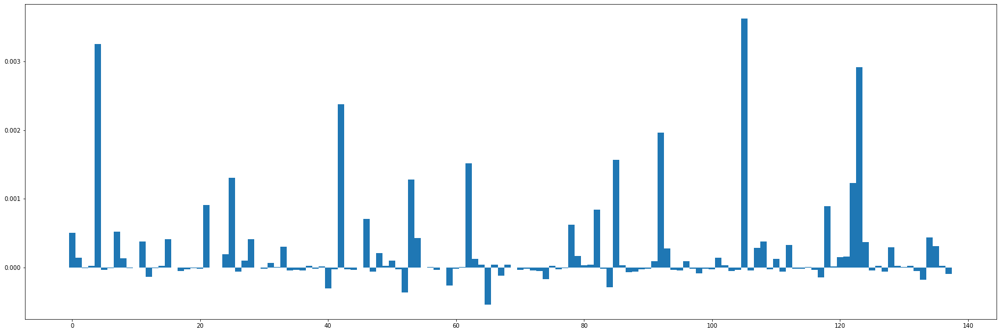

[1 3 4 5] [111  12   7   8]


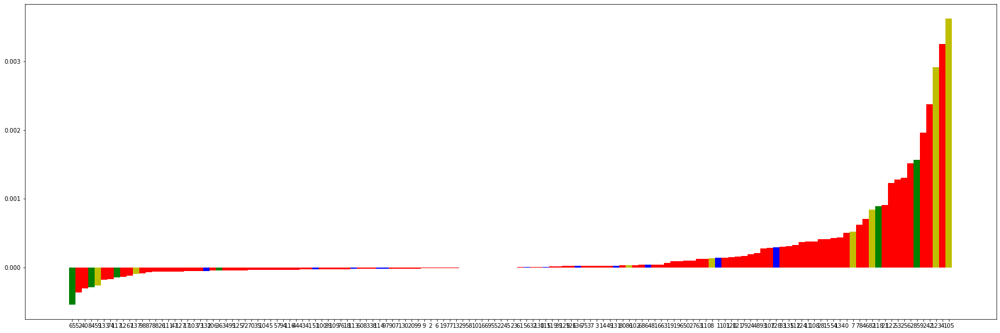

In [ ]:
analysis_shap(15,model)

model output [[0.0138643  0.00282252 0.98331314]] 2
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


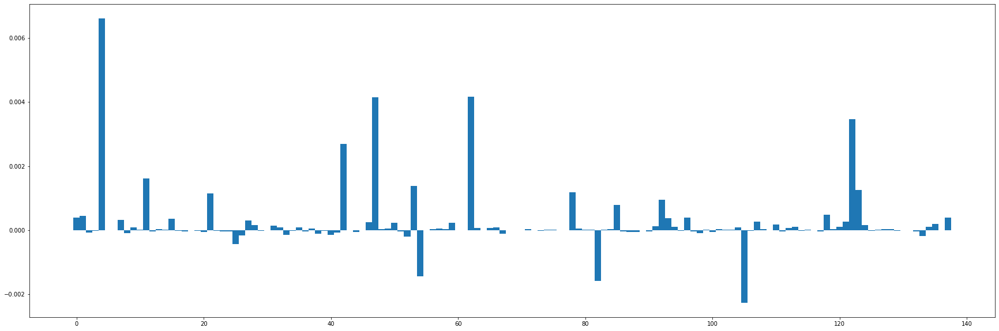

[1 3 4 5] [111  12   7   8]


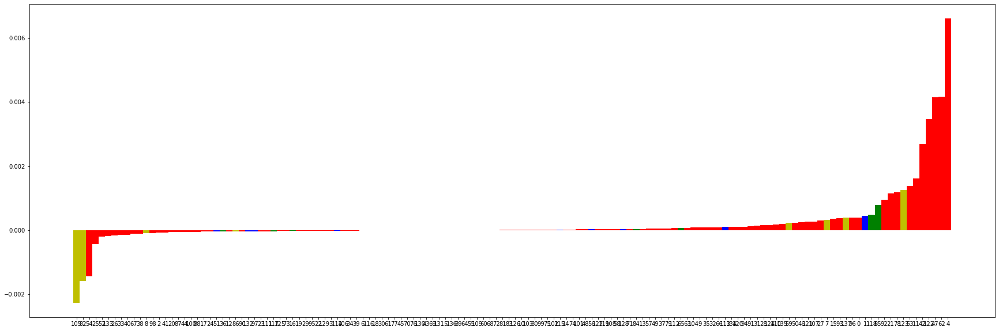

In [ ]:
analysis_shap(17,model)

model output [[0.01411758 0.00281045 0.9830719 ]] 2
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


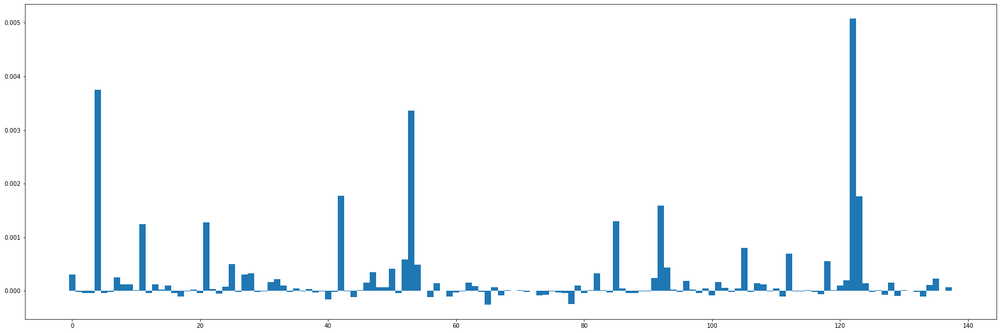

[1 3 4 5] [111  12   7   8]


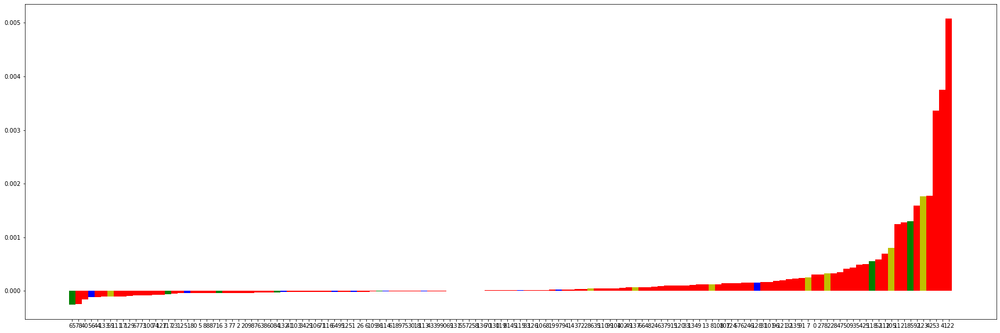

In [ ]:
analysis_shap(19,model)

model output [[0.01415817 0.00262861 0.9832132 ]] 2
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


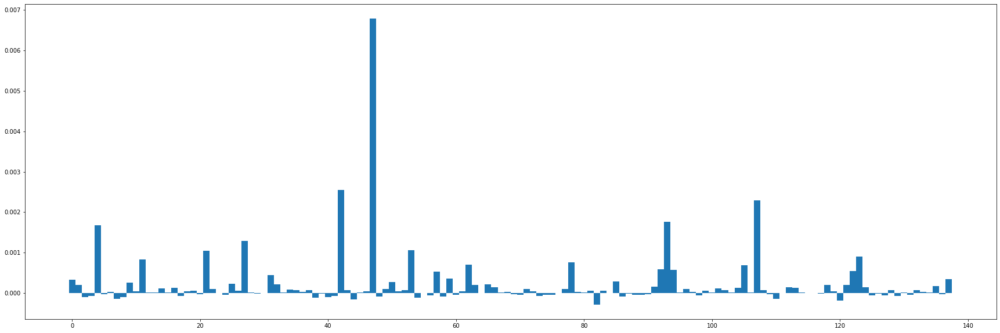

[1 3 4 5] [111  12   7   8]


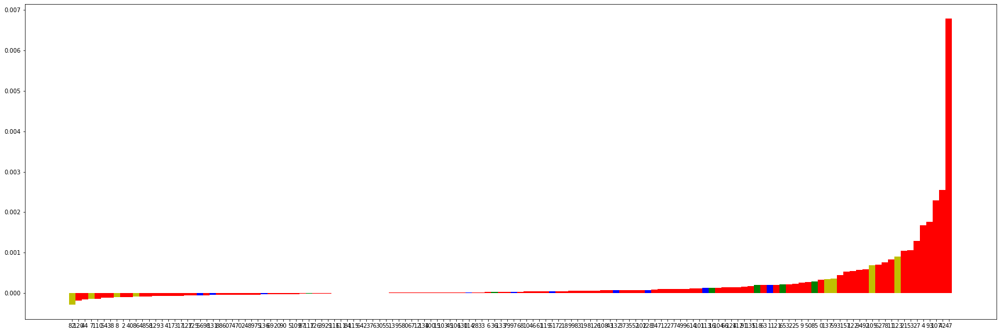

In [ ]:
analysis_shap(20,model)

model output [[0.01401884 0.00288619 0.983095  ]] 2
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


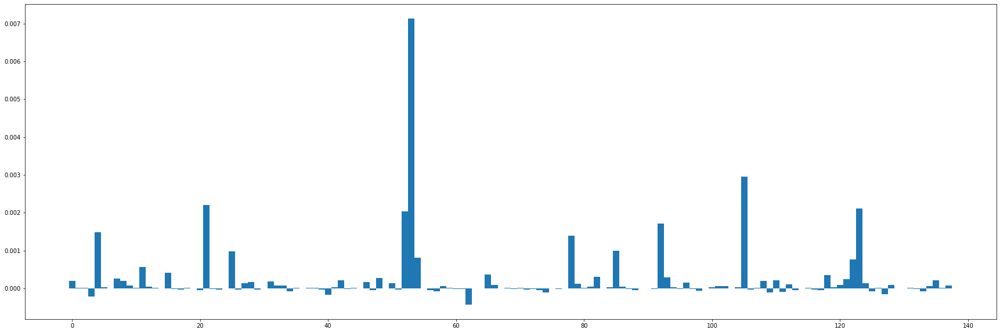

[1 3 4 5] [111  12   7   8]


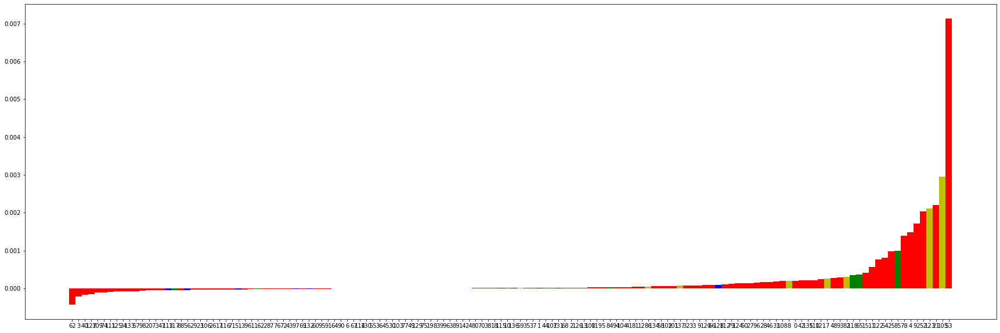

In [ ]:
analysis_shap(21,model)

model output [[0.01412866 0.00290805 0.9829633 ]] 2
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


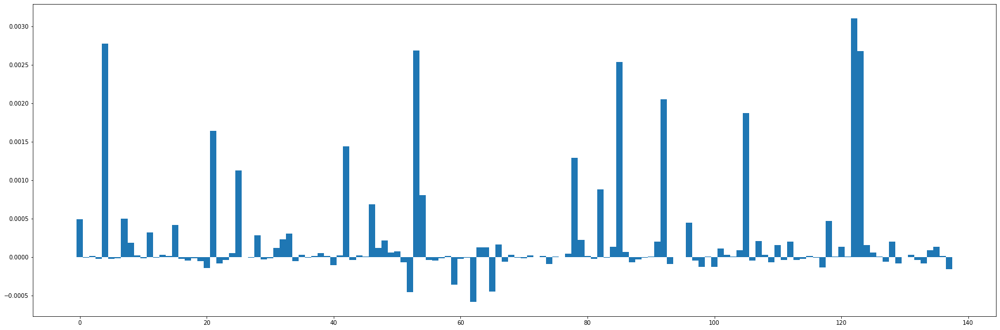

[1 3 4 5] [111  12   7   8]


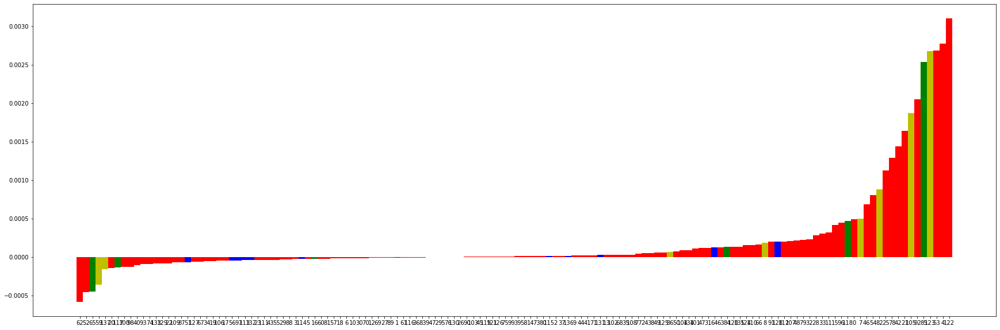

In [ ]:
analysis_shap(23,model)

model output [[0.01382777 0.00290271 0.98326945]] 2
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


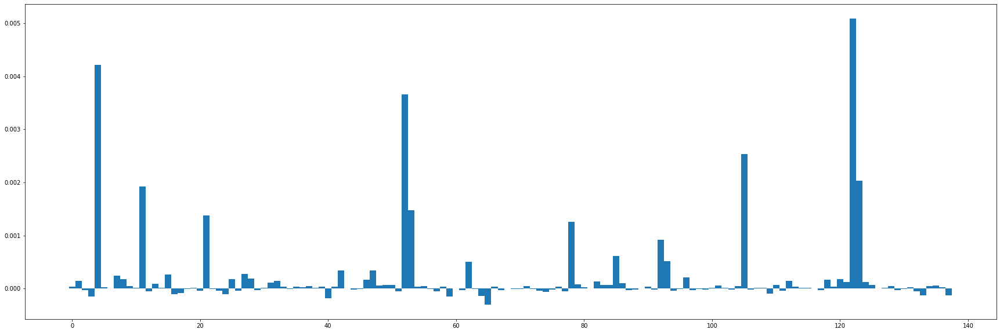

[1 3 4 5] [111  12   7   8]


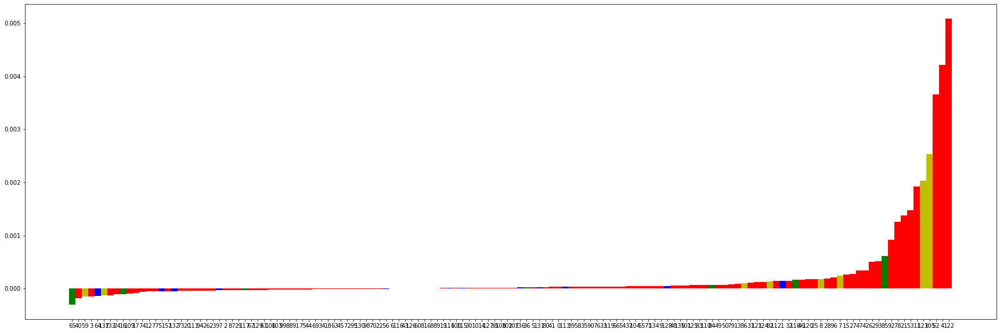

In [ ]:
analysis_shap(25,model)

model output [[0.0141148  0.00276038 0.98312485]] 2
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


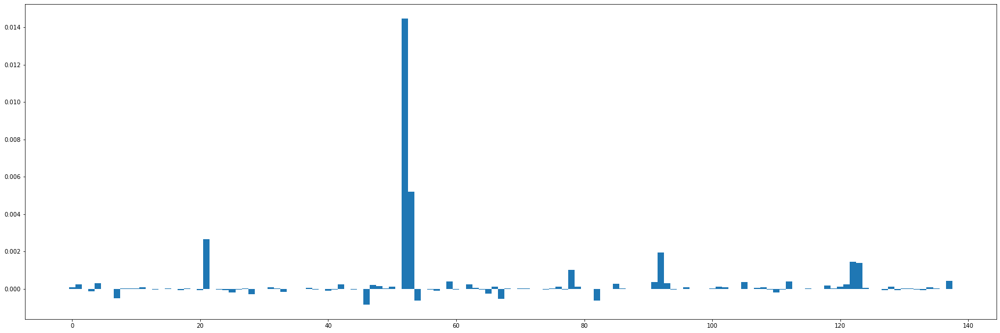

[1 3 4 5] [111  12   7   8]


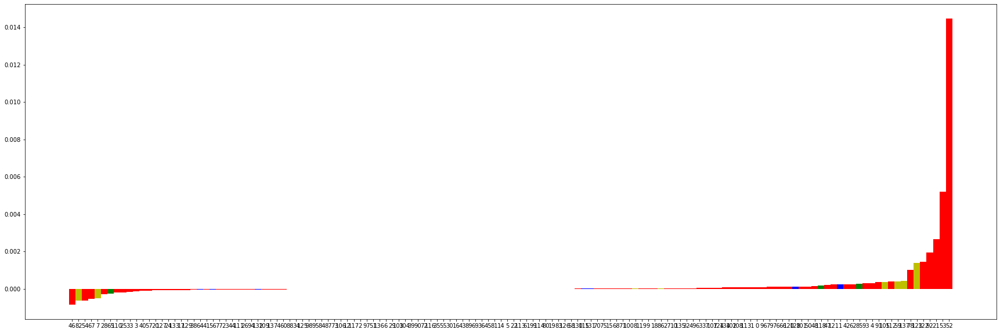

In [ ]:
analysis_shap(26,model)

# Extras

In [ ]:
b = X_test[0].reshape(1,17,138)
print(b.shape)
ypred = model.predict(b)
print(ypred)
print(y_test[0])

(1, 17, 138)
[[0.01423127 0.00276895 0.98299974]]
2


`Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.


In [ ]:
np.argmax(ypred)

2

In [ ]:
features = list(range(0,138))
explainer = shap.DeepExplainer(model, X_trn)
print(type(explainer))

keras is no longer supported, please use tf.keras instead.
Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


<class 'shap.explainers._deep.Deep'>


In [ ]:
print(explainer.expected_value)

[0.2794182  0.23259489 0.48798674]


In [ ]:
shap_values = explainer.shap_values(b)
shap.initjs()
shap.force_plot(explainer.expected_value[0], shap_values[0][0][2], features) #

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[1][0][2], features) #

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value[0], shap_values[2][0][2], features) #

In [ ]:
print(np.array(shap_values).shape) # axis = 0 represent shap values for each decision taken(y =0,1,2)

(3, 1, 17, 138)


In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value[2], shap_values[2][0][2], features)

In [ ]:
shap_values[0][0].shape

(17, 138)

In [ ]:
mean = np.mean(shap_values[0][0],axis = 0) #mean value for all time steps along axis = 0 with y =0
shap.initjs()
shap.force_plot(explainer.expected_value[0], mean, features)

In [ ]:
mean1 = np.mean(shap_values[1][0],axis = 0) #mean value for all time steps when y = 1
shap.initjs()
shap.force_plot(explainer.expected_value[1], mean1, features)

In [ ]:
mean2 = np.mean(shap_values[2][0],axis = 0) #mean value for all time steps when y = 2
shap.initjs()
shap.force_plot(explainer.expected_value[2], mean2, features)

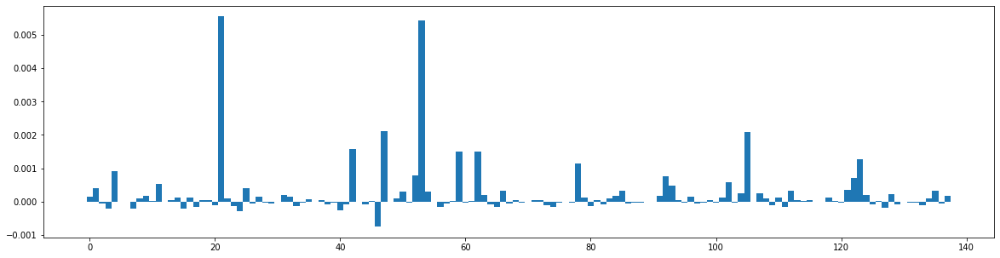

In [ ]:
from matplotlib import pyplot as plt
plt.rcParams["figure.figsize"] = (20,10)
plt.bar(features,mean2,1)
plt.show()

In [ ]:
ind = np.argsort(mean2)
print(ind)

[ 46  24  40   3  15   7 127 111  56  17  74  65  23  33  80  73 133  20
 109 125  38  64  44 129  41  82 136  86  29   2  26  67  57  97  95 132
  28  77 120  88  75 131  98  60  51  34  87 100  39  69 103   5  76  36
  89  30  90 106  70  12  48   6 116 117  55 130  43  61  58 114  10  45
 126 119  81  37  68 115  99  13  18  72  94  19 113  71  35  22   8 134
 108  49  83 118  16  79 110 101  14  27  96   0  32  91   9  84 137 124
  31  63 128 104 107  50  54  85  66 112 135 121  25   1  93  11 102 122
  92  52   4  78 123  62  59  42 105  47  53  21]


In [ ]:
a = data['CELLLAB_ALL'][0][0].reshape(138)
unique, counts = np.unique(a, return_counts=True)

In [ ]:
print(unique,counts)

[1 3 4 5] [111  12   7   8]


In [ ]:
 a = np.array([1]*111 + [3]*12 + [4]*7 + [5]*8)

NameError: ignored

In [ ]:
colors = []
for i in a[ind]:
  if(i == 1):
    colors.append('r') #PYR
  elif(i == 3):
    colors.append('b') #PV
  elif(i == 4):
    colors.append('g') #SOM
  elif(i == 5):
    colors.append('y') #VIP
  else:
    colors.append('m') #others

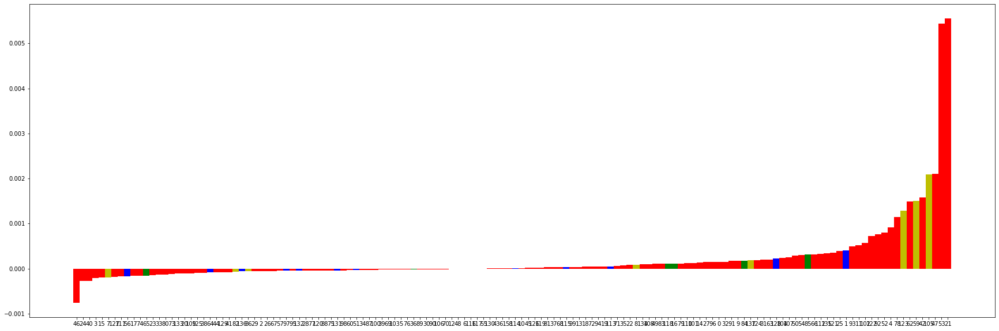

In [ ]:
plt.rcParams["figure.figsize"] = (30,10)
plt.bar(list(map(str,ind)),mean2[ind],1,color = colors)
plt.show()

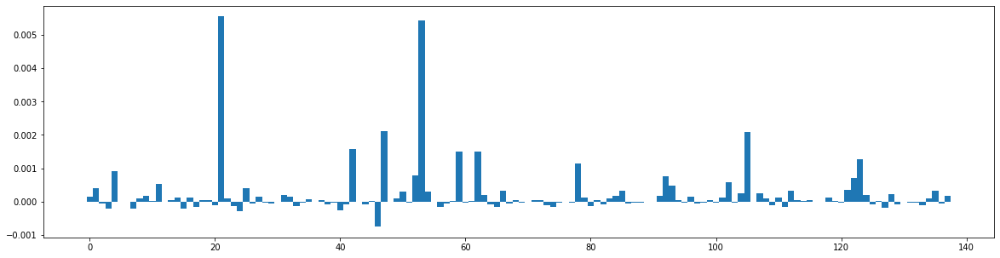

In [ ]:
plt.bar(ind,1,width = 1, color = colors)
plt.show()

In [ ]:
import xgboost

# train XGBoost model
X,y = shap.datasets.adult()
model = xgboost.XGBClassifier().fit(X, y)

# compute SHAP values
explainer = shap.Explainer(model, X)
shap_values = explainer(X)

100%|===================| 32536/32561 [00:37<00:00]       

In [ ]:
print(type(shap_values))

<class 'shap._explanation.Explanation'>
